## Capstone Project - Gaurav Raizada

### Problem Statement

#### Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores. Currently, the forecasting is taken care of by the store managers who are tasked with forecasting daily sales for the next six weeks. 

As expected, store sales are influenced by many factors, including promotional campaigns, competition, state holidays, seasonality, and locality.

With thousands of individual managers predicting sales based on their unique circumstances and intuitions, the accuracy of the forecasts is quite varied. To overcome this problem, the company has hired you as a data scientist to work on the forecasting problem. As part of your job role, you are tasked with building a forecasting model to forecast the daily sales for the next six weeks. To help you with the same, you have been provided with historical sales data for 1,115 Rossmann stores.

#### Data definition

The data is provided in two tables, stores and train. The store table contains the metadata for every single store including the following: 

- Store - an Id that represents the store
- StoreType - differentiates between 4 different store models: a, b, c, d
- Assortment - describes an assortment level: a = basic, b = extra, c = extended
- CompetitionDistance - describes thedistance in meters to the nearest competitor store
- CompetitionOpenSince[Month/Year] - gives the approximate year and month of the time the nearest competitor was opened
- Promo2 - Promo2 is a continuing and consecutive promotion for some stores: 0 = store is not participating, 1 = store is participating
- Promo2Since[Year/Week] - describes the year and calendar week when the store started participating in Promo2
- PromoInterval - describes the consecutive intervals Promo2 is started, naming the months the promotion is started anew. E.g. "Feb, May, Aug, Nov" means each round starts in February, May, August, November of any given year for that store

***The train table contains the sales data for individual stores at a daily level along with the details about the day***

- Store - a unique Id for each store
- DayOfWeek - Describes the day of the week (1 - Monday till 7 - Sunday)
- Date - Describes the date on the day
- Sales - the turnover for any given day (this is what you are forecasting)
- Customers - the number of customers on a given day
- Open - an indicator for whether the store was open: 0 = closed, 1 = open
- StateHoliday - indicates a state holiday. Normally all stores, with few exceptions, are closed on state holidays. Note that all schools are closed on public holidays and weekends. a = public holiday, b = Easter holiday, c = Christmas, 0 = None
- SchoolHoliday - indicates if the (Store, Date) was affected by the closure of public schools

**Since the company is just embarking on this project, the scope has been kept to nine key stores across Europe. The stores are key for the company keeping in mind the revenue and historical prestige associated with them. These stores are numbered - 1,3,8,9,13,25,29,31 and 46.**

#### While attempting to forecast sales, it is advisable to keep the following question in mind.

- Is the sales data non-stationary? If so, how do you find it and correct it?
- Is the data cointegrated? Which variables are cointegrated and how do you find them?
- What is the impact of the number of customers on sales?
- What is the impact of promo and promo2 variables on sales? How do you measure it?
- Forecast sales for the next 6 weeks? Report the accuracy of the model using MAPE.
 
***While you are solving the problem, the following steps can be used as a reference. Please note that you can take a different approach as well.***

- Find outliers at the 99th percentile and remove them.
- Standardize the sales and number of customers variables before modelling.
- Determine if the data is stationary
- If stationary then apply Vector Autoregression Model.
- If non-stationary then specify the model in differences
- Make sales, promo2 and any other variables you think of as dependent variables.
- Check for cointegration using the Johansen test. 
- Predict sales for the next 6 weeks.

# Solution 

### Step 1: Download required Libraies, Read & merge data to prepare workable data set

In [1126]:
# Import required packages
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import streamlit as st

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [1127]:
# Some More
import statsmodels.api as sm

from statsmodels.tsa.stattools import adfuller 
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.vector_ar.vecm import coint_johansen #Johansen Cointegration test

In [1128]:
from pylab import rcParams
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.stattools import kpss
from scipy.stats import boxcox

from statsmodels.graphics.tsaplots import plot_acf

There are two types of Johansen’s test: one uses trace (from linear algebra), the other a maximum eigenvalue approach (an eigenvalue is a special scalar; When you multiply a matrix by a vector and get the same vector as an answer, along with a new scalar, the scalar is called an eigenvalue).

Both forms of the test will determine if cointegration is present. The null hypothesis for both forms of test is that there are no cointegrating equations. The difference is in the alternate hypothesis: the trace test alternate hypothesis is simply that the number of cointegrating relationships is at least one (shown by the number of linear combinations). The maximum eigenvalue test has an alternate hypothesis of K0 + 1 (instead of K > K0). Rejecting the null hypothesis in this situation is basically stating there is only one combination of the non-stationary variables that gives a stationary process.

In [1129]:
import sys,threading,subprocess
proc=subprocess.Popen('/bin/sh',stdout=subprocess.PIPE,stdin=subprocess.PIPE,stderr=subprocess.STDOUT)
pout=proc.stdout
pin=proc.stdin

In [1130]:
# Read store file & Check data frame
store = pd.read_csv('store.csv')
store.head(5)


,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [1131]:
# Read train file & Check data frame
train =pd.read_csv('train.csv')
train.head(5)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,31-07-2015,5263,555,1,1,0,1
1,2,5,31-07-2015,6064,625,1,1,0,1
2,3,5,31-07-2015,8314,821,1,1,0,1
3,4,5,31-07-2015,13995,1498,1,1,0,1
4,5,5,31-07-2015,4822,559,1,1,0,1


In [1132]:
# Create train data set for Specific in scope stores (1,3,8,9,13,25,29,31 and 46.)
train=train[(train.Store==1)|(train.Store==3)|(train.Store==8)|(train.Store==9)|(train.Store==13)|(train.Store==25)|
         (train.Store==29)|(train.Store==31)|(train.Store==46)]
train.head(3)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,31-07-2015,5263,555,1,1,0,1
2,3,5,31-07-2015,8314,821,1,1,0,1
7,8,5,31-07-2015,8492,833,1,1,0,1


In [1133]:
# Check shape of data frame
train.shape

(8110, 9)

In [1134]:
# Create Store data frame for Specific in scope stores (1,3,8,9,13,25,29,31 and 46.)
store=store[(store.Store==1)|(store.Store==3)|(store.Store==8)|(store.Store==9)|(store.Store==13)|(store.Store==25)|
         (store.Store==29)|(store.Store==31)|(store.Store==46)]
store.head(9)

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
7,8,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
8,9,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
12,13,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
24,25,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN
28,29,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
30,31,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN
45,46,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"


- Nan Values for these stores can be replaced with '0'

In [1135]:
# Check Shape of data frame
store.shape

(9, 10)

In [1136]:
# Set display option to max columns
pd.set_option('display.max_columns', None)
# Merge Store & Train data set & Prepare master data frame
data=pd.merge(train,store, how='inner',left_on='Store', right_on='Store')
data.head(5)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,31-07-2015,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,3,5,31-07-2015,8314,821,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
2,8,5,31-07-2015,8492,833,1,1,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
3,9,5,31-07-2015,8565,687,1,1,0,1,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
4,13,5,31-07-2015,8821,568,1,1,0,0,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"


In [1137]:
import re
def extract_year(text):
    year_pattern = r'\b\d{4}\b'  # Regular expression pattern to match a 4-digit number (year)
    match = re.search(year_pattern, text)
    if match:
        return match.group()
    else:
        return None



# def extract_month(text):
#     year_pattern = r'(-\d{2})'  # Regular expression pattern to match a 4-digit number (year)
#     match = re.search(year_pattern, text)
#     match = str(match).replace('-', '')
#     match = int(match)
#     if match:
#         return match.group()
#     else:
#         return None


In [1138]:
def extract_month(date):
    month_pattern = r'(\d{2})-(\d{2})-(\d{4})'  # Regular expression pattern to match the date format
    match = re.match(month_pattern, date)
    if match:
        month = match.group(2)  # Group 2 corresponds to the month part
        return month.replace('-', '')  # Remove the hyphen from the extracted month
    else:
        return None

In [1139]:
data['Year'] = data['Date'].apply(extract_year)
data['Month'] = data['Date'].apply(extract_month)
data['Month'] = data['Month'].astype(int)
data['Year'] = data['Year'].astype(int)

In [1140]:
from datetime import datetime


def week_of_year(date_str):
    # Convert the input date string to a datetime object
    date_obj = datetime.strptime(date_str, '%d-%m-%Y')
    
    # Use strftime to get the week of the year
    week_number = int(date_obj.strftime('%U'))
    
    return week_number

data["WeekOfYear"] =  data['Date'].apply(week_of_year)

In [1141]:
data.head(1)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Year,Month,WeekOfYear
0,1,5,31-07-2015,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN,2015,7,30


In [1142]:
# Check shape of data frame
data.shape

(8110, 21)

In [1143]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8110 entries, 0 to 8109
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      8110 non-null   int64  
 1   DayOfWeek                  8110 non-null   int64  
 2   Date                       8110 non-null   object 
 3   Sales                      8110 non-null   int64  
 4   Customers                  8110 non-null   int64  
 5   Open                       8110 non-null   int64  
 6   Promo                      8110 non-null   int64  
 7   StateHoliday               8110 non-null   object 
 8   SchoolHoliday              8110 non-null   int64  
 9   StoreType                  8110 non-null   object 
 10  Assortment                 8110 non-null   object 
 11  CompetitionDistance        8110 non-null   float64
 12  CompetitionOpenSinceMonth  6410 non-null   float64
 13  CompetitionOpenSinceYear   6410 non-null   float

### Clean data 

### Date Time data

In [1144]:
# Fill Na with 0 value
data.fillna(0,inplace=True)

In [1145]:
# Helper function for date conversion
def datCnv(src):
    return pd.to_datetime(src)

In [1146]:
 import pytz

In [1147]:
a = data.columns.to_list()
print(a)

['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo', 'StateHoliday', 'SchoolHoliday', 'StoreType', 'Assortment', 'CompetitionDistance', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Promo2', 'Promo2SinceWeek', 'Promo2SinceYear', 'PromoInterval', 'Year', 'Month', 'WeekOfYear']


In [1148]:
# Convert date in date time format
# data['Date'] = data.Date.apply(datCnv)

In [1149]:
# Spliting Date to granular level so that data can be used to calculate time interval
# data['Year'] = data.Date.dt.year
# data['Month'] = data.Date.dt.month
# data['Day'] = data.Date.dt.day
# data['WeekOfYear'] = data.Date.dt.weekofyear

In [1150]:
#Check day of the week data
# data.DayOfWeek.value_counts()

***Data is evenly split & for day of the week, 1-7 is taken instead 0-6. which is ok***

### Holiday data

In [1151]:
# # State holiday
# data.StateHoliday.value_counts()

In [1152]:
# Map state holiday to 0-3
data['StateHoliday'] = data['StateHoliday'].map({0:1,'0': 1, 'a': 2, 'b': 3, 'c': 4})

In [1153]:
# School Holiday
data.SchoolHoliday.value_counts()

SchoolHoliday
0    6671
1    1439
Name: count, dtype: int64

In [1154]:
# Store open or close
data.Open.value_counts()

Open
1    6681
0    1429
Name: count, dtype: int64

***School Hoilday's don't concide with store close days , further insights can be derived from visualisation***

### Store, Sales & Customer data

In [1155]:
#Checking values for store id
data.Store.value_counts()

Store
1     942
3     942
8     942
9     942
25    942
29    942
31    942
13    758
46    758
Name: count, dtype: int64

- Store 13 & 46 have less number of rows , probably they have opened late 

In [1156]:
# Store Type
data.StoreType.value_counts()

StoreType
a    2826
c    2642
d    2642
Name: count, dtype: int64

In [1157]:
# Map store type a,c,d to 1,2,3
data['StoreType'] = data['StoreType'].map({'a': 1, 'c': 2, 'd': 3})

In [1158]:
# Assortment
data.Assortment.value_counts()

Assortment
a    5284
c    2826
Name: count, dtype: int64

In [1159]:
# Map assortment a,c to 1,2
data['Assortment'] = data['Assortment'].map({'a': 1, 'c': 2})

In [1160]:
data.DayOfWeek.value_counts()

DayOfWeek
5    1163
4    1163
3    1161
2    1161
1    1154
7    1154
6    1154
Name: count, dtype: int64

In [1161]:
data.Sales.describe()

count     8110.000000
mean      5394.031566
std       3455.976814
min          0.000000
25%       3792.250000
50%       5406.000000
75%       7252.500000
max      24882.000000
Name: Sales, dtype: float64

- Definatley some outliers but we have to see this at store level

In [1162]:
data.Customers.describe()

count    8110.000000
mean      590.330210
std       421.269874
min         0.000000
25%       421.000000
50%       573.000000
75%       720.000000
max      2835.000000
Name: Customers, dtype: float64

- again some outliers , need to be checked at store level

In [1163]:
data.Year.value_counts()

Year
2013    3285
2014    2917
2015    1908
Name: count, dtype: int64

***data is for 03 year period***

### Competition data

In [1164]:
data.CompetitionDistance.value_counts()

CompetitionDistance
1270.0     942
14130.0    942
7520.0     942
2030.0     942
430.0      942
2170.0     942
9800.0     942
310.0      758
1200.0     758
Name: count, dtype: int64

In [1165]:
data.CompetitionOpenSinceMonth.value_counts()

CompetitionOpenSinceMonth
9.0     1700
0.0     1700
12.0     942
10.0     942
8.0      942
4.0      942
7.0      942
Name: count, dtype: int64

In [1166]:
data.CompetitionOpenSinceYear.value_counts()

CompetitionOpenSinceYear
0.0       1700
2008.0     942
2006.0     942
2014.0     942
2000.0     942
2003.0     942
2012.0     942
2005.0     758
Name: count, dtype: int64

In [1167]:
# Convert date data stored as float to int , so as to have same data
data['CompetitionDistance']=data.CompetitionDistance.astype('int64')
data['CompetitionOpenSinceMonth']=data.CompetitionOpenSinceMonth.astype('int64')
data['CompetitionOpenSinceYear']=data.CompetitionOpenSinceYear.astype('int64')

***This data is mostly about Division of sale after compition outlet established***
   - in all cases , except store number 08, competition outlet is present before 2013
   - For Store 8 , competition has come after 10/2014 , thus sales before that doesn't have competition impact
   - in cases , where competition outlet openining date is not given it is fair to assume that outlet is historic
            
**create another variable which is "Absence of competition Outlet"**

In [1168]:
# Creating temp columns to arraive at value
data['temp']=data.Store.apply(lambda x: 1 if x==8 else 0)
data['temp2']=data.Month.apply(lambda x: 1 if x<=9 else 0)  
data['temp3']=data.Year.apply(lambda x: 1 if x<=2014 else 0)

In [1169]:
# Creating new column
data['AbsenceOfCompetition']=data.temp*data.temp2*data.temp3

In [1170]:
# Check values
data['AbsenceOfCompetition'].value_counts()

AbsenceOfCompetition
0    7564
1     546
Name: count, dtype: int64

In [1171]:
# Drop Temp coulmns
data.drop(['temp','temp2','temp3'],inplace=True,axis=1)

***Dropping redundant columns***
   - Dropping CompetitionOpenSinceMonth , CompetitionOpenSinceYear - We have derived relavant information & Stored in Absence of competition column

In [1172]:
data.drop(['CompetitionOpenSinceMonth','CompetitionOpenSinceYear'],inplace=True,axis=1)

### Promo Data

In [1173]:
data.Promo2SinceWeek.value_counts()

Promo2SinceWeek
0.0     5652
14.0    1700
45.0     758
Name: count, dtype: int64

In [1174]:
data.Promo2SinceYear.value_counts()

Promo2SinceYear
0.0       5652
2011.0    1700
2009.0     758
Name: count, dtype: int64

In [1175]:
data.Promo2.value_counts()

Promo2
0    5652
1    2458
Name: count, dtype: int64

In [1176]:
# Promo Interval
data.PromoInterval.value_counts()

PromoInterval
0                  5652
Jan,Apr,Jul,Oct    1700
Feb,May,Aug,Nov     758
Name: count, dtype: int64

**Understanding of Promo data**
   - All Promo2 data is about 
        - if sales is in promo period
        - All Promo2 start date is of before 2013, thus columns Promo2sinceweek & Promo2SinceYear are not releveant
        - Column Promo2 is also not relevant as we have promointerval, which is present only when promo2 is applicable for store

***Thus arriving at another column , "Promo2_Applicable" and dropping all other coulmns***

In [1177]:
data['PromoInterval'] = data['PromoInterval'].map({0: 0, 'Jan,Apr,Jul,Oct': 100,'Feb,May,Aug,Nov':200})

In [1178]:
data.PromoInterval.value_counts()

PromoInterval
0      5652
100    1700
200     758
Name: count, dtype: int64

In [1179]:
# Creating New Column
data['Promo2_Applicable'] = data['PromoInterval']+data['Month']

In [1180]:
# Helper function 2
def conv(n):
    if n== 101:
        return 1
    elif n== 104:
        return 1
    elif n == 107:
        return 1
    elif n==110:
        return 1
    elif n== 202:
        return 1
    elif n == 205:
        return 1
    elif n==208:
        return 1
    elif n==211:
        return 1
    else:
        return 0

In [1181]:
data['Promo2_Applicable']=data['Promo2_Applicable'].apply(conv)

In [1182]:
data.Promo2_Applicable.value_counts()

Promo2_Applicable
0    7258
1     852
Name: count, dtype: int64

In [1183]:
# Drop Promo interval column
data.drop(['PromoInterval'],inplace=True,axis=1)

In [1184]:
# Drop Columns- Promo2sinceweek & Promo2SinceYear - since
data.drop(['Promo2','Promo2SinceWeek','Promo2SinceYear'],axis=1,inplace=True)

### Setting Index

- Setting date as index
- Sort in ascending order

In [1185]:
data=data.set_index('Date')

In [1186]:
data=data.sort_values(by='Date', ascending=True)

In [1187]:
data.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Year,Month,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,,,,,,
01-01-2013,46,2,0,0,0,0,2,1,2,1,1200,2013,1,0,0,1
01-01-2013,1,2,0,0,0,0,2,1,2,1,1270,2013,1,0,0,0
01-01-2013,3,2,0,0,0,0,2,1,1,1,14130,2013,1,0,0,1
01-01-2013,8,2,0,0,0,0,2,1,1,1,7520,2013,1,0,1,0
01-01-2013,31,2,0,0,0,0,2,1,3,2,9800,2013,1,0,0,0


### EDA & Visulisation

- Plotting Target variable 'Sales' for each store

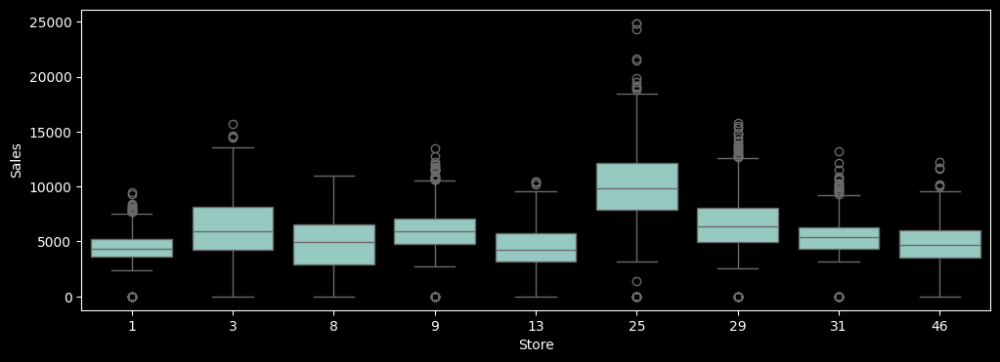

In [1188]:
fig = plt.subplots(figsize=(12, 4))
ax = sns.boxplot(x="Store", y="Sales",data=data)

- As expcted sales are different for different stores

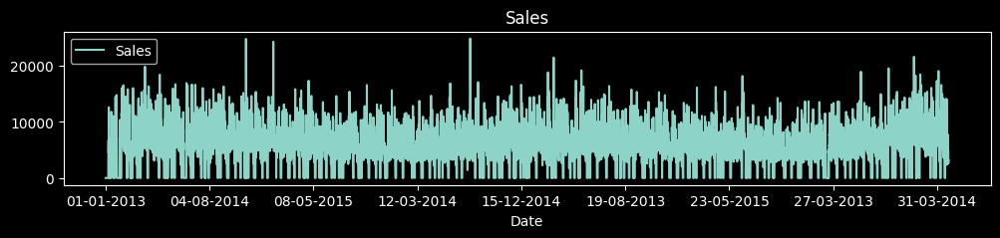

In [1189]:
# Plot sales against time series
data.Sales.plot(figsize=(12, 2))
plt.legend(loc='best')
plt.title('Sales')
plt.show()

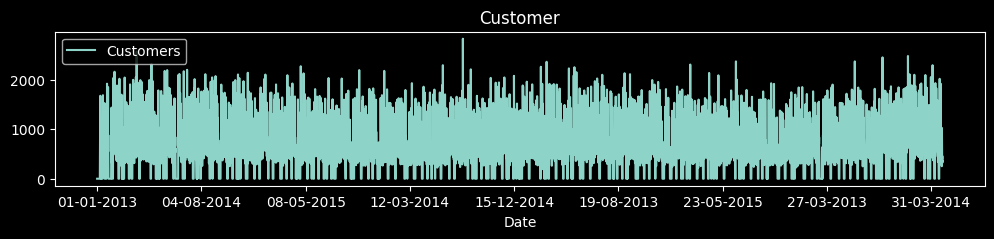

In [1190]:
# Plot customers against time series
data.Customers.plot(figsize=(12, 2))
plt.legend(loc='best')
plt.title('Customer')
plt.show()

- Visully Sales & Customer looks to be in sync

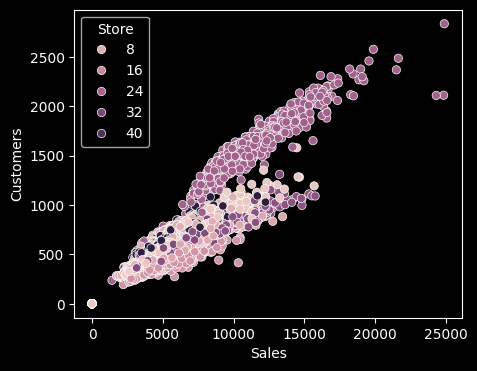

In [1191]:
# Plotting Relationship between customer & sales
plt.figure(figsize=(5, 4))
sns.scatterplot(data=data, x="Sales", y="Customers",hue='Store')
plt.show()

- Linear relationship, between individua store - sales & customer data

In [1192]:
data.head(1)

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Year,Month,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,,,,,,
01-01-2013,46,2,0,0,0,0,2,1,2,1,1200,2013,1,0,0,1


In [1193]:
data.head(1)

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Year,Month,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,,,,,,
01-01-2013,46,2,0,0,0,0,2,1,2,1,1200,2013,1,0,0,1


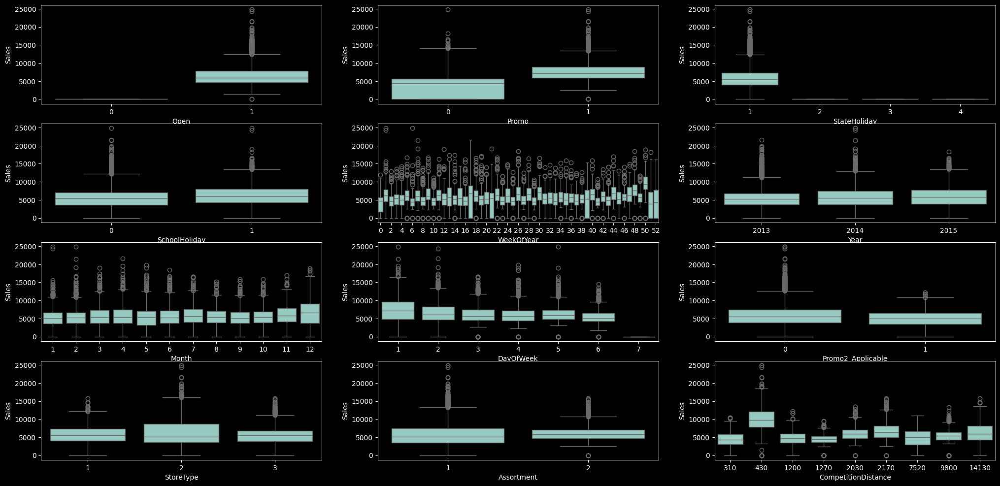

In [1194]:
# Using subplot for ploting boxplots 
plt.figure(figsize=(25, 12))
plt.subplot(4,3,1)
sns.boxplot(x = 'Open', y = 'Sales', data = data)
plt.subplot(4,3,2)
sns.boxplot(x = 'Promo', y = 'Sales', data = data)
plt.subplot(4,3,3)
sns.boxplot(x = 'StateHoliday', y = 'Sales', data = data)
plt.subplot(4,3,4)
sns.boxplot(x = 'SchoolHoliday', y = 'Sales', data = data)
plt.subplot(4,3,5)
ax=sns.boxplot(x = 'WeekOfYear', y = 'Sales', data = data)
ax.set_xticks(ax.get_xticks()[::2])
plt.subplot(4,3,6)
sns.boxplot(x = 'Year', y = 'Sales', data = data)
plt.subplot(4,3,7)
sns.boxplot(x = 'Month', y = 'Sales', data = data)
plt.subplot(4,3,8)
sns.boxplot(x = 'DayOfWeek', y = 'Sales', data = data)
plt.subplot(4,3,9)
sns.boxplot(x = 'Promo2_Applicable', y = 'Sales', data = data)
plt.subplot(4,3,10)
sns.boxplot(x = 'StoreType', y = 'Sales', data = data)
plt.subplot(4,3,11)
sns.boxplot(x = 'Assortment', y = 'Sales', data = data)
plt.subplot(4,3,12)
sns.boxplot(x = 'CompetitionDistance', y = 'Sales', data = data)

plt.show()

- At macro level all years are same, there could be storewise variation
- At month level ,december has highest variation
- First day of week has highest sales and variation , while last day seems to be holiday
- All stateholidays seems to be closing day for store
- Promo2 doesn't seem to have impact on Sales, again since all stores are not running Promo2 , thus it could differ
- same could be said about school holiday
- Promo has clear impact on sales
- Competition absence is applicable for only one store thus not plotting it here

### Dropping addition columns
    - Competition distance,Store Type, Assortment ( single value for each store - doesn't have any impact on store wise analysis)
    - Year, month, day (since these have no furter use in calculation & information is available in Date column)

In [1195]:
data.head(1)

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Year,Month,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,,,,,,
01-01-2013,46,2,0,0,0,0,2,1,2,1,1200,2013,1,0,0,1


In [1196]:
# Dropping columns
drop_column = ['Year','Month','Day','StoreType','Assortment',"CompetitionDistance"]
for column_name in drop_column:
    if column_name in data.columns:
        data.drop(column_name,inplace=True,axis=1)
data.head(3)

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,
01-01-2013,46,2,0,0,0,0,2,1,0,0,1
01-01-2013,1,2,0,0,0,0,2,1,0,0,0
01-01-2013,3,2,0,0,0,0,2,1,0,0,1


In [1197]:
data.shape

(8110, 11)

### Customers & Sales number are zero due to store closing. While this is real but to handle this in data set , we add small value 0.1 in entire data set

In [1198]:
# Original Data set
data['Customers']=data.Customers.apply(lambda x:x+0.1)
data['Sales']=data.Sales.apply(lambda x:x+.01)


### Dividing data in Storewise set
- (1,3,8,9,13,25,29,31 and 46)

## Building Model for Store 1

In [1199]:
Store_1=data[(data.Store==1)]
Store_1.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,
01-01-2013,1,2,0.01,0.1,0,0,2,1,0,0,0
01-01-2014,1,3,0.01,0.1,0,0,2,1,0,0,0
01-01-2015,1,4,0.01,0.1,0,0,2,1,0,0,0
01-02-2013,1,5,5633.01,658.1,1,0,1,0,4,0,0
01-02-2014,1,6,5292.01,667.1,1,0,1,0,4,0,0


In [1200]:
# Some columns will have single value , dropping then. This step not done earlier as columns would had nan also
# Promo 2 Interval is zero , thus promo 2 is not applicable
for col in Store_1.columns:
    if len(Store_1[col].unique()) == 1:
        Store_1.drop(col,inplace=True,axis=1)

In [1201]:
Store_1.head(7)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear
Date,,,,,,,,
01-01-2013,2,0.01,0.1,0,0,2,1,0
01-01-2014,3,0.01,0.1,0,0,2,1,0
01-01-2015,4,0.01,0.1,0,0,2,1,0
01-02-2013,5,5633.01,658.1,1,0,1,0,4
01-02-2014,6,5292.01,667.1,1,0,1,0,4
01-02-2015,7,0.01,0.1,0,0,1,0,5
01-03-2013,5,4611.01,584.1,1,0,1,0,8


In [1202]:
Store_1.tail(7)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear
Date,,,,,,,,
31-07-2015,5,5263.01,555.1,1,1,1,1,30
31-08-2013,6,5317.01,598.1,1,0,1,0,34
31-08-2014,7,0.01,0.1,0,0,1,1,35
31-10-2013,4,4035.01,514.1,1,0,1,0,43
31-10-2014,5,4161.01,512.1,1,0,1,1,43
31-12-2013,2,2362.01,298.1,1,0,1,1,52
31-12-2014,3,2605.01,327.1,1,0,1,1,52


In [1203]:
Store_1.shape

(942, 8)

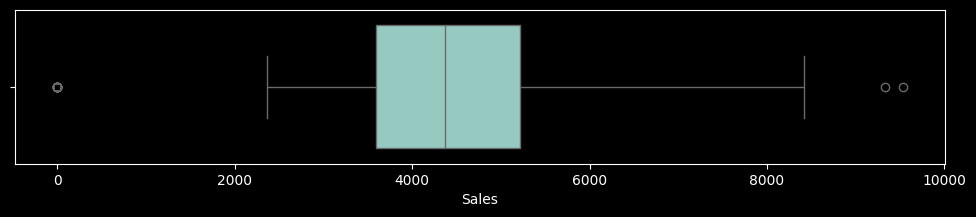

In [1204]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_1['Sales'],whis=2)

- Few outliers at max side
- However , it feels that these are at begining of the year
- Imputing these values to 99th percentile

In [1205]:
Store_1['Sales']=Store_1[['Sales']].clip(upper=Store_1.quantile(0.99),axis=1)

In [1206]:
Store_1['Customers']=Store_1[['Customers']].clip(upper=Store_1.quantile(0.99),axis=1)

In [1207]:
Store_1.shape

(942, 8)

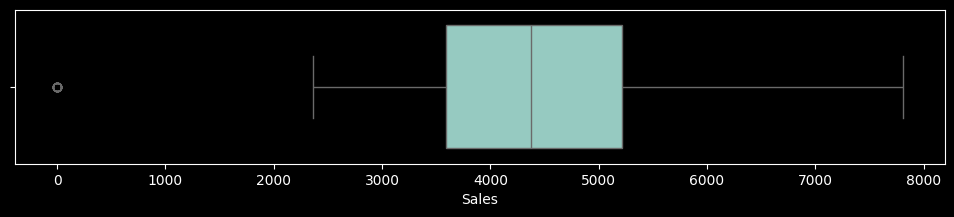

In [1208]:
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_1['Sales'],whis=2)

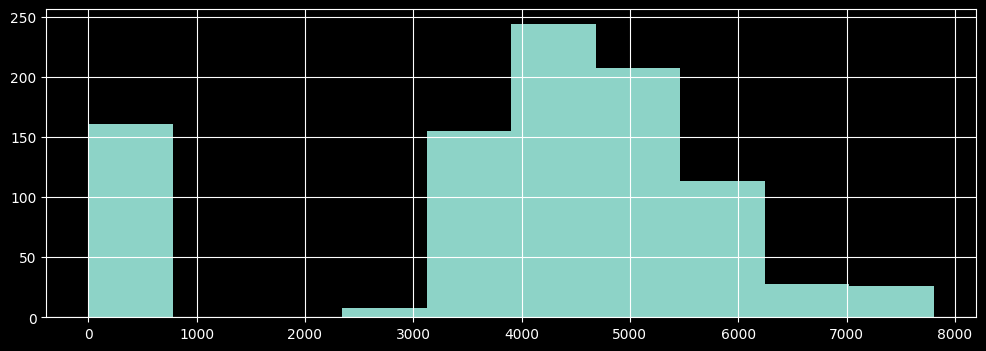

In [1209]:
fig = Store_1['Sales'].hist(figsize = (12,4))

- Near Zero sales mean that store is closed

In [1210]:
# Data description
Store_1.describe()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear
count,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000
mean,3.997877,3939.728047,466.690340,0.829087,0.382166,1.043524,0.204883,23.516985
std,1.998404,2002.211305,226.763753,0.376633,0.486175,0.282722,0.403831,14.600789
min,1.000000,0.010000,0.100000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,2.000000,3588.260000,463.100000,1.000000,0.000000,1.000000,0.000000,11.000000
50%,4.000000,4373.510000,529.100000,1.000000,0.000000,1.000000,0.000000,22.000000
75%,6.000000,5220.010000,598.850000,1.000000,1.000000,1.000000,0.000000,35.000000
max,7.000000,7806.250000,846.410000,1.000000,1.000000,4.000000,1.000000,52.000000


## Time series Decomposition

### Additive seasonal decomposition

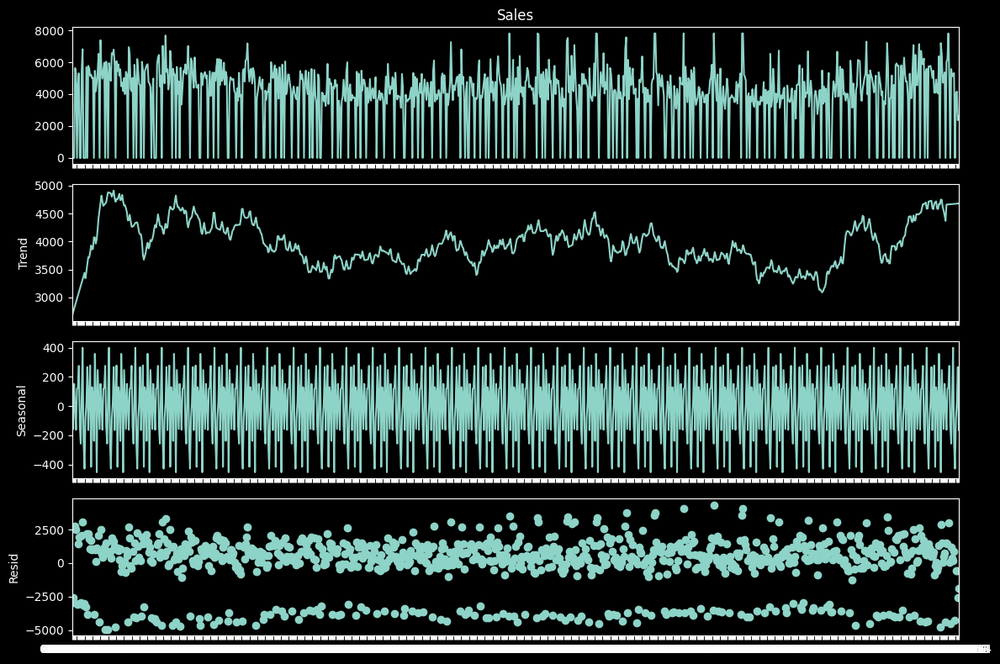

In [1211]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(Store_1.Sales, model='additive',extrapolate_trend='freq', period=28) # additive seasonal index
fig = decomposition.plot()
plt.show()

***There is clear seasonality in data , however it doesn't show trend or inconsistent variance***

### Multiplicative seasonal decomposition

In [1212]:
# decomposition = sm.tsa.seasonal_decompose(Store_1.Sales, model='multiplicative') # multiplicative seasonal index
# fig = decomposition.plot()
# plt.show()

***Again There is clear seasonality in data , however it doesn't show trend or inconsistent variance***

### Testing For Stationarity

In [1213]:
from statsmodels.tsa.stattools import adfuller

In [1214]:
test_result=adfuller(Store_1['Sales'])

In [1215]:
#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [1216]:
adfuller_test(Store_1['Sales'])

ADF Test Statistic : -6.031682664308458
p-value : 1.4130542498343867e-07
#Lags Used : 20
Number of Observations Used : 921
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


**Data is stationary**

## Handle seasonality

In [1217]:
Store_1['S_Sales_1']=Store_1['Sales']-Store_1['Sales'].shift(7)
Store_1.head(14)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,S_Sales_1
Date,,,,,,,,,
01-01-2013,2,0.01,0.1,0,0,2,1,0,NaN
01-01-2014,3,0.01,0.1,0,0,2,1,0,NaN
01-01-2015,4,0.01,0.1,0,0,2,1,0,NaN
01-02-2013,5,5633.01,658.1,1,0,1,0,4,NaN
01-02-2014,6,5292.01,667.1,1,0,1,0,4,NaN
01-02-2015,7,0.01,0.1,0,0,1,0,5,NaN
01-03-2013,5,4611.01,584.1,1,0,1,0,8,NaN
01-03-2014,6,5307.01,655.1,1,0,1,0,8,5307.0
01-03-2015,7,0.01,0.1,0,0,1,0,9,0.0


In [1218]:
## Again test dickey fuller test
adfuller_test(Store_1['S_Sales_1'].dropna())

ADF Test Statistic : -10.59746647943174
p-value : 6.295417303567633e-19
#Lags Used : 20
Number of Observations Used : 914
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<Axes: xlabel='Date'>

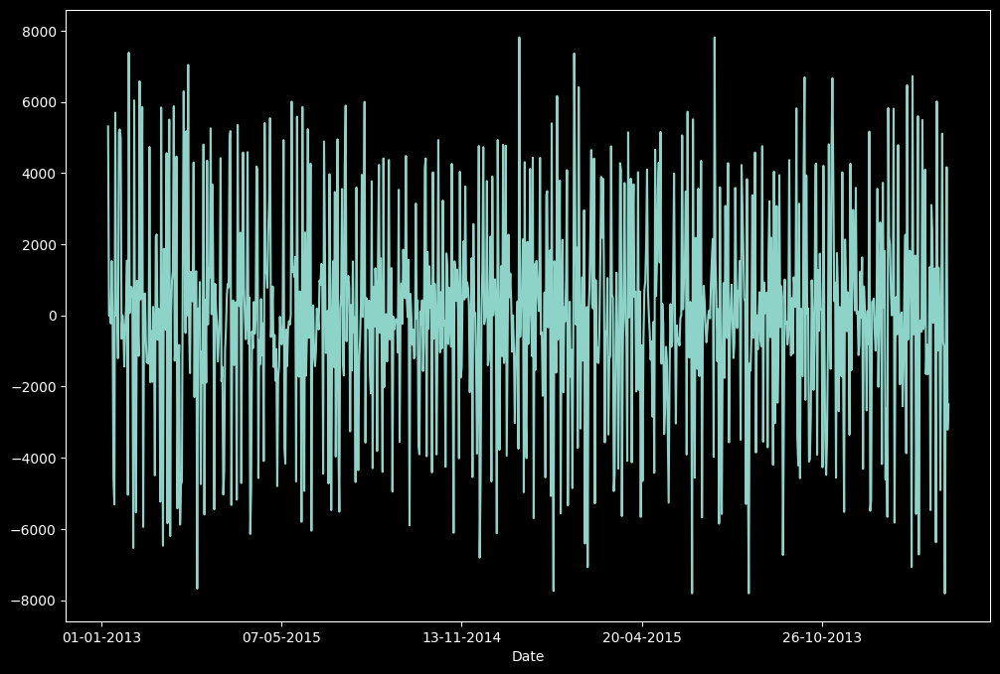

In [1219]:
Store_1['S_Sales_1'].plot()

In [1220]:
Store_1['S_Customers_1']=Store_1['Customers']-Store_1['Customers'].shift(7)

In [1221]:
## Again test dickey fuller test
adfuller_test(Store_1['S_Customers_1'].dropna())

ADF Test Statistic : -10.850804148292626
p-value : 1.530585706817635e-19
#Lags Used : 20
Number of Observations Used : 914
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


## ACF & PACF

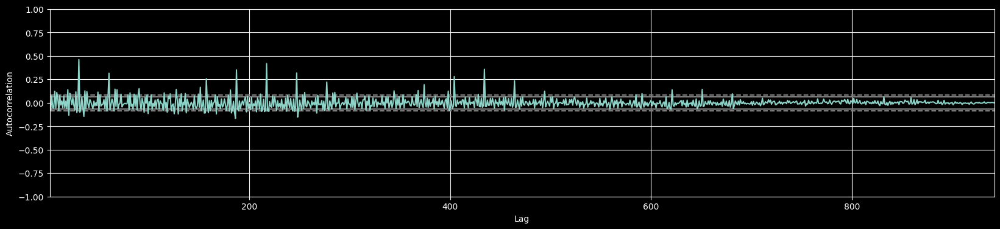

In [1222]:
from pandas.plotting import autocorrelation_plot
fig = plt.subplots(figsize=(20, 4))
ax=autocorrelation_plot(Store_1['Sales'])
plt.show()

In [1223]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

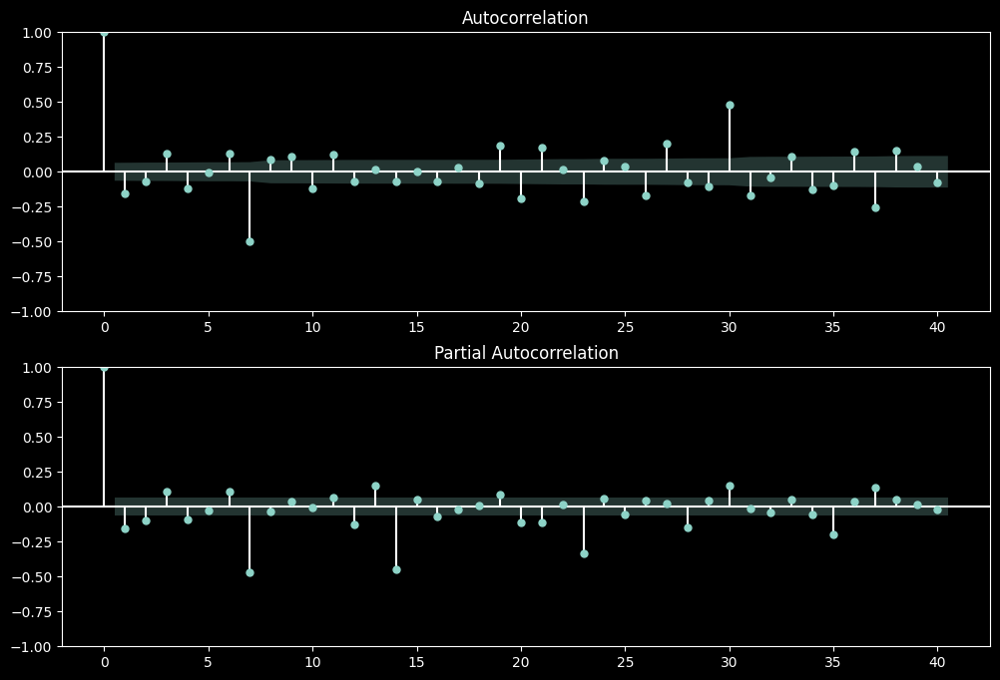

In [1224]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(Store_1['S_Sales_1'].iloc[7:],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(Store_1['S_Sales_1'].iloc[13:],lags=40,ax=ax2)

# Build and evaluate time series forecast

## ARIMA ,SARIMA & SARIMAX

In [1225]:
# Split Data set into target & Exonous variables
Store_1_Target=Store_1[['Sales']].copy()
Store_1_Exon=Store_1[['Promo']]

## Split time series data into training and test set

In [1226]:
train_len = 900
train = Store_1_Target[0:train_len] # first 900 day as training set
test = Store_1_Target[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [1227]:
from statsmodels.tsa.arima_model import ARIMA

In [1228]:

# model=ARIMA(train['Sales'],order=(0,0,7))
# model_fit=model.fit()

In [1229]:
# model_fit.summary()

In [1230]:
y_hat_arima = Store_1_Target.copy()
y_hat_arima['arima_forecast'] = model_fit.predict(Store_1_Target.index.min(), Store_1_Target.index.max())

NameError: name 'model_fit' is not defined

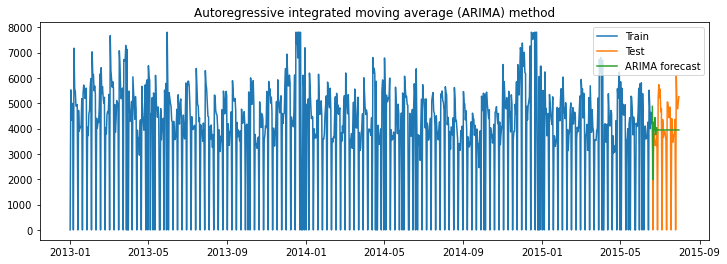

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_arima['arima_forecast'][test.index.min():], label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_arima['arima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_arima['arima_forecast'][test.index.min():])/test['Sales'])*100,2)

results = pd.DataFrame({'Store':['Store_1'],'Method':['Autoregressive integrated moving average (ARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_1,Autoregressive integrated moving average (ARIM...,1615.85,5172043.22


## Seasonal auto regressive integrated moving average (SARIMA)

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 1, 7)) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


ar.S.L7    9.999990e-01
ma.S.L7   -9.948091e-01
sigma2     1.414870e+06
dtype: float64


In [ ]:
y_hat_sarima = Store_1_Target.copy()
y_hat_sarima['sarima_forecast'] = model_fit.predict(Store_1_Target.index.min(), Store_1_Target.index.max())

In [ ]:
train['Sales']

KeyError: 'Sales'

In [ ]:
test['Sales']

In [ ]:
y_hat_sarima['sarima_forecast'][test.index.min():]

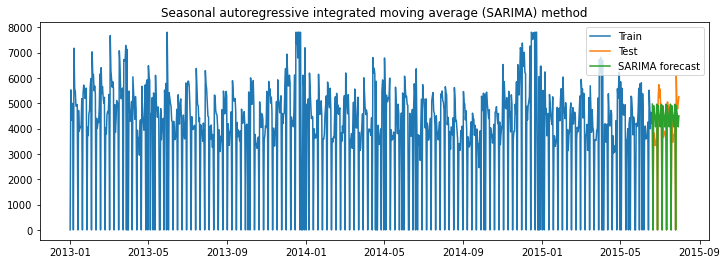

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('Seasonal autoregressive integrated moving average (SARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarima['sarima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarima['sarima_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_1'],'Method':['Seasonal autoregressive integrated moving average (SARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_1,Autoregressive integrated moving average (ARIM...,1615.85,5172043.22
0,Store_1,Seasonal autoregressive integrated moving aver...,731.49,14.31


## Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)

In [ ]:
### Split promotion data into train and test data sets
promo_train = Store_1_Exon[:train_len]
promo_test = Store_1_Exon[train_len:]

In [ ]:
model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 1, 7), exog=promo_train) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Promo      1.349349e+03
ar.S.L7    9.998545e-01
ma.S.L7   -9.388976e-01
sigma2     1.103491e+06
dtype: float64


C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
y_hat_sarimax = Store_1_Target.copy()
y_hat_sarimax['sarimax_forecast'] = model_fit.predict(Store_1_Target.index.min(), Store_1_Target.index.max(), exog=promo_test)

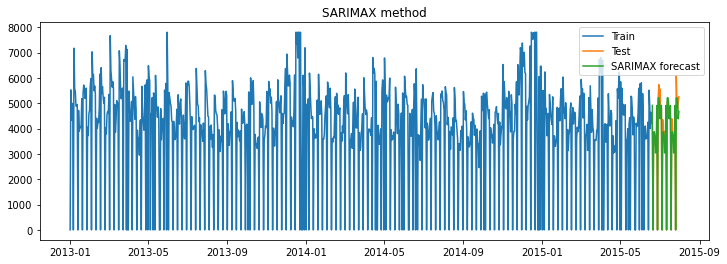

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarimax['sarimax_forecast'][test.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarimax['sarimax_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarimax['sarimax_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_1'],'Method':['SARIMAX method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_1,Autoregressive integrated moving average (ARIM...,1615.85,5172043.22
0,Store_1,Seasonal autoregressive integrated moving aver...,731.49,14.31
0,Store_1,SARIMAX method,494.25,8.31


## VAR & VARMAX

In [ ]:
# Copy data set
df=Store_1.copy()

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,S_Sales_1,S_Customers_1
Date,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,NaN,NaN
2013-01-02,3,5530.01,668.1,1,0,1,1,1,NaN,NaN
2013-01-03,4,4327.01,578.1,1,0,1,1,1,NaN,NaN


In [ ]:
# Drop Unneseccary Columns
df.drop(['WeekOfYear','S_Sales_1','S_Customers_1'],inplace=True,axis=1)

***Create dummy variables***

In [ ]:
dummies=pd.get_dummies(df['DayOfWeek'],drop_first=True,prefix='DayOfWeek')
df=pd.concat([df,dummies],axis=1)

In [ ]:
dummies=pd.get_dummies(df['StateHoliday'],drop_first=True,prefix='StateHoliday')
df=pd.concat([df,dummies],axis=1)

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,0,0,0,0,0,1,0,0
2013-01-02,3,5530.01,668.1,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,4,4327.01,578.1,1,0,1,1,0,0,1,0,0,0,0,0,0


In [ ]:
df.drop(['DayOfWeek','StateHoliday'],axis=1,inplace=True)
df.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,5530.01,668.1,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,4327.01,578.1,1,0,1,0,0,1,0,0,0,0,0,0
2013-01-04,4486.01,619.1,1,0,1,0,0,0,1,0,0,0,0,0
2013-01-05,4997.01,635.1,1,0,1,0,0,0,0,1,0,0,0,0


In [ ]:
# Casulaity Check
from statsmodels.tsa.stattools import grangercausalitytests
causality_sales=grangercausalitytests(df[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=111.0030, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=111.3580, p=0.0000  , df=1
likelihood ratio test: chi2=105.2466, p=0.0000  , df=1
parameter F test:         F=111.0030, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=57.6020 , p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=115.8200, p=0.0000  , df=2
likelihood ratio test: chi2=109.2216, p=0.0000  , df=2
parameter F test:         F=57.6020 , p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=37.5147 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=113.3894, p=0.0000  , df=3
likelihood ratio test: chi2=107.0488, p=0.0000  , df=3
parameter F test:         F=37.5147 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=29.4480 , p=0.0000  

***The Test Indicate casuality between Sales & Customers***

***We have earlier done ADF test & ACF/PACF Plots, sso we won't repeat them here***

In [ ]:
df.shape

(942, 14)

### Train-Test Split

In [ ]:
train_len = 900
train = df[0:train_len] # first 900 day as training set
test = df[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
train.head(3)

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,5530.01,668.1,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,4327.01,578.1,1,0,1,0,0,1,0,0,0,0,0,0


### Standardising numerical values in test-train datasets using minmax

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Fit transform on train data

scaler = MinMaxScaler()
train[['Sales','Customers']]=scaler.fit_transform(train[['Sales','Customers']])
train.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.000000,0.000000,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,0.708408,0.789309,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,0.554300,0.682965,1,0,1,0,0,1,0,0,0,0,0,0
2013-01-04,0.574668,0.731410,1,0,1,0,0,0,1,0,0,0,0,0
2013-01-05,0.640129,0.750316,1,0,1,0,0,0,0,1,0,0,0,0


In [ ]:
test[['Sales','Customers']]=scaler.transform(test[['Sales','Customers']])
test.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2015-06-20,0.524837,0.583710,1,0,0,0,0,0,0,1,0,0,0,0
2015-06-21,0.000000,0.000000,0,0,0,0,0,0,0,0,1,0,0,0
2015-06-22,0.492683,0.577802,1,0,0,0,0,0,0,0,0,0,0,0
2015-06-23,0.481922,0.528175,1,0,0,1,0,0,0,0,0,0,0,0
2015-06-24,0.428631,0.489182,1,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
train.columns

Index(['Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4'],
      dtype='object')

In [ ]:
exog = train[[ 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=30)
print(res.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -11.77      -11.63   7.708e-06      -11.72
1       -11.86      -11.69   7.094e-06      -11.79
2       -11.92      -11.74   6.638e-06      -11.85
3       -11.95      -11.74   6.480e-06      -11.87
4       -11.97      -11.74   6.360e-06      -11.88
5       -12.02      -11.77   6.035e-06      -11.92
6       -12.06      -11.79   5.785e-06      -11.96
7       -12.13     -11.83*   5.398e-06      -12.02
8       -12.14      -11.82   5.344e-06      -12.02
9       -12.16      -11.82   5.221e-06      -12.03
10      -12.19      -11.83   5.084e-06      -12.05
11      -12.19      -11.81   5.072e-06      -12.05
12      -12.20      -11.80   5.026e-06      -12.05
13      -12.21      -11.78   4.998e-06      -12.04
14      -12.23      -11.78   4.889e-06     -12.06*
15      -12.24      -11.76   4.855e-06      -12.06
16      -12.24      -11.75   4.

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


***AIC is Lowest at lag 28***

In [ ]:
#Fitting the model with lag 28

var_model_final = var_model.fit(28)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 18, May, 2022
Time:                     22:39:59
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.5655
Nobs:                     872.000    HQIC:                  -12.0317
Log likelihood:           3035.13    FPE:                4.46208e-06
AIC:                     -12.3206    Det(Omega_mle):     3.83170e-06
--------------------------------------------------------------------
Results for equation Sales
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const                 -0.411570              NAN              NAN             NAN
Promo                  0.139788         0.010931           12.788           0.000
SchoolHoliday         -0.014035         0.007346        

### Cointegration test

In [ ]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.vecm import select_coint_rank

def cointegration_test(df, lag): 
    alpha=0.05
    out = coint_johansen(df,-1,lag)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

In [ ]:
train['Sales']=train['Sales'].apply(lambda x:round(x))
train['Customers']=train['Customers'].apply(lambda x:round(x))

In [ ]:
cointegration_test(train[['Sales','Customers']],7)
rank_result=select_coint_rank(train[['Sales','Customers']],-1,1)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  163.61    > 12.3212   =>   True
Customers ::  0.63      > 4.1296    =>   False


In [ ]:
print(rank_result.rank)

2


We have the rank of Johassen test as 2 which means that the time series are stationary but do not seem to be co-integratied

In [ ]:
# Getting lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train[['Sales','Customers']].values[-lag_order:]
forecast_input

28


array([[1, 1],
       [0, 0],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [0, 1],
       [0, 1],
       [0, 0],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1]], dtype=int64)

In [ ]:
exog_test = test[['Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=test.index, columns=['Sales','Customers'])
var_forecast

,Sales,Customers
Date,,
2015-06-20,0.691481,0.818833
2015-06-21,0.209715,0.183265
2015-06-22,0.712331,0.760721
2015-06-23,0.600182,0.709993
2015-06-24,0.621713,0.740462
2015-06-25,0.680734,0.795179
2015-06-26,0.911553,1.017544
2015-06-27,1.045643,1.096631
2015-06-28,0.374106,0.294490


In [ ]:
#Adding forecasted values
test['VarForecastedSales']=var_forecast.Sales
test['VarForecastedCustomers']=var_forecast.Customers

In [ ]:
def forecasted_timeseries_visualization(series,forecasted_series,c,model):
    fig = plt.figure(figsize=(20, 3))
    series.plot(label='Actual')
    forecasted_series.plot(label='Forecasted')
    plt.xlabel('Date')
    plt.ylabel(c)
    plt.legend(loc='best')
    plt.title('{} model For {}'.format(model,c))
    plt.show()

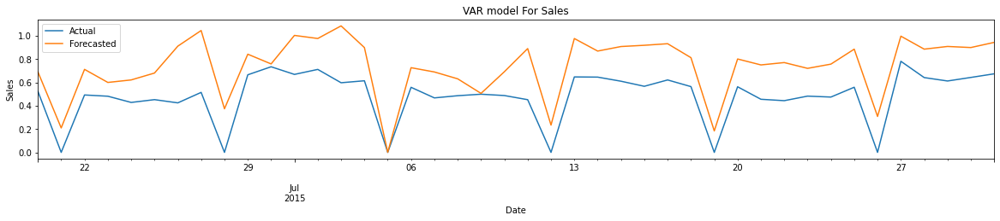

In [ ]:
forecasted_timeseries_visualization(test['Sales'],test['VarForecastedSales'],'Sales','VAR')


In [ ]:
from sklearn.metrics import mean_squared_error
summary_df=pd.DataFrame(columns=['Store','Model','RMSE_SALES','MAPE_SALES','RMSE_CUSTOMERS','MAPE_CUSTOMERS'])

def summary(s,fs,c,fc,store,model):
    rmse_sales = np.sqrt(mean_squared_error(s, fs)).round(2)
    mape_sales = np.round(np.mean(np.abs(s-fs)/s)*100,2)
    rmse_customers = np.sqrt(mean_squared_error(c, fc)).round(2)
    mape_customers = np.round(np.mean(np.abs(c-fc)/c)*100,2)
    temp=pd.DataFrame({'Store':[store],'Model':[model], 'RMSE_SALES': [rmse_sales],'MAPE_SALES': [mape_sales] , 
                            'RMSE_CUSTOMERS': [rmse_customers],'MAPE_CUSTOMERS': [mape_customers]})
    return temp

In [ ]:
d=summary(test['Sales'], test['VarForecastedSales'],
       test['Customers'], test['VarForecastedCustomers'],'Store_1','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head()

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_1,VAR,0.28,inf,0.31,inf


In [ ]:
#modelling

exog = train[[ 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                 312.863
                              + intercept   AIC                           -515.726
Date:                    Wed, 18 May 2022   BIC                           -251.595
Time:                            22:40:07   HQIC                          -414.826
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             2.32, 0.00   Jarque-Bera (JB):      60.49, 63535.93
Prob(Q):                        0.13, 0.98   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.13, 3.66   Skew:                     -0.62, -5.83
P

In [ ]:
#forecasting on test data

exog_test = test[[ 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog_test= test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=test.index.min(),end=test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,1.021029,1.029717
2015-06-21,0.158782,-0.025151
2015-06-22,0.621737,0.962598
2015-06-23,0.564550,0.985394
2015-06-24,0.570365,0.975543


In [ ]:
#Adding forecasted values

test['VarmaxForecastedSales']=varmax_forecast.Sales
test['VarmaxForecastedCustomers']=varmax_forecast.Customers

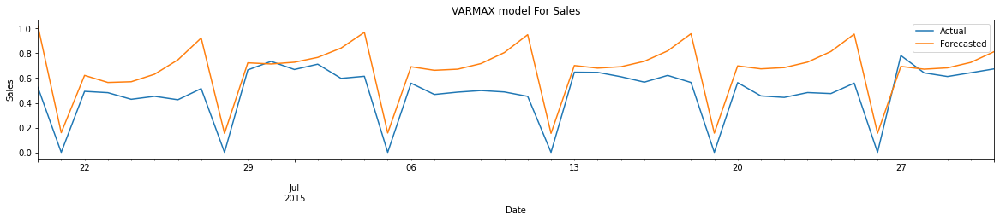

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_1,VAR,0.28,inf,0.31,inf
0,Store_1,VARMAX,0.23,inf,0.36,inf


In [ ]:
#Plotting time series

forecasted_timeseries_visualization(test['Sales'],test['VarmaxForecastedSales'],'Sales','VARMAX')
#Printing results

d=summary(test['Sales'], test['VarmaxForecastedSales'],
       test['Customers'], test['VarmaxForecastedCustomers'],'Store_1','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head()

 


## Building Model for Store 3

In [ ]:
Store_3=data[(data.Store==3)]
Store_3.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,
2013-01-01,3,2,0.01,0.1,0,0,2,1,1,0,1
2013-01-02,3,3,6823.01,805.1,1,0,1,1,1,0,1
2013-01-03,3,4,5902.01,721.1,1,0,1,1,1,0,1
2013-01-04,3,5,6069.01,690.1,1,0,1,1,1,0,1
2013-01-05,3,6,4523.01,525.1,1,0,1,0,1,0,1


In [ ]:
# Some columns will have single value , dropping then. This step not done earlier as columns would had nan also
# Promo 2 Interval is zero , thus promo 2 is not applicable
for col in Store_3.columns:
    if len(Store_3[col].unique()) == 1:
        Store_3.drop(col,inplace=True,axis=1)

In [ ]:
Store_3.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable
Date,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,1
2013-01-02,3,6823.01,805.1,1,0,1,1,1,1
2013-01-03,4,5902.01,721.1,1,0,1,1,1,1
2013-01-04,5,6069.01,690.1,1,0,1,1,1,1
2013-01-05,6,4523.01,525.1,1,0,1,0,1,1


In [ ]:
#Since there are 02 promos , Normal & Promo2 , Thus creating new column 'Promo Power'
Store_3['Promo_Power']=Store_3['Promo']+Store_3['Promo2_Applicable']

In [ ]:
Store_3.shape

(942, 10)

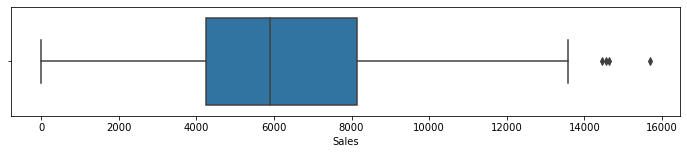

In [ ]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_3['Sales'],whis=1.5)

- Few outliers at max side
- However , it feels that these are at begining of the year
- Imputing these values to 99th percentile

In [ ]:
Store_3['Sales']=Store_3[['Sales']].clip(upper=Store_3.quantile(0.99),axis=1)

In [ ]:
Store_3['Customers']=Store_3[['Customers']].clip(upper=Store_3.quantile(0.99),axis=1)

In [ ]:
Store_3.shape

(942, 10)

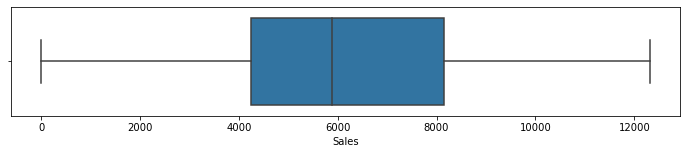

In [ ]:
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_3['Sales'],whis=2)

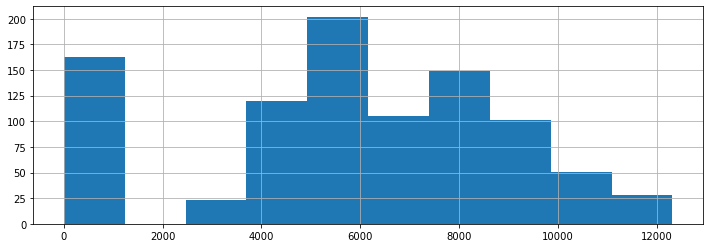

In [ ]:
fig = Store_3['Sales'].hist(figsize = (12,4))

- Near Zero sales mean that store is closed

In [ ]:
# Data description
Store_3.describe()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable,Promo_Power
count,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000
mean,3.997877,5725.851614,619.289809,0.826964,0.382166,1.045648,0.180467,24.098726,0.358811,0.740977
std,1.998404,3262.822029,321.106818,0.378479,0.486175,0.286125,0.384780,14.547508,0.479906,0.689066
min,1.000000,0.010000,0.100000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
25%,2.000000,4247.510000,475.100000,1.000000,0.000000,1.000000,0.000000,12.000000,0.000000,0.000000
50%,4.000000,5892.010000,705.100000,1.000000,0.000000,1.000000,0.000000,23.000000,0.000000,1.000000
75%,6.000000,8152.760000,834.850000,1.000000,1.000000,1.000000,0.000000,36.000000,1.000000,1.000000
max,7.000000,12314.290000,1166.280000,1.000000,1.000000,4.000000,1.000000,52.000000,1.000000,2.000000


## Time series Decomposition

### Additive seasonal decomposition

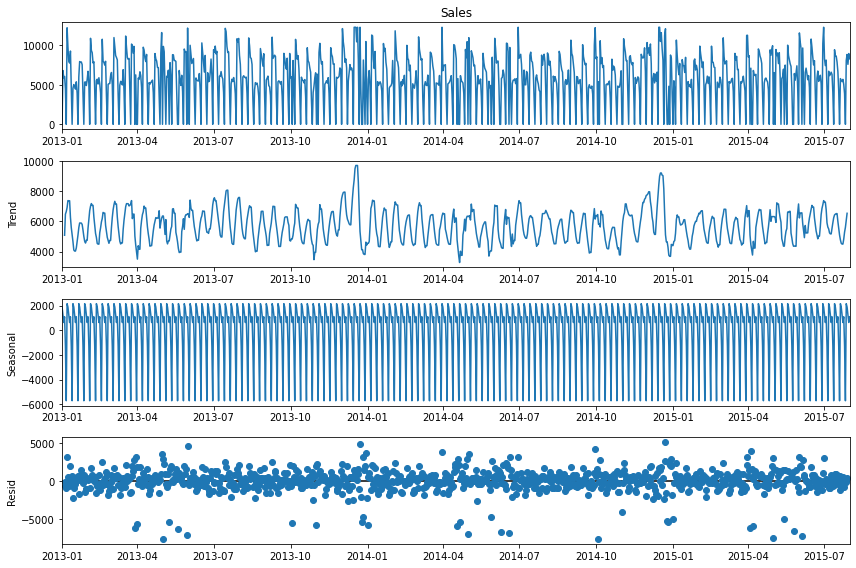

In [ ]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(Store_3.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

***There is clear seasonality in data , however it doesn't show trend or inconsistent variance***

### Multiplicative seasonal decomposition

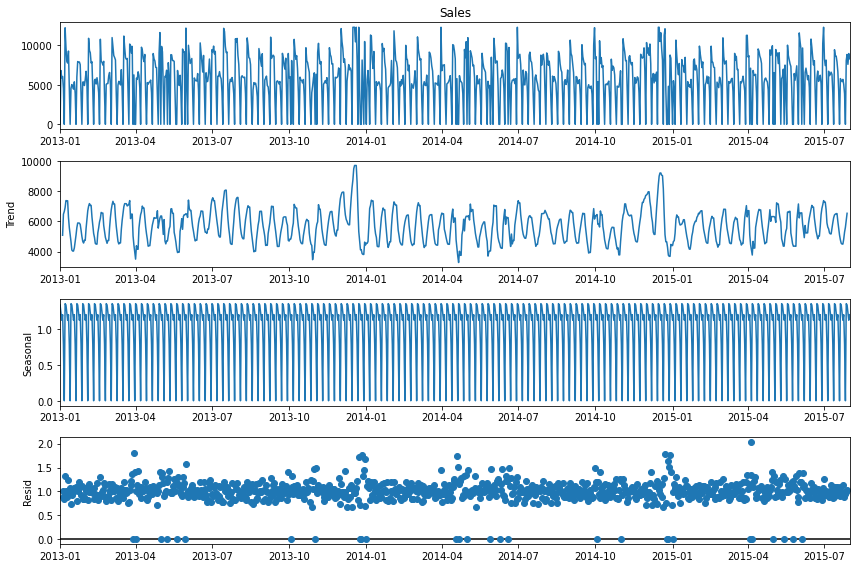

In [ ]:
decomposition = sm.tsa.seasonal_decompose(Store_3.Sales, model='multiplicative') # multiplicative seasonal index
fig = decomposition.plot()
plt.show()

***Again There is clear seasonality in data , however it doesn't show trend or inconsistent variance***

### Testing For Stationarity

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
test_result=adfuller(Store_3['Sales'])

In [ ]:
#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [ ]:
adfuller_test(Store_3['Sales'])

ADF Test Statistic : -5.998979388446665
p-value : 1.6749713622301697e-07
#Lags Used : 21
Number of Observations Used : 920
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


**Data is stationary**

## Handle seasonality

In [ ]:
Store_3['S_Sales_1']=Store_3['Sales']-Store_3['Sales'].shift(7)
Store_3.head(14)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable,Promo_Power,S_Sales_1
Date,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,1,1,NaN
2013-01-02,3,6823.01,805.1,1,0,1,1,1,1,1,NaN
2013-01-03,4,5902.01,721.1,1,0,1,1,1,1,1,NaN
2013-01-04,5,6069.01,690.1,1,0,1,1,1,1,1,NaN
2013-01-05,6,4523.01,525.1,1,0,1,0,1,1,1,NaN
2013-01-06,7,0.01,0.1,0,0,1,0,1,1,1,NaN
2013-01-07,1,12247.01,1079.1,1,1,1,0,2,1,2,NaN
2013-01-08,2,9800.01,856.1,1,1,1,0,2,1,2,9800.0
2013-01-09,3,8001.01,778.1,1,1,1,0,2,1,2,1178.0


In [ ]:
## Again test dickey fuller test
adfuller_test(Store_3['S_Sales_1'].dropna())

ADF Test Statistic : -12.988713525912164
p-value : 2.8421559525373036e-24
#Lags Used : 20
Number of Observations Used : 914
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<AxesSubplot:xlabel='Date'>

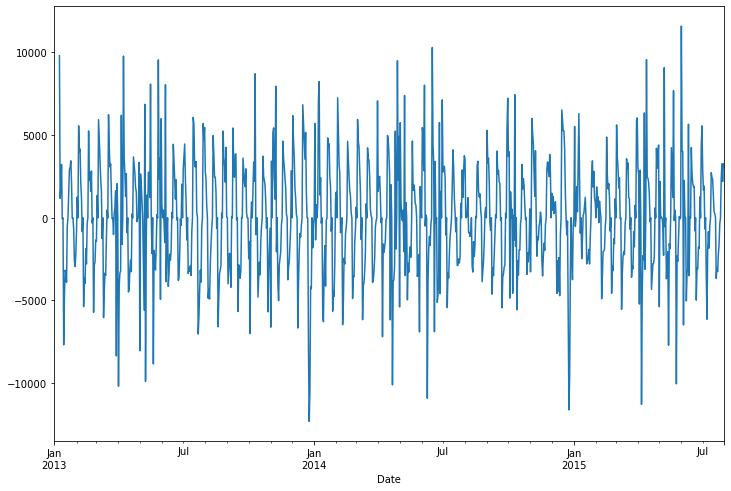

In [ ]:
Store_3['S_Sales_1'].plot()

In [ ]:
Store_3['S_Customers_1']=Store_3['Customers']-Store_3['Customers'].shift(7)

In [ ]:
## Again test dickey fuller test
adfuller_test(Store_3['S_Customers_1'].dropna())

ADF Test Statistic : -11.294559711982973
p-value : 1.3537292826229303e-20
#Lags Used : 20
Number of Observations Used : 914
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


## ACF & PACF

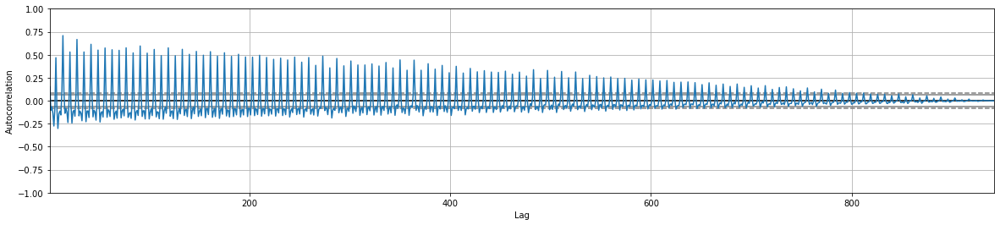

In [ ]:
from pandas.plotting import autocorrelation_plot
fig = plt.subplots(figsize=(20, 4))
ax=autocorrelation_plot(Store_3['Sales'])
plt.show()

In [ ]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

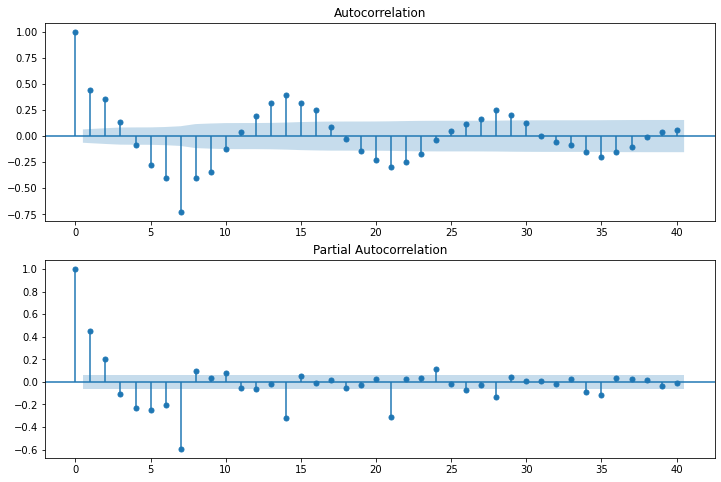

In [ ]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(Store_3['S_Sales_1'].iloc[7:],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(Store_3['S_Sales_1'].iloc[13:],lags=40,ax=ax2)

# Build and evaluate time series forecast

## ARIMA ,SARIMA & SARIMAX

In [ ]:
# Split Data set into target & Exonous variables
Store_3_Target=Store_3[['Sales']].copy()
Store_3_Exon=Store_3[['Promo_Power']]

In [ ]:
Store_3_Target.head(2)

,Sales
Date,
2013-01-01,0.01
2013-01-02,6823.01


In [ ]:
Store_3_Exon.head(2)

,Promo_Power
Date,
2013-01-01,1
2013-01-02,1


## Split time series data into training and test set

In [ ]:
train_len = 900
train = Store_3_Target[0:train_len] # first 900 day as training set
test = Store_3_Target[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

In [ ]:

model=ARIMA(train['Sales'],order=(0,0,7))
model_fit=model.fit()

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


In [ ]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(0, 7)   Log Likelihood               -8424.157
Method:                       css-mle   S.D. of innovations           2808.725
Date:                Wed, 18 May 2022   AIC                          16866.314
Time:                        22:40:11   BIC                          16909.535
Sample:                    01-01-2013   HQIC                         16882.825
                         - 06-19-2015                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        5715.7502     59.506     96.054      0.000    5599.121    5832.379
ma.L1.Sales     0.1494      0.033      4.513      0.000       0.084       0.214
ma.L2.Sales     0.0019      0.033      0.058      0.953      -0.063       0.067
ma.L3.Sales    -0.0742      0.034     -2.208      0.027      -0.140      -0.008
ma.L4.Sales    -0.1604      0.035     -4.542      0.000      -0.230      -0.091
ma.L5.Sales    -0.2861      0.028    -10.068      0.000      -0.342      -0.230
ma.L6.Sales    -0.2351      0.043     -5.480      0.000      -0.319      -0.151
ma.L7.Sales     0.2380      0.030      7.882      0.000       0.179       0.297
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1           -1.1619           -0.0000j            1.1619           -0.5000
MA.2           -0.7259           -0.8808j            1.1413           -0.3597
MA.3           -0.7259           +0.8808j            1.1413            0.3597
MA.4            0.2899           -1.0805j            1.1187           -0.2083
MA.5            0.2899           +1.0805j            1.1187            0.2083
MA.6            1.2563           -0.0000j            1.2563           -0.0000
MA.7            1.7653           -0.0000j            1.7653           -0.0000
-----------------------------------------------------------------------------
"""

In [ ]:
y_hat_arima = Store_3_Target.copy()
y_hat_arima['arima_forecast'] = model_fit.predict(Store_3_Target.index.min(), Store_3_Target.index.max())

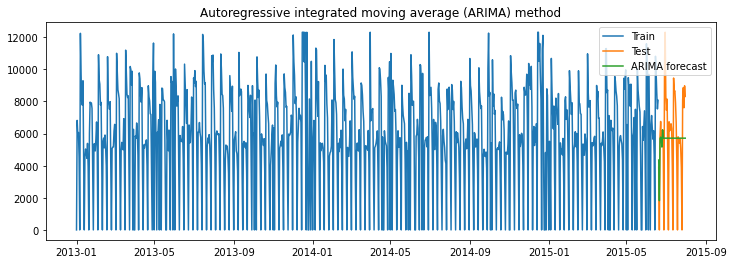

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_arima['arima_forecast'][test.index.min():], label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_arima['arima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_arima['arima_forecast'][test.index.min():])/test['Sales'])*100,2)

results = pd.DataFrame({'Store':['Store_3'],'Method':['Autoregressive integrated moving average (ARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_3,Autoregressive integrated moving average (ARIM...,2824.47,7238157.99


## Seasonal auto regressive integrated moving average (SARIMA)

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 7, 7)) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ar.S.L7     9.999941e-01
ma.S.L7    -1.297963e+00
ma.S.L14    5.319736e-01
ma.S.L21   -3.996368e-01
ma.S.L28    3.091041e-01
ma.S.L35   -2.810720e-01
ma.S.L42    1.913876e-01
ma.S.L49   -4.834497e-02
sigma2      6.034461e+06
dtype: float64


In [ ]:
y_hat_sarima = Store_3_Target.copy()
y_hat_sarima['sarima_forecast'] = model_fit.predict(Store_3_Target.index.min(), Store_3_Target.index.max())

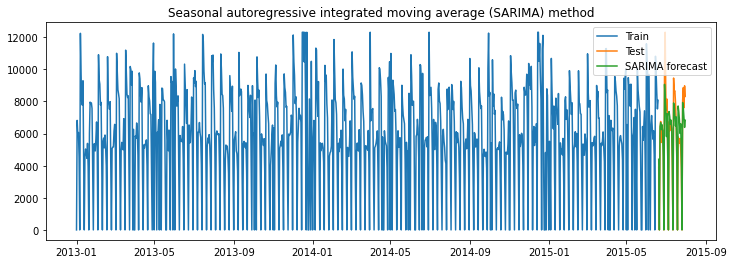

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('Seasonal autoregressive integrated moving average (SARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarima['sarima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarima['sarima_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_3'],'Method':['Seasonal autoregressive integrated moving average (SARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_3,Autoregressive integrated moving average (ARIM...,2824.47,7238157.99
0,Store_3,Seasonal autoregressive integrated moving aver...,1166.71,11.55


## Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)

In [ ]:
### Split promotion data into train and test data sets
promo_train = Store_3_Exon[:train_len]
promo_test = Store_3_Exon[train_len:]

In [ ]:
model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 7, 7), exog=promo_train) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Promo_Power    5.255874e+03
ar.S.L7        9.995858e-01
ma.S.L7       -7.615528e-01
ma.S.L14       1.759628e-03
ma.S.L21      -2.694268e-01
ma.S.L28      -1.153753e-01
ma.S.L35      -1.948508e-01
ma.S.L42       3.795274e-02
ma.S.L49       3.265860e-01
sigma2         8.023392e+06
dtype: float64


In [ ]:
y_hat_sarimax = Store_3_Target.copy()
y_hat_sarimax['sarimax_forecast'] = model_fit.predict(Store_3_Target.index.min(), Store_3_Target.index.max(), exog=promo_test)

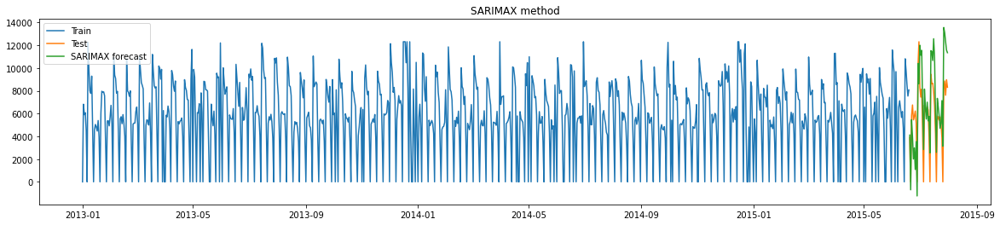

In [ ]:
plt.figure(figsize=(20,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarimax['sarimax_forecast'][test.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarimax['sarimax_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarimax['sarimax_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_3'],'Method':['SARIMAX method with Both Promo'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_3,Autoregressive integrated moving average (ARIM...,2824.47,7238157.99
0,Store_3,Seasonal autoregressive integrated moving aver...,1166.71,11.55
0,Store_3,SARIMAX method with Both Promo,2731.71,3109066.62


## Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)

In [ ]:
### Split promotion data into train and test data sets
Store_3_Exon=Store_3[['Promo']]
promo_train = Store_3_Exon[:train_len]
promo_test = Store_3_Exon[train_len:]

In [ ]:
model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 7, 7), exog=promo_train) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Promo       8.539329e+03
ar.S.L7     9.999922e-01
ma.S.L7    -1.426553e+00
ma.S.L14    7.733937e-01
ma.S.L21   -5.712588e-01
ma.S.L28    3.398039e-01
ma.S.L35   -2.359077e-01
ma.S.L42    1.115932e-01
ma.S.L49    1.053693e-02
sigma2      1.083901e+07
dtype: float64


In [ ]:
y_hat_sarimax = Store_3_Target.copy()
y_hat_sarimax['sarimax_forecast'] = model_fit.predict(Store_3_Target.index.min(), Store_3_Target.index.max(), exog=promo_test)

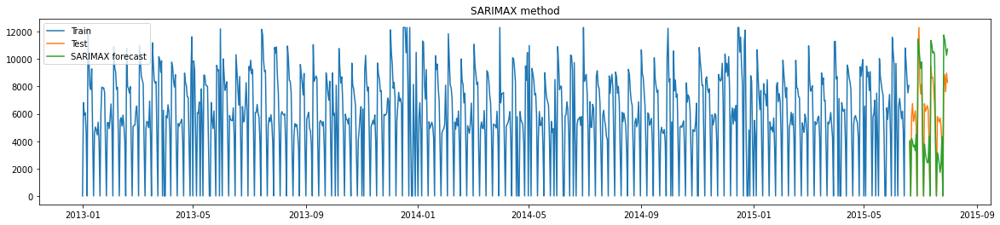

In [ ]:
plt.figure(figsize=(20,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarimax['sarimax_forecast'][test.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarimax['sarimax_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarimax['sarimax_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_3'],'Method':['SARIMAX method with main Promo'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_3,Autoregressive integrated moving average (ARIM...,2824.47,7238157.99
0,Store_3,Seasonal autoregressive integrated moving aver...,1166.71,11.55
0,Store_3,SARIMAX method with Both Promo,2731.71,3109066.62
0,Store_3,SARIMAX method with main Promo,2304.24,28.62


## Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)

In [ ]:
### Split promotion data into train and test data sets
Store_3_Exon=Store_3['Promo2_Applicable']
promo_train = Store_3_Exon[:train_len]
promo_test = Store_3_Exon[train_len:]

In [ ]:
model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 7, 7), exog=promo_train) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Promo2_Applicable    5.641021e+03
ar.S.L7              9.998825e-01
ma.S.L7             -8.673693e-01
ma.S.L14             9.871205e-02
ma.S.L21            -3.438554e-01
ma.S.L28            -2.543181e-02
ma.S.L35            -2.320530e-01
ma.S.L42             1.413211e-01
ma.S.L49             2.501865e-01
sigma2               1.073463e+07
dtype: float64


In [ ]:
y_hat_sarimax = Store_3_Target.copy()
y_hat_sarimax['sarimax_forecast'] = model_fit.predict(Store_3_Target.index.min(), Store_3_Target.index.max(), exog=promo_test)

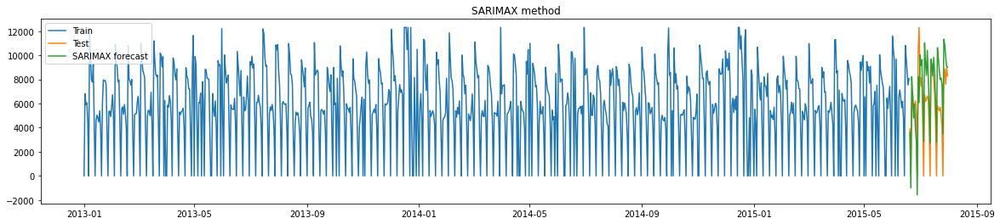

In [ ]:
plt.figure(figsize=(20,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarimax['sarimax_forecast'][test.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarimax['sarimax_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarimax['sarimax_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_3'],'Method':['SARIMAX method with Promo2'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_3,Autoregressive integrated moving average (ARIM...,2824.47,7238157.99
0,Store_3,Seasonal autoregressive integrated moving aver...,1166.71,11.55
0,Store_3,SARIMAX method with Both Promo,2731.71,3109066.62
0,Store_3,SARIMAX method with main Promo,2304.24,28.62
0,Store_3,SARIMAX method with Promo2,2557.90,3429204.66


## VAR & VARMAX

In [ ]:
# Copy data set
df=Store_3.copy()

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable,Promo_Power,S_Sales_1,S_Customers_1
Date,,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,1,1,NaN,NaN
2013-01-02,3,6823.01,805.1,1,0,1,1,1,1,1,NaN,NaN
2013-01-03,4,5902.01,721.1,1,0,1,1,1,1,1,NaN,NaN


In [ ]:
# Drop Unneseccary Columns
df.drop(['WeekOfYear','S_Sales_1','S_Customers_1','Promo_Power'],inplace=True,axis=1)

***Create dummy variables***

In [ ]:
dummies=pd.get_dummies(df['DayOfWeek'],drop_first=True,prefix='DayOfWeek')
df=pd.concat([df,dummies],axis=1)

In [ ]:
dummies=pd.get_dummies(df['StateHoliday'],drop_first=True,prefix='StateHoliday')
df=pd.concat([df,dummies],axis=1)

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,1,0,0,0,0,0,1,0,0
2013-01-02,3,6823.01,805.1,1,0,1,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,4,5902.01,721.1,1,0,1,1,1,0,0,1,0,0,0,0,0,0


In [ ]:
df.drop(['DayOfWeek','StateHoliday'],axis=1,inplace=True)
df.head()

,Sales,Customers,Open,Promo,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,1,0,0,0,0,0,1,0,0
2013-01-02,6823.01,805.1,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,5902.01,721.1,1,0,1,1,0,0,1,0,0,0,0,0,0
2013-01-04,6069.01,690.1,1,0,1,1,0,0,0,1,0,0,0,0,0
2013-01-05,4523.01,525.1,1,0,0,1,0,0,0,0,1,0,0,0,0


In [ ]:
# Casulaity Check
from statsmodels.tsa.stattools import grangercausalitytests
causality_sales=grangercausalitytests(df[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=175.4269, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=175.9879, p=0.0000  , df=1
likelihood ratio test: chi2=161.3324, p=0.0000  , df=1
parameter F test:         F=175.4269, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=100.5753, p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=202.2262, p=0.0000  , df=2
likelihood ratio test: chi2=183.1633, p=0.0000  , df=2
parameter F test:         F=100.5753, p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=72.7111 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=219.7717, p=0.0000  , df=3
likelihood ratio test: chi2=197.4721, p=0.0000  , df=3
parameter F test:         F=72.7111 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=63.2062 , p=0.0000  

***The Test Indicate casuality between Sales & Customers***

***We have earlier done ADF test & ACF/PACF Plots, sso we won't repeat them here***

In [ ]:
df.shape

(942, 15)

### Train-Test Split

In [ ]:
train_len = 900
train = df[0:train_len] # first 900 day as training set
test = df[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
train.head(3)

,Sales,Customers,Open,Promo,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,1,0,0,0,0,0,1,0,0
2013-01-02,6823.01,805.1,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,5902.01,721.1,1,0,1,1,0,0,1,0,0,0,0,0,0


### Standardising numerical values in test-train datasets using minmax

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Fit transform on train data

scaler = MinMaxScaler()
train[['Sales','Customers']]=scaler.fit_transform(train[['Sales','Customers']])
train.head()

,Sales,Customers,Open,Promo,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2013-01-01,0.000000,0.000000,0,0,1,1,1,0,0,0,0,0,1,0,0
2013-01-02,0.554072,0.690288,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,0.479281,0.618258,1,0,1,1,0,0,1,0,0,0,0,0,0
2013-01-04,0.492842,0.591675,1,0,1,1,0,0,0,1,0,0,0,0,0
2013-01-05,0.367297,0.450188,1,0,0,1,0,0,0,0,1,0,0,0,0


In [ ]:
test[['Sales','Customers']]=scaler.transform(test[['Sales','Customers']])
test.head()

,Sales,Customers,Open,Promo,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2015-06-20,0.315975,0.363580,1,0,0,0,0,0,0,0,1,0,0,0,0
2015-06-21,0.000000,0.000000,0,0,0,0,0,0,0,0,0,1,0,0,0
2015-06-22,0.474246,0.547085,1,0,0,0,0,0,0,0,0,0,0,0,0
2015-06-23,0.548713,0.667993,1,0,0,0,1,0,0,0,0,0,0,0,0
2015-06-24,0.442413,0.542798,1,0,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
train.columns

Index(['Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'Promo2_Applicable', 'DayOfWeek_2', 'DayOfWeek_3', 'DayOfWeek_4',
       'DayOfWeek_5', 'DayOfWeek_6', 'DayOfWeek_7', 'StateHoliday_2',
       'StateHoliday_3', 'StateHoliday_4'],
      dtype='object')

In [ ]:
exog = train[['Promo','SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4','Promo2_Applicable']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=30)
print(res.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -11.89      -11.74   6.853e-06      -11.83
1       -11.91      -11.74   6.690e-06      -11.85
2       -11.93      -11.73   6.589e-06      -11.85
3       -11.99     -11.77*   6.235e-06      -11.90
4       -11.98      -11.74   6.245e-06      -11.89
5       -11.99      -11.73   6.199e-06      -11.89
6       -12.00      -11.72   6.125e-06      -11.89
7       -12.03      -11.73   5.934e-06      -11.92
8       -12.07      -11.74   5.748e-06      -11.94
9       -12.07      -11.72   5.717e-06      -11.94
10      -12.08      -11.71   5.645e-06     -11.94*
11      -12.08      -11.68   5.682e-06      -11.93
12      -12.07      -11.66   5.713e-06      -11.91
13      -12.07      -11.64   5.703e-06      -11.91
14      -12.08      -11.62   5.648e-06      -11.91
15      -12.08      -11.60   5.680e-06      -11.89
16      -12.08      -11.57   5.

***AIC is Lowest at lag 24***

In [ ]:
#Fitting the model with lag 24

var_model_final = var_model.fit(24)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 18, May, 2022
Time:                     22:41:18
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.4476
Nobs:                     876.000    HQIC:                  -11.8651
Log likelihood:           2948.16    FPE:                5.43236e-06
AIC:                     -12.1236    Det(Omega_mle):     4.73795e-06
--------------------------------------------------------------------
Results for equation Sales
                       coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------
const                    -0.304130    277991.242806           -0.000           1.000
Promo                     0.235578         0.013160           17.901           0.000
SchoolHoliday            -0.003136         0

### Cointegration test

In [ ]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.vecm import select_coint_rank

def cointegration_test(df, lag): 
    alpha=0.05
    out = coint_johansen(df,-1,lag)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

In [ ]:
train['Sales']=train['Sales'].apply(lambda x:round(x))
train['Customers']=train['Customers'].apply(lambda x:round(x))

In [ ]:
cointegration_test(train[['Sales','Customers']],7)
rank_result=select_coint_rank(train[['Sales','Customers']],-1,1)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  207.8     > 12.3212   =>   True
Customers ::  0.72      > 4.1296    =>   False


In [ ]:
print(rank_result.rank)

2


We have the rank of Johassen test as 2 which means that the time series are stationary but do not seem to be co-integratied

In [ ]:
# Getting lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train[['Sales','Customers']].values[-lag_order:]
forecast_input

24


array([[0, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [0, 0],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 1],
       [1, 1],
       [0, 0],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1]], dtype=int64)

In [ ]:
exog_test = test[['Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4','Promo2_Applicable']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=test.index, columns=['Sales','Customers'])
var_forecast

,Sales,Customers
Date,,
2015-06-20,0.122818,0.295028
2015-06-21,0.096858,0.041208
2015-06-22,0.666703,0.777471
2015-06-23,0.426602,0.576948
2015-06-24,0.559610,0.718000
2015-06-25,0.462761,0.652667
2015-06-26,0.502235,0.648492
2015-06-27,0.511901,0.562696
2015-06-28,0.292614,0.222093


In [ ]:
#Adding forecasted values
test['VarForecastedSales']=var_forecast.Sales
test['VarForecastedCustomers']=var_forecast.Customers

In [ ]:
def forecasted_timeseries_visualization(series,forecasted_series,c,model):
    fig = plt.figure(figsize=(20, 3))
    series.plot(label='Actual')
    forecasted_series.plot(label='Forecasted')
    plt.xlabel('Date')
    plt.ylabel(c)
    plt.legend(loc='best')
    plt.title('{} model For {}'.format(model,c))
    plt.show()

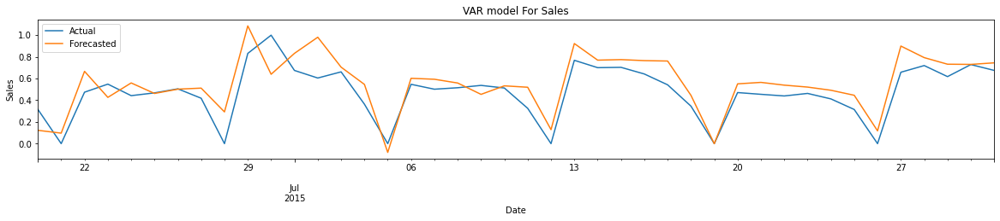

In [ ]:
forecasted_timeseries_visualization(test['Sales'],test['VarForecastedSales'],'Sales','VAR')


In [ ]:
from sklearn.metrics import mean_squared_error
summary_df=pd.DataFrame(columns=['Store','Model','RMSE_SALES','MAPE_SALES','RMSE_CUSTOMERS','MAPE_CUSTOMERS'])

def summary(s,fs,c,fc,store,model):
    rmse_sales = np.sqrt(mean_squared_error(s, fs)).round(2)
    mape_sales = np.round(np.mean(np.abs(s-fs)/s)*100,2)
    rmse_customers = np.sqrt(mean_squared_error(c, fc)).round(2)
    mape_customers = np.round(np.mean(np.abs(c-fc)/c)*100,2)
    temp=pd.DataFrame({'Store':[store],'Model':[model], 'RMSE_SALES': [rmse_sales],'MAPE_SALES': [mape_sales] , 
                            'RMSE_CUSTOMERS': [rmse_customers],'MAPE_CUSTOMERS': [mape_customers]})
    return temp

In [ ]:
d=summary(test['Sales'], test['VarForecastedSales'],
       test['Customers'], test['VarForecastedCustomers'],'Store_3','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head()

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_3,VAR,0.15,inf,0.16,inf


In [ ]:
#modelling

exog = train[['Promo2_Applicable', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                 171.980
                              + intercept   AIC                           -229.960
Date:                    Wed, 18 May 2022   BIC                             43.776
Time:                            22:42:48   HQIC                          -125.391
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             1.79, 2.69   Jarque-Bera (JB):       53.46, 7390.35
Prob(Q):                        0.18, 0.10   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.08, 1.00   Skew:                       0.47, 0.83
P

In [ ]:
#forecasting on test data
exog_test = test[['Promo2_Applicable', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)#'Promo2_Applicable']].astype(float)
endog_test= test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=test.index.min(),end=test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.200807,0.170981
2015-06-21,-0.016224,-0.001179
2015-06-22,0.461652,0.994294
2015-06-23,0.399734,1.007668
2015-06-24,0.351872,0.992589


In [ ]:
#Adding forecasted values

test['VarmaxForecastedSales']=varmax_forecast.Sales
test['VarmaxForecastedCustomers']=varmax_forecast.Customers

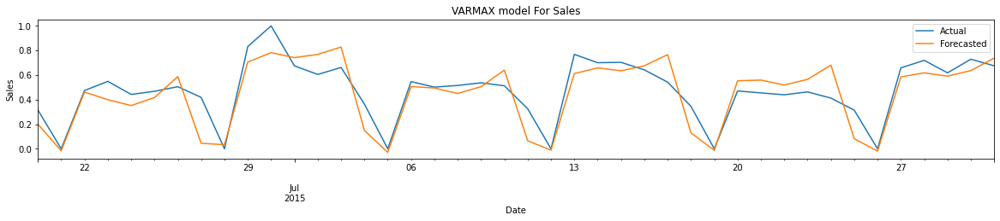

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_3,VAR,0.15,inf,0.16,inf
0,Store_3,VARMAX,0.14,inf,0.29,inf


In [ ]:
#Plotting time series

forecasted_timeseries_visualization(test['Sales'],test['VarmaxForecastedSales'],'Sales','VARMAX')
#Printing results

d=summary(test['Sales'], test['VarmaxForecastedSales'],
       test['Customers'], test['VarmaxForecastedCustomers'],'Store_3','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head()

 


## Building Model for Store 8

In [ ]:
Store_8=data[(data.Store==8)]
Store_8.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,
2013-01-01,8,2,0.01,0.1,0,0,2,1,1,1,0
2013-01-02,8,3,5419.01,698.1,1,0,1,1,1,1,0
2013-01-03,8,4,4842.01,662.1,1,0,1,1,1,1,0
2013-01-04,8,5,4059.01,517.1,1,0,1,1,1,1,0
2013-01-05,8,6,2337.01,312.1,1,0,1,0,1,1,0


In [ ]:
# Some columns will have single value , dropping then. This step not done earlier as columns would had nan also
# Promo 2 Interval is zero , thus promo 2 is not applicable
for col in Store_8.columns:
    if len(Store_8[col].unique()) == 1:
        Store_8.drop(col,inplace=True,axis=1)

In [ ]:
Store_8.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition
Date,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,1
2013-01-02,3,5419.01,698.1,1,0,1,1,1,1
2013-01-03,4,4842.01,662.1,1,0,1,1,1,1
2013-01-04,5,4059.01,517.1,1,0,1,1,1,1
2013-01-05,6,2337.01,312.1,1,0,1,0,1,1


In [ ]:
Store_8.shape

(942, 9)

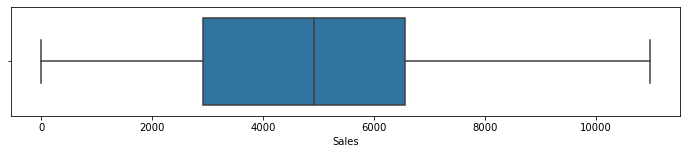

In [ ]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_8['Sales'],whis=1.5)

- Few outliers at max side
- However , it feels that these are at begining of the year
- Imputing these values to 99th percentile

In [ ]:
Store_8['Sales']=Store_8[['Sales']].clip(upper=Store_8.quantile(0.99),axis=1)

In [ ]:
Store_8['Customers']=Store_8[['Customers']].clip(upper=Store_8.quantile(0.99),axis=1)

In [ ]:
Store_8.shape

(942, 9)

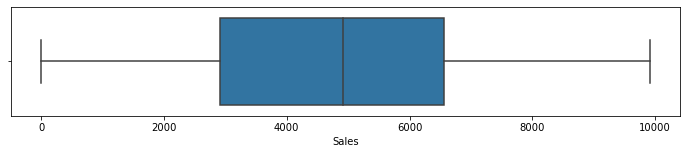

In [ ]:
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_8['Sales'],whis=2)

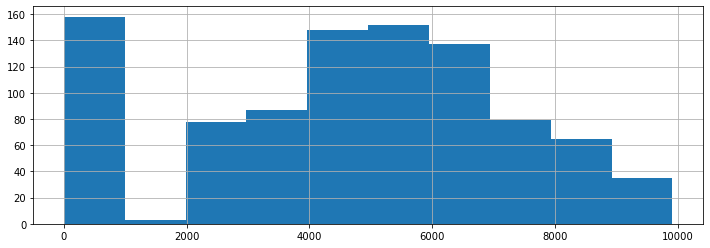

In [ ]:
fig = Store_8['Sales'].hist(figsize = (12,4))

- Near Zero sales mean that store is closed

In [ ]:
# Data description
Store_8.describe()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition
count,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000
mean,3.997877,4604.351189,547.521125,0.832272,0.382166,1.040340,0.168790,24.098726,0.579618
std,1.998404,2684.336996,292.768240,0.373823,0.486175,0.277508,0.374765,14.547508,0.493883
min,1.000000,0.010000,0.100000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000
25%,2.000000,2916.760000,374.350000,1.000000,0.000000,1.000000,0.000000,12.000000,0.000000
50%,4.000000,4919.010000,630.600000,1.000000,0.000000,1.000000,0.000000,23.000000,1.000000
75%,6.000000,6558.010000,759.850000,1.000000,1.000000,1.000000,0.000000,36.000000,1.000000
max,7.000000,9914.050000,1002.870000,1.000000,1.000000,4.000000,1.000000,52.000000,1.000000


## Time series Decomposition

### Additive seasonal decomposition

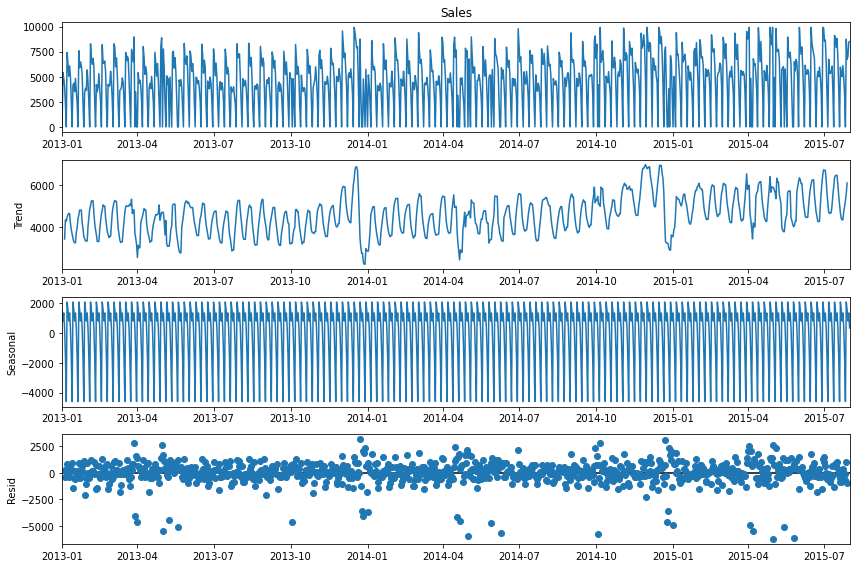

In [ ]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(Store_8.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

***There is clear seasonality in data , & It shows trend & Variation***

### Multiplicative seasonal decomposition

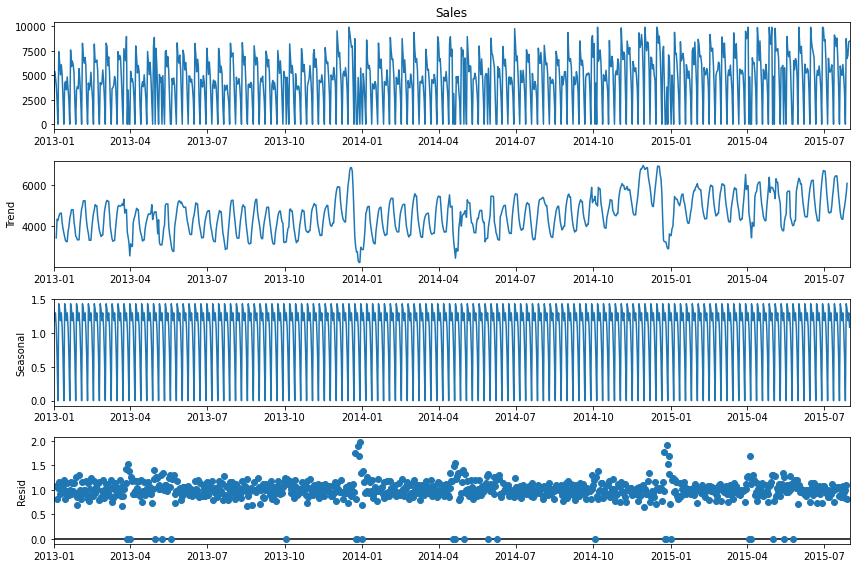

In [ ]:
decomposition = sm.tsa.seasonal_decompose(Store_8.Sales, model='multiplicative') # multiplicative seasonal index
fig = decomposition.plot()
plt.show()

***Again There is clear seasonality in data + trend + variance***

### Testing For Stationarity

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
test_result=adfuller(Store_8['Sales'])

In [ ]:
#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [ ]:
adfuller_test(Store_8['Sales'])

ADF Test Statistic : -3.5603643942137926
p-value : 0.006565585039781814
#Lags Used : 20
Number of Observations Used : 921
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


**Data is stationary**

## Handle seasonality

In [ ]:
Store_8['S_Sales_1']=Store_8['Sales']-Store_8['Sales'].shift(7)
Store_8.head(14)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,S_Sales_1
Date,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,1,NaN
2013-01-02,3,5419.01,698.1,1,0,1,1,1,1,NaN
2013-01-03,4,4842.01,662.1,1,0,1,1,1,1,NaN
2013-01-04,5,4059.01,517.1,1,0,1,1,1,1,NaN
2013-01-05,6,2337.01,312.1,1,0,1,0,1,1,NaN
2013-01-06,7,0.01,0.1,0,0,1,0,1,1,NaN
2013-01-07,1,7416.01,802.1,1,1,1,0,2,1,NaN
2013-01-08,2,6333.01,700.1,1,1,1,0,2,1,6333.0
2013-01-09,3,5038.01,611.1,1,1,1,0,2,1,-381.0


In [ ]:
## Again test dickey fuller test
adfuller_test(Store_8['S_Sales_1'].dropna())

ADF Test Statistic : -10.600149009339304
p-value : 6.201219325551164e-19
#Lags Used : 21
Number of Observations Used : 913
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<AxesSubplot:xlabel='Date'>

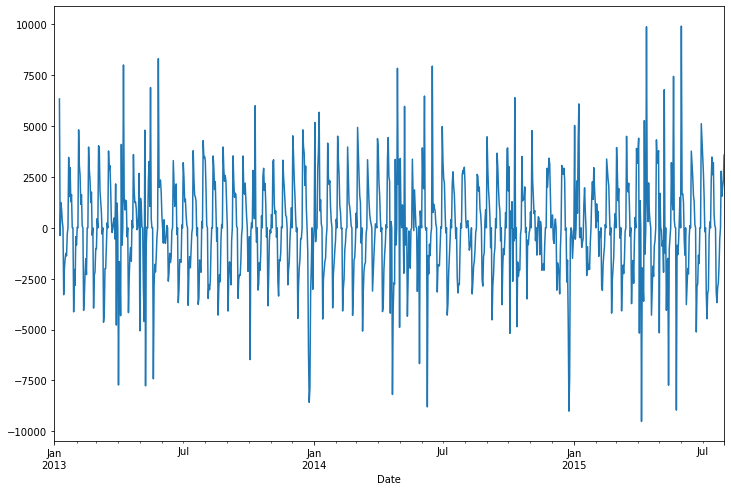

In [ ]:
Store_8['S_Sales_1'].plot()

In [ ]:
Store_8['S_Customers_1']=Store_8['Customers']-Store_8['Customers'].shift(7)

In [ ]:
## Again test dickey fuller test
adfuller_test(Store_8['S_Customers_1'].dropna())

ADF Test Statistic : -11.40165148581557
p-value : 7.62220676422619e-21
#Lags Used : 20
Number of Observations Used : 914
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


## ACF & PACF

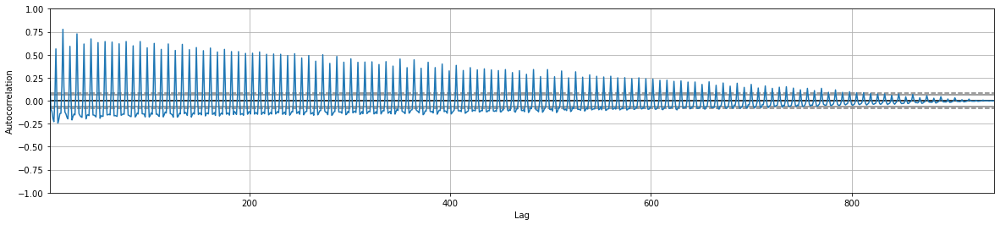

In [ ]:
from pandas.plotting import autocorrelation_plot
fig = plt.subplots(figsize=(20, 4))
ax=autocorrelation_plot(Store_8['Sales'])
plt.show()

In [ ]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

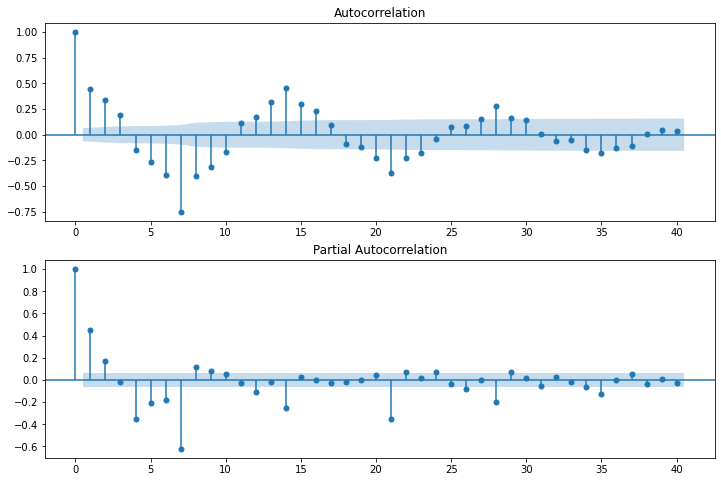

In [ ]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(Store_8['S_Sales_1'].iloc[7:],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(Store_8['S_Sales_1'].iloc[13:],lags=40,ax=ax2)

# Build and evaluate time series forecast

## ARIMA ,SARIMA & SARIMAX

In [ ]:
# Split Data set into target & Exonous variables
Store_8_Target=Store_8[['Sales']].copy()
Store_8_Exon=Store_8[['Promo']]

In [ ]:
Store_8_Target.head(2)

,Sales
Date,
2013-01-01,0.01
2013-01-02,5419.01


In [ ]:
Store_8_Exon.head(2)

,Promo
Date,
2013-01-01,0
2013-01-02,0


## Split time series data into training and test set

In [ ]:
train_len = 900
train = Store_8_Target[0:train_len] # first 900 day as training set
test = Store_8_Target[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

In [ ]:

model=ARIMA(train['Sales'],order=(0,0,7))
model_fit=model.fit()

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


In [ ]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(0, 7)   Log Likelihood               -8222.377
Method:                       css-mle   S.D. of innovations           2244.184
Date:                Wed, 18 May 2022   AIC                          16462.754
Time:                        22:42:52   BIC                          16505.976
Sample:                    01-01-2013   HQIC                         16479.265
                         - 06-19-2015                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        4561.0632     75.355     60.528      0.000    4413.370    4708.756
ma.L1.Sales     0.2492      0.032      7.719      0.000       0.186       0.312
ma.L2.Sales     0.0402      0.035      1.159      0.247      -0.028       0.108
ma.L3.Sales    -0.0375      0.032     -1.191      0.234      -0.099       0.024
ma.L4.Sales    -0.2668      0.037     -7.305      0.000      -0.338      -0.195
ma.L5.Sales    -0.2670      0.031     -8.647      0.000      -0.328      -0.207
ma.L6.Sales    -0.0440      0.034     -1.279      0.201      -0.111       0.023
ma.L7.Sales     0.3331      0.028     12.056      0.000       0.279       0.387
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1           -1.1312           -0.0000j            1.1312           -0.5000
MA.2           -0.7852           -0.8679j            1.1704           -0.3670
MA.3           -0.7852           +0.8679j            1.1704            0.3670
MA.4            0.1760           -1.0589j            1.0734           -0.2238
MA.5            0.1760           +1.0589j            1.0734            0.2238
MA.6            1.2407           -0.3769j            1.2967           -0.0469
MA.7            1.2407           +0.3769j            1.2967            0.0469
-----------------------------------------------------------------------------
"""

In [ ]:
y_hat_arima = Store_8_Target.copy()
y_hat_arima['arima_forecast'] = model_fit.predict(Store_8_Target.index.min(), Store_8_Target.index.max())

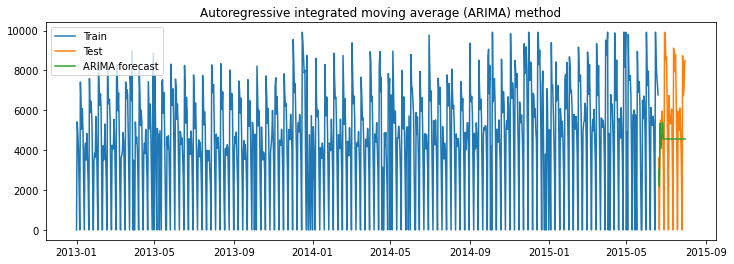

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_arima['arima_forecast'][test.index.min():], label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_arima['arima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_arima['arima_forecast'][test.index.min():])/test['Sales'])*100,2)

results = pd.DataFrame({'Store':['Store_8'],'Method':['Autoregressive integrated moving average (ARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_8,Autoregressive integrated moving average (ARIM...,2915.38,5952053.23


## Seasonal auto regressive integrated moving average (SARIMA)

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 7, 7)) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ar.S.L7     9.997047e-01
ma.S.L7    -1.229605e+00
ma.S.L14    4.992095e-01
ma.S.L21   -3.808079e-01
ma.S.L28    3.080393e-01
ma.S.L35   -2.303748e-01
ma.S.L42    1.530072e-01
ma.S.L49   -4.942272e-02
sigma2      3.370548e+06
dtype: float64


In [ ]:
y_hat_sarima = Store_8_Target.copy()
y_hat_sarima['sarima_forecast'] = model_fit.predict(Store_8_Target.index.min(), Store_8_Target.index.max())

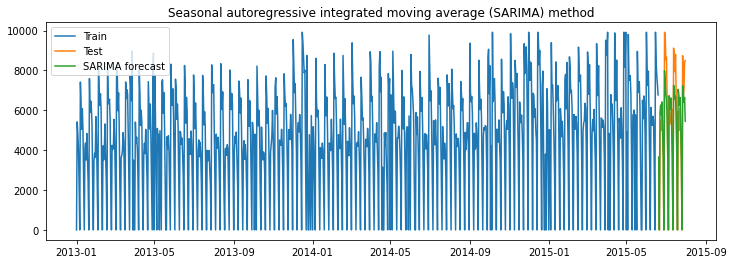

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('Seasonal autoregressive integrated moving average (SARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarima['sarima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarima['sarima_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_8'],'Method':['Seasonal autoregressive integrated moving average (SARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_8,Autoregressive integrated moving average (ARIM...,2915.38,5952053.23
0,Store_8,Seasonal autoregressive integrated moving aver...,1187.95,12.77


## Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)

In [ ]:
### Split promotion data into train and test data sets
promo_train = Store_8_Exon[:train_len]
promo_test = Store_8_Exon[train_len:]

In [ ]:
model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 7, 7), exog=promo_train) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Promo       6.737763e+03
ar.S.L7     9.986707e-01
ma.S.L7    -1.435704e+00
ma.S.L14    7.491201e-01
ma.S.L21   -5.905543e-01
ma.S.L28    3.772775e-01
ma.S.L35   -1.208446e-01
ma.S.L42    6.310807e-02
ma.S.L49   -1.650448e-02
sigma2      3.853108e+06
dtype: float64


In [ ]:
y_hat_sarimax = Store_8_Target.copy()
y_hat_sarimax['sarimax_forecast'] = model_fit.predict(Store_8_Target.index.min(), Store_8_Target.index.max(), exog=promo_test)

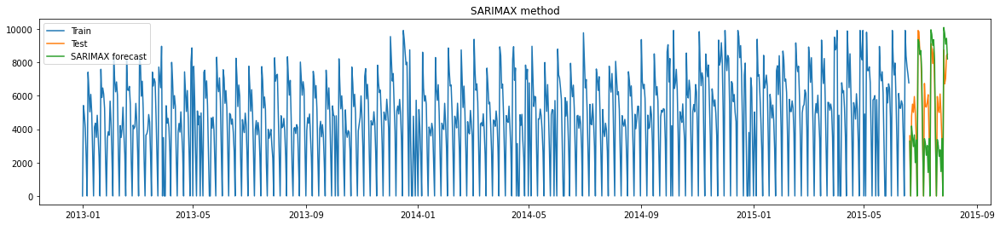

In [ ]:
plt.figure(figsize=(20,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarimax['sarimax_forecast'][test.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarimax['sarimax_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarimax['sarimax_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_8'],'Method':['SARIMAX method with Both Promo'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_8,Autoregressive integrated moving average (ARIM...,2915.38,5952053.23
0,Store_8,Seasonal autoregressive integrated moving aver...,1187.95,12.77
0,Store_8,SARIMAX method with Both Promo,1824.09,23.13


## Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)

In [ ]:
### Split promotion data into train and test data sets
Store_8_Exon=Store_8[['AbsenceOfCompetition']]
promo_train = Store_8_Exon[:train_len]
promo_test = Store_8_Exon[train_len:]

In [ ]:
model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 7, 7), exog=promo_train) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


AbsenceOfCompetition    4.173601e+03
ar.S.L7                 9.782531e-01
ma.S.L7                -7.820870e-01
ma.S.L14                3.665553e-01
ma.S.L21               -3.078039e-01
ma.S.L28                2.725111e-01
ma.S.L35               -1.591573e-01
ma.S.L42                9.049310e-02
ma.S.L49               -8.248594e-03
sigma2                  3.090978e+06
dtype: float64


In [ ]:
y_hat_sarimax = Store_8_Target.copy()
y_hat_sarimax['sarimax_forecast'] = model_fit.predict(Store_8_Target.index.min(), Store_8_Target.index.max(), exog=promo_test)

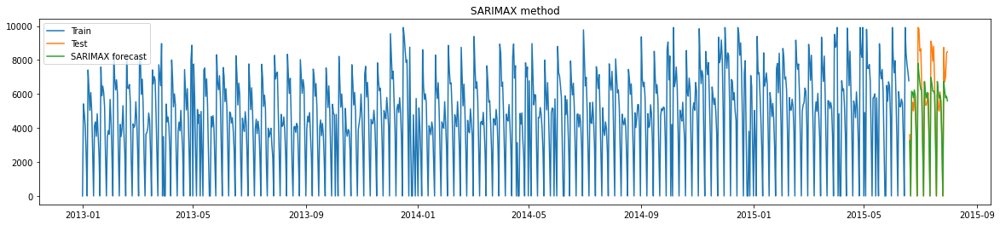

In [ ]:
plt.figure(figsize=(20,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarimax['sarimax_forecast'][test.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarimax['sarimax_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarimax['sarimax_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_8'],'Method':['SARIMAX method with Competition input'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_8,Autoregressive integrated moving average (ARIM...,2915.38,5952053.23
0,Store_8,Seasonal autoregressive integrated moving aver...,1187.95,12.77
0,Store_8,SARIMAX method with Both Promo,1824.09,23.13
0,Store_8,SARIMAX method with Competition input,1291.29,16.38


## VAR & VARMAX

In [ ]:
# Copy data set
df=Store_8.copy()

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,S_Sales_1,S_Customers_1
Date,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,1,NaN,NaN
2013-01-02,3,5419.01,698.1,1,0,1,1,1,1,NaN,NaN
2013-01-03,4,4842.01,662.1,1,0,1,1,1,1,NaN,NaN


In [ ]:
# Drop Unneseccary Columns
df.drop(['WeekOfYear','S_Sales_1','S_Customers_1'],inplace=True,axis=1)

***Create dummy variables***

In [ ]:
dummies=pd.get_dummies(df['DayOfWeek'],drop_first=True,prefix='DayOfWeek')
df=pd.concat([df,dummies],axis=1)

In [ ]:
dummies=pd.get_dummies(df['StateHoliday'],drop_first=True,prefix='StateHoliday')
df=pd.concat([df,dummies],axis=1)

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,AbsenceOfCompetition,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,1,0,0,0,0,0,1,0,0
2013-01-02,3,5419.01,698.1,1,0,1,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,4,4842.01,662.1,1,0,1,1,1,0,0,1,0,0,0,0,0,0


In [ ]:
df.drop(['DayOfWeek','StateHoliday'],axis=1,inplace=True)
df.head()

,Sales,Customers,Open,Promo,SchoolHoliday,AbsenceOfCompetition,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,1,0,0,0,0,0,1,0,0
2013-01-02,5419.01,698.1,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,4842.01,662.1,1,0,1,1,0,0,1,0,0,0,0,0,0
2013-01-04,4059.01,517.1,1,0,1,1,0,0,0,1,0,0,0,0,0
2013-01-05,2337.01,312.1,1,0,0,1,0,0,0,0,1,0,0,0,0


In [ ]:
# Casulaity Check
from statsmodels.tsa.stattools import grangercausalitytests
causality_sales=grangercausalitytests(df[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=107.3444, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=107.6877, p=0.0000  , df=1
likelihood ratio test: chi2=101.9590, p=0.0000  , df=1
parameter F test:         F=107.3444, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=73.9357 , p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=148.6622, p=0.0000  , df=2
likelihood ratio test: chi2=138.0155, p=0.0000  , df=2
parameter F test:         F=73.9357 , p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=76.5524 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=231.3822, p=0.0000  , df=3
likelihood ratio test: chi2=206.8336, p=0.0000  , df=3
parameter F test:         F=76.5524 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=76.6783 , p=0.0000  

***The Test Indicate casuality between Sales & Customers***

***We have earlier done ADF test & ACF/PACF Plots, sso we won't repeat them here***

In [ ]:
df.shape

(942, 15)

### Train-Test Split

In [ ]:
train_len = 900
train = df[0:train_len] # first 900 day as training set
test = df[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
train.head(3)

,Sales,Customers,Open,Promo,SchoolHoliday,AbsenceOfCompetition,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,1,0,0,0,0,0,1,0,0
2013-01-02,5419.01,698.1,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,4842.01,662.1,1,0,1,1,0,0,1,0,0,0,0,0,0


### Standardising numerical values in test-train datasets using minmax

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Fit transform on train data

scaler = MinMaxScaler()
train[['Sales','Customers']]=scaler.fit_transform(train[['Sales','Customers']])
train.head()

,Sales,Customers,Open,Promo,SchoolHoliday,AbsenceOfCompetition,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2013-01-01,0.000000,0.000000,0,0,1,1,1,0,0,0,0,0,1,0,0
2013-01-02,0.546599,0.696072,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,0.488398,0.660171,1,0,1,1,0,0,1,0,0,0,0,0,0
2013-01-04,0.409419,0.515572,1,0,1,1,0,0,0,1,0,0,0,0,0
2013-01-05,0.235726,0.311138,1,0,0,1,0,0,0,0,1,0,0,0,0


In [ ]:
test[['Sales','Customers']]=scaler.transform(test[['Sales','Customers']])
test.head()

,Sales,Customers,Open,Promo,SchoolHoliday,AbsenceOfCompetition,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2015-06-20,0.364231,0.407870,1,0,0,0,0,0,0,0,1,0,0,0,0
2015-06-21,0.000000,0.000000,0,0,0,0,0,0,0,0,0,1,0,0,0
2015-06-22,0.483758,0.628260,1,0,0,0,0,0,0,0,0,0,0,0,0
2015-06-23,0.554870,0.756903,1,0,0,0,1,0,0,0,0,0,0,0,0
2015-06-24,0.504840,0.623274,1,0,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
train.columns

Index(['Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'AbsenceOfCompetition', 'DayOfWeek_2', 'DayOfWeek_3', 'DayOfWeek_4',
       'DayOfWeek_5', 'DayOfWeek_6', 'DayOfWeek_7', 'StateHoliday_2',
       'StateHoliday_3', 'StateHoliday_4'],
      dtype='object')

In [ ]:
exog = train[[ 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']]#,'AbsenceOfCompetition']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=30)
print(res.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -12.01      -11.87   6.091e-06      -11.95
1       -12.06      -11.90   5.774e-06      -12.00
2       -12.09      -11.90   5.612e-06      -12.02
3       -12.11      -11.91   5.481e-06      -12.03
4       -12.12      -11.89   5.444e-06      -12.03
5       -12.14      -11.89   5.336e-06      -12.04
6       -12.16      -11.88   5.246e-06      -12.05
7       -12.19      -11.89   5.093e-06      -12.07
8       -12.28      -11.96   4.646e-06      -12.16
9       -12.36      -12.02   4.308e-06      -12.23
10      -12.38      -12.02   4.201e-06      -12.24
11      -12.40      -12.01   4.139e-06      -12.25
12      -12.40      -11.99   4.136e-06      -12.24
13      -12.42      -11.99   4.036e-06      -12.26
14      -12.50     -12.05*   3.740e-06     -12.32*
15      -12.50      -12.03   3.727e-06      -12.32
16      -12.50      -12.01   3.

***AIC is Lowest at lag 29***

In [ ]:
#Fitting the model with lag 29

var_model_final = var_model.fit(29)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 18, May, 2022
Time:                     22:43:48
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.7642
Nobs:                     871.000    HQIC:                  -12.2443
Log likelihood:           3132.16    FPE:                3.57671e-06
AIC:                     -12.5418    Det(Omega_mle):     3.05787e-06
--------------------------------------------------------------------
Results for equation Sales
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const                 -0.271730    170160.132386           -0.000           1.000
Promo                  0.235655         0.011082           21.264           0.000
SchoolHoliday         -0.025198         0.006809        

### Cointegration test

In [ ]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.vecm import select_coint_rank

def cointegration_test(df, lag): 
    alpha=0.05
    out = coint_johansen(df,-1,lag)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

In [ ]:
train['Sales']=train['Sales'].apply(lambda x:round(x))
train['Customers']=train['Customers'].apply(lambda x:round(x))

In [ ]:
cointegration_test(train[['Sales','Customers']],7)
rank_result=select_coint_rank(train[['Sales','Customers']],-1,1)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  166.65    > 12.3212   =>   True
Customers ::  0.8       > 4.1296    =>   False


In [ ]:
print(rank_result.rank)

2


We have the rank of Johassen test as 2 which means that the time series are stationary but do not seem to be co-integratied

In [ ]:
# Getting lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train[['Sales','Customers']].values[-lag_order:]
forecast_input

29


array([[1, 1],
       [0, 0],
       [0, 0],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1]], dtype=int64)

In [ ]:
exog_test = test[['Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']]#,'AbsenceOfCompetition']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=test.index, columns=['Sales','Customers'])
var_forecast

,Sales,Customers
Date,,
2015-06-20,0.464798,0.491106
2015-06-21,0.206557,0.181048
2015-06-22,0.722099,0.825309
2015-06-23,0.712745,0.812045
2015-06-24,0.713001,0.803359
2015-06-25,0.806040,0.932921
2015-06-26,0.726365,0.818584
2015-06-27,0.451793,0.489055
2015-06-28,0.191894,0.155020


In [ ]:
#Adding forecasted values
test['VarForecastedSales']=var_forecast.Sales
test['VarForecastedCustomers']=var_forecast.Customers

In [ ]:
def forecasted_timeseries_visualization(series,forecasted_series,c,model):
    fig = plt.figure(figsize=(20, 3))
    series.plot(label='Actual')
    forecasted_series.plot(label='Forecasted')
    plt.xlabel('Date')
    plt.ylabel(c)
    plt.legend(loc='best')
    plt.title('{} model For {}'.format(model,c))
    plt.show()

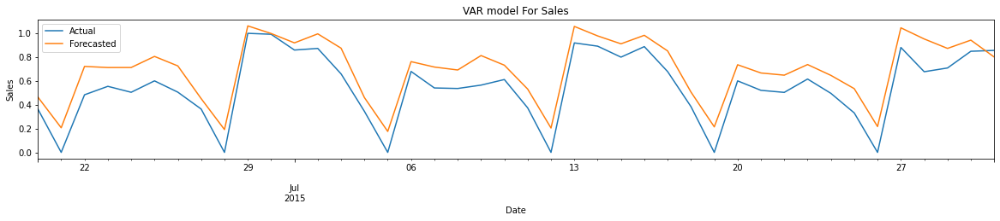

In [ ]:
forecasted_timeseries_visualization(test['Sales'],test['VarForecastedSales'],'Sales','VAR')


In [ ]:
from sklearn.metrics import mean_squared_error
summary_df=pd.DataFrame(columns=['Store','Model','RMSE_SALES','MAPE_SALES','RMSE_CUSTOMERS','MAPE_CUSTOMERS'])

def summary(s,fs,c,fc,store,model):
    rmse_sales = np.sqrt(mean_squared_error(s, fs)).round(2)
    mape_sales = np.round(np.mean(np.abs(s-fs)/s)*100,2)
    rmse_customers = np.sqrt(mean_squared_error(c, fc)).round(2)
    mape_customers = np.round(np.mean(np.abs(c-fc)/c)*100,2)
    temp=pd.DataFrame({'Store':[store],'Model':[model], 'RMSE_SALES': [rmse_sales],'MAPE_SALES': [mape_sales] , 
                            'RMSE_CUSTOMERS': [rmse_customers],'MAPE_CUSTOMERS': [mape_customers]})
    return temp

In [ ]:
d=summary(test['Sales'], test['VarForecastedSales'],
       test['Customers'], test['VarForecastedCustomers'],'Store_8','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head()

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_8,VAR,0.16,inf,0.14,inf


In [ ]:
#modelling

exog = train[['Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4','AbsenceOfCompetition']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                 100.170
                              + intercept   AIC                            -82.341
Date:                    Wed, 18 May 2022   BIC                            201.001
Time:                            22:43:56   HQIC                            25.898
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):            10.02, 1.31   Jarque-Bera (JB):     105.30, 16206.90
Prob(Q):                        0.00, 0.25   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         2.00, 0.84   Skew:                      0.50, -1.11
P

In [ ]:
#forecasting on test data

exog_test = test[['Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4','AbsenceOfCompetition']].astype(float)
endog_test= test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=test.index.min(),end=test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.293389,0.015775
2015-06-21,0.267412,-0.033762
2015-06-22,0.455324,0.997038
2015-06-23,0.248158,0.989498
2015-06-24,0.254130,1.010064


In [ ]:
#Adding forecasted values

test['VarmaxForecastedSales']=varmax_forecast.Sales
test['VarmaxForecastedCustomers']=varmax_forecast.Customers

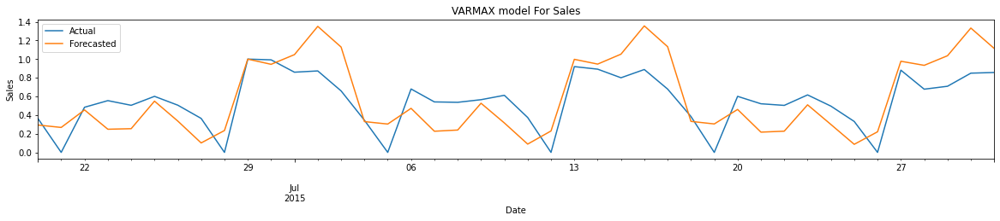

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_8,VAR,0.16,inf,0.14,inf
0,Store_8,VARMAX,0.26,inf,0.27,inf


In [ ]:
#Plotting time series

forecasted_timeseries_visualization(test['Sales'],test['VarmaxForecastedSales'],'Sales','VARMAX')
#Printing results

d=summary(test['Sales'], test['VarmaxForecastedSales'],
       test['Customers'], test['VarmaxForecastedCustomers'],'Store_8','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head()

 


## Building Model for Store 9

In [ ]:
Store_9=data[(data.Store==9)]
Store_9.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,
2013-01-01,9,2,0.01,0.1,0,0,2,1,1,0,0
2013-01-02,9,3,4903.01,481.1,1,0,1,1,1,0,0
2013-01-03,9,4,4602.01,453.1,1,0,1,1,1,0,0
2013-01-04,9,5,4798.01,497.1,1,0,1,1,1,0,0
2013-01-05,9,6,4254.01,450.1,1,0,1,0,1,0,0


In [ ]:
# Some columns will have single value , dropping then. This step not done earlier as columns would had nan also
# Promo 2 Interval is zero , thus promo 2 is not applicable
for col in Store_9.columns:
    if len(Store_9[col].unique()) == 1:
        Store_9.drop(col,inplace=True,axis=1)

In [ ]:
Store_9.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear
Date,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1
2013-01-02,3,4903.01,481.1,1,0,1,1,1
2013-01-03,4,4602.01,453.1,1,0,1,1,1
2013-01-04,5,4798.01,497.1,1,0,1,1,1
2013-01-05,6,4254.01,450.1,1,0,1,0,1


In [ ]:
Store_9.shape

(942, 8)

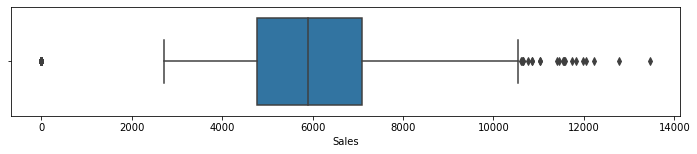

In [ ]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_9['Sales'],whis=1.5)

- Few outliers at max side
- However , it feels that these are at begining of the year
- Imputing these values to 99th percentile

In [ ]:
Store_9['Sales']=Store_9[['Sales']].clip(upper=Store_9.quantile(0.99),axis=1)

In [ ]:
Store_9['Customers']=Store_9[['Customers']].clip(upper=Store_9.quantile(0.99),axis=1)

In [ ]:
Store_9.shape

(942, 8)

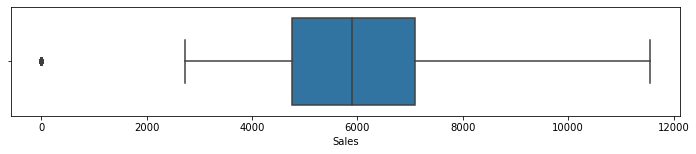

In [ ]:
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_9['Sales'],whis=2)

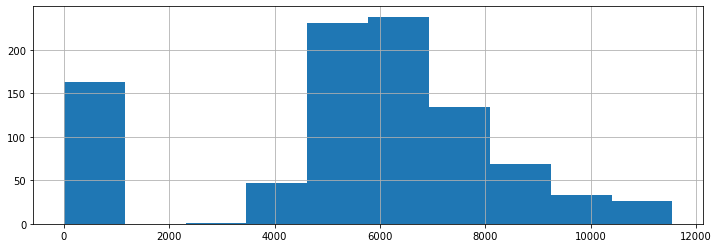

In [ ]:
fig = Store_9['Sales'].hist(figsize = (12,4))

- Near Zero sales mean that store is closed

In [ ]:
# Data description
Store_9.describe()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear
count,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000
mean,3.997877,5421.253949,479.166454,0.826964,0.382166,1.045648,0.180467,24.098726
std,1.998404,2878.718670,237.861539,0.378479,0.486175,0.286125,0.384780,14.547508
min,1.000000,0.010000,0.100000,0.000000,0.000000,1.000000,0.000000,1.000000
25%,2.000000,4765.510000,460.600000,1.000000,0.000000,1.000000,0.000000,12.000000
50%,4.000000,5904.510000,539.100000,1.000000,0.000000,1.000000,0.000000,23.000000
75%,6.000000,7086.760000,620.850000,1.000000,1.000000,1.000000,0.000000,36.000000
max,7.000000,11548.890000,880.460000,1.000000,1.000000,4.000000,1.000000,52.000000


## Time series Decomposition

### Additive seasonal decomposition

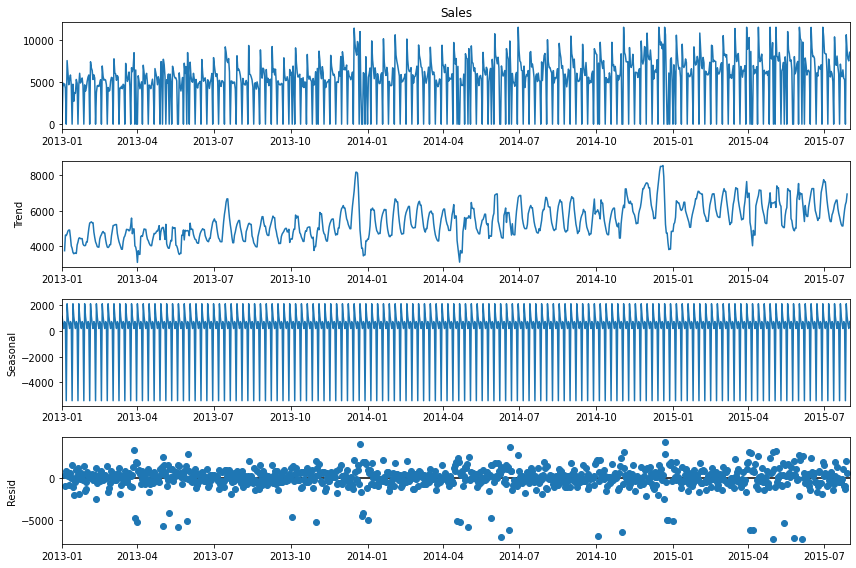

In [ ]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(Store_9.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

***There is clear seasonality in data , & It shows trend & Variation***

### Multiplicative seasonal decomposition

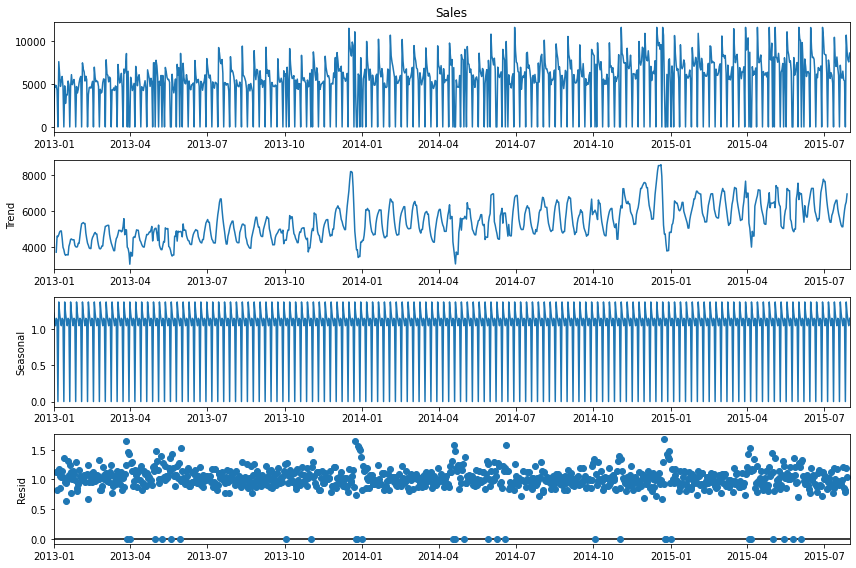

In [ ]:
decomposition = sm.tsa.seasonal_decompose(Store_9.Sales, model='multiplicative') # multiplicative seasonal index
fig = decomposition.plot()
plt.show()

***Again There is clear seasonality in data + trend + variance***

### Testing For Stationarity

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
test_result=adfuller(Store_9['Sales'])

In [ ]:
#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [ ]:
adfuller_test(Store_9['Sales'])

ADF Test Statistic : -3.1558727969095557
p-value : 0.022685285710926376
#Lags Used : 20
Number of Observations Used : 921
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


**Data is stationary**

## Handle seasonality

In [ ]:
Store_9['S_Sales_1']=Store_9['Sales']-Store_9['Sales'].shift(7)
Store_9.head(14)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,S_Sales_1
Date,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,NaN
2013-01-02,3,4903.01,481.1,1,0,1,1,1,NaN
2013-01-03,4,4602.01,453.1,1,0,1,1,1,NaN
2013-01-04,5,4798.01,497.1,1,0,1,1,1,NaN
2013-01-05,6,4254.01,450.1,1,0,1,0,1,NaN
2013-01-06,7,0.01,0.1,0,0,1,0,1,NaN
2013-01-07,1,7574.01,605.1,1,1,1,0,2,NaN
2013-01-08,2,6206.01,518.1,1,1,1,0,2,6206.0
2013-01-09,3,4699.01,431.1,1,1,1,0,2,-204.0


In [ ]:
## Again test dickey fuller test
adfuller_test(Store_9['S_Sales_1'].dropna())

ADF Test Statistic : -12.95191183914794
p-value : 3.36249658247573e-24
#Lags Used : 20
Number of Observations Used : 914
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<AxesSubplot:xlabel='Date'>

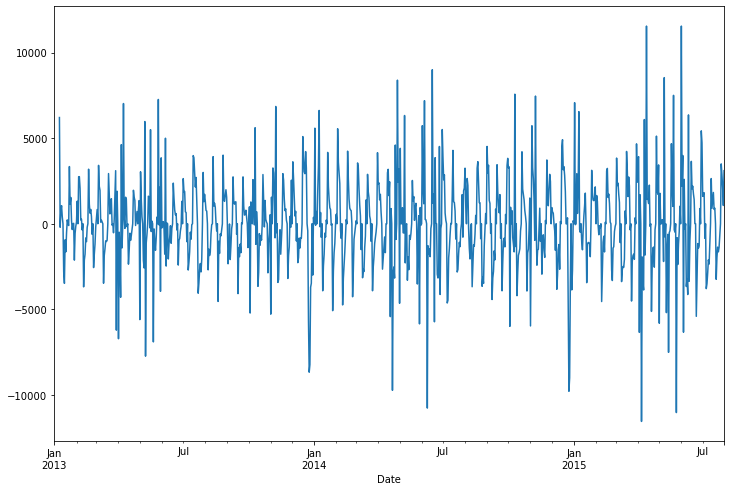

In [ ]:
Store_9['S_Sales_1'].plot()

In [ ]:
Store_9['S_Customers_1']=Store_9['Customers']-Store_9['Customers'].shift(7)

In [ ]:
## Again test dickey fuller test
adfuller_test(Store_9['S_Customers_1'].dropna())

ADF Test Statistic : -12.272801937124315
p-value : 8.564501712432477e-23
#Lags Used : 21
Number of Observations Used : 913
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


## ACF & PACF

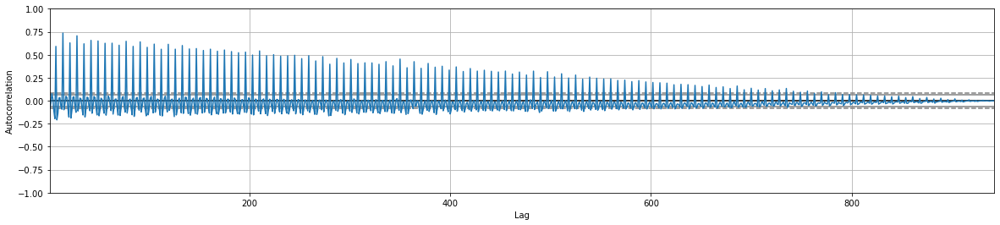

In [ ]:
from pandas.plotting import autocorrelation_plot
fig = plt.subplots(figsize=(20, 4))
ax=autocorrelation_plot(Store_9['Sales'])
plt.show()

In [ ]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

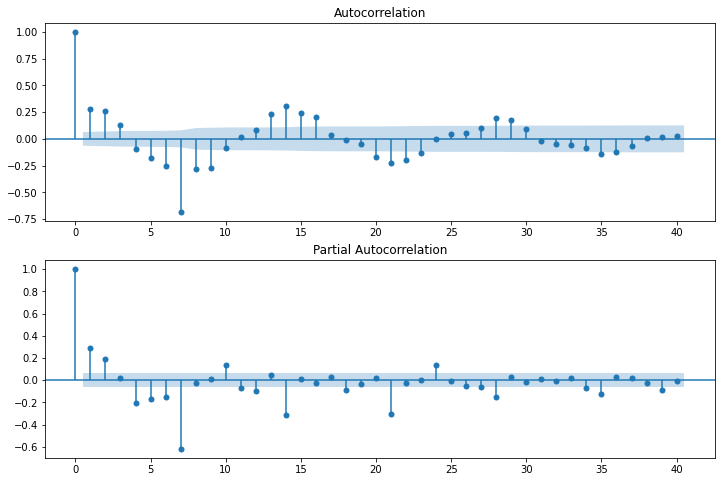

In [ ]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(Store_9['S_Sales_1'].iloc[7:],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(Store_9['S_Sales_1'].iloc[13:],lags=40,ax=ax2)

# Build and evaluate time series forecast

## ARIMA ,SARIMA & SARIMAX

In [ ]:
# Split Data set into target & Exonous variables
Store_9_Target=Store_9[['Sales']].copy()
Store_9_Exon=Store_9[['Promo']]

In [ ]:
Store_9_Target.head(2)

,Sales
Date,
2013-01-01,0.01
2013-01-02,4903.01


In [ ]:
Store_9_Exon.head(2)

,Promo
Date,
2013-01-01,0
2013-01-02,0


## Split time series data into training and test set

In [ ]:
train_len = 900
train = Store_9_Target[0:train_len] # first 900 day as training set
test = Store_9_Target[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

In [ ]:

model=ARIMA(train['Sales'],order=(0,0,7))
model_fit=model.fit()

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


In [ ]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(0, 7)   Log Likelihood               -8321.817
Method:                       css-mle   S.D. of innovations           2506.827
Date:                Wed, 18 May 2022   AIC                          16661.634
Time:                        22:44:00   BIC                          16704.855
Sample:                    01-01-2013   HQIC                         16678.145
                         - 06-19-2015                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        5383.3955     92.364     58.285      0.000    5202.366    5564.425
ma.L1.Sales     0.0111      0.033      0.337      0.736      -0.053       0.076
ma.L2.Sales     0.0499      0.031      1.601      0.109      -0.011       0.111
ma.L3.Sales     0.0568      0.034      1.696      0.090      -0.009       0.123
ma.L4.Sales     0.0083      0.032      0.263      0.792      -0.054       0.070
ma.L5.Sales    -0.0965      0.031     -3.105      0.002      -0.157      -0.036
ma.L6.Sales    -0.2454      0.037     -6.688      0.000      -0.317      -0.173
ma.L7.Sales     0.3217      0.024     13.244      0.000       0.274       0.369
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1           -1.1132           -0.0000j            1.1132           -0.5000
MA.2           -0.6663           -0.8933j            1.1144           -0.3520
MA.3           -0.6663           +0.8933j            1.1144            0.3520
MA.4            0.3555           -1.0620j            1.1199           -0.1986
MA.5            0.3555           +1.0620j            1.1199            0.1986
MA.6            1.2488           -0.4827j            1.3388           -0.0587
MA.7            1.2488           +0.4827j            1.3388            0.0587
-----------------------------------------------------------------------------
"""

In [ ]:
y_hat_arima = Store_9_Target.copy()
y_hat_arima['arima_forecast'] = model_fit.predict(Store_9_Target.index.min(), Store_9_Target.index.max())

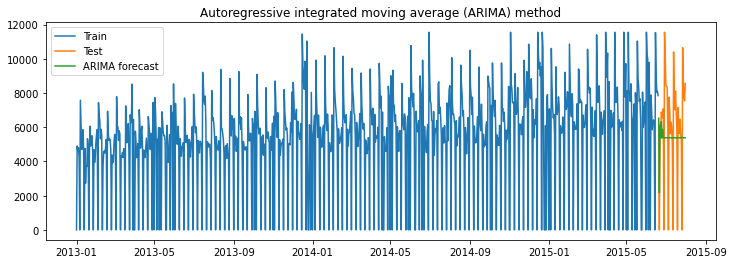

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_arima['arima_forecast'][test.index.min():], label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_arima['arima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_arima['arima_forecast'][test.index.min():])/test['Sales'])*100,2)

results = pd.DataFrame({'Store':['Store_9'],'Method':['Autoregressive integrated moving average (ARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_9,Autoregressive integrated moving average (ARIM...,2946.1,6925483.7


## Seasonal auto regressive integrated moving average (SARIMA)

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 7, 7)) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ar.S.L7     9.996449e-01
ma.S.L7    -1.145015e+00
ma.S.L14    3.742240e-01
ma.S.L21   -2.345156e-01
ma.S.L28    1.873446e-01
ma.S.L35   -2.181694e-01
ma.S.L42    1.606805e-01
ma.S.L49   -4.564051e-02
sigma2      3.956886e+06
dtype: float64


In [ ]:
y_hat_sarima = Store_9_Target.copy()
y_hat_sarima['sarima_forecast'] = model_fit.predict(Store_9_Target.index.min(), Store_9_Target.index.max())

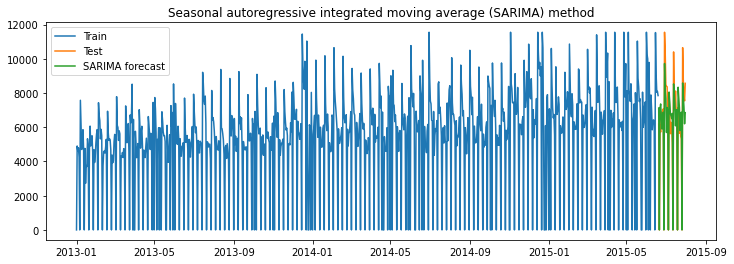

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('Seasonal autoregressive integrated moving average (SARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarima['sarima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarima['sarima_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_9'],'Method':['Seasonal autoregressive integrated moving average (SARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_9,Autoregressive integrated moving average (ARIM...,2946.10,6925483.70
0,Store_9,Seasonal autoregressive integrated moving aver...,1191.22,13.12


## Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)

In [ ]:
### Split promotion data into train and test data sets
promo_train = Store_9_Exon[:train_len]
promo_test = Store_9_Exon[train_len:]

In [ ]:
model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 7, 7), exog=promo_train) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Promo       7.015710e+03
ar.S.L7     9.995000e-01
ma.S.L7    -1.403013e+00
ma.S.L14    8.536458e-01
ma.S.L21   -6.158266e-01
ma.S.L28    3.741757e-01
ma.S.L35   -2.402070e-01
ma.S.L42    1.296882e-01
ma.S.L49   -4.017591e-02
sigma2      4.280174e+06
dtype: float64


In [ ]:
y_hat_sarimax = Store_9_Target.copy()
y_hat_sarimax['sarimax_forecast'] = model_fit.predict(Store_9_Target.index.min(), Store_9_Target.index.max(), exog=promo_test)

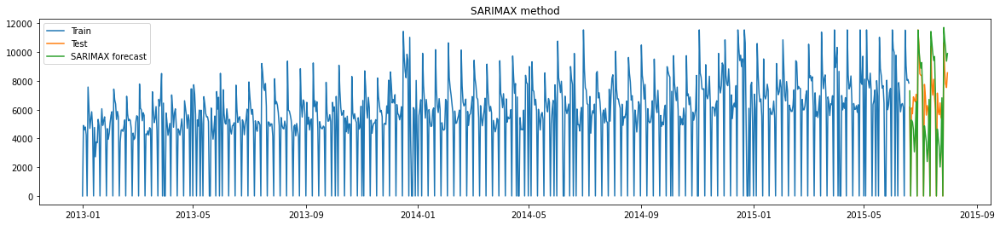

In [ ]:
plt.figure(figsize=(20,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarimax['sarimax_forecast'][test.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarimax['sarimax_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarimax['sarimax_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_9'],'Method':['SARIMAX method with Promo'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_9,Autoregressive integrated moving average (ARIM...,2946.10,6925483.70
0,Store_9,Seasonal autoregressive integrated moving aver...,1191.22,13.12
0,Store_9,SARIMAX method with Promo,1951.85,23.34


## VAR & VARMAX

In [ ]:
# Copy data set
df=Store_9.copy()

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,S_Sales_1,S_Customers_1
Date,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,NaN,NaN
2013-01-02,3,4903.01,481.1,1,0,1,1,1,NaN,NaN
2013-01-03,4,4602.01,453.1,1,0,1,1,1,NaN,NaN


In [ ]:
# Drop Unneseccary Columns
df.drop(['WeekOfYear','S_Sales_1','S_Customers_1'],inplace=True,axis=1)

***Create dummy variables***

In [ ]:
dummies=pd.get_dummies(df['DayOfWeek'],drop_first=True,prefix='DayOfWeek')
df=pd.concat([df,dummies],axis=1)

In [ ]:
dummies=pd.get_dummies(df['StateHoliday'],drop_first=True,prefix='StateHoliday')
df=pd.concat([df,dummies],axis=1)

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,0,0,0,0,0,1,0,0
2013-01-02,3,4903.01,481.1,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,4,4602.01,453.1,1,0,1,1,0,0,1,0,0,0,0,0,0


In [ ]:
df.drop(['DayOfWeek','StateHoliday'],axis=1,inplace=True)
df.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,4903.01,481.1,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,4602.01,453.1,1,0,1,0,0,1,0,0,0,0,0,0
2013-01-04,4798.01,497.1,1,0,1,0,0,0,1,0,0,0,0,0
2013-01-05,4254.01,450.1,1,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
# Casulaity Check
from statsmodels.tsa.stattools import grangercausalitytests
causality_sales=grangercausalitytests(df[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=148.1763, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=148.6502, p=0.0000  , df=1
likelihood ratio test: chi2=138.0154, p=0.0000  , df=1
parameter F test:         F=148.1763, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=90.2323 , p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=181.4296, p=0.0000  , df=2
likelihood ratio test: chi2=165.8909, p=0.0000  , df=2
parameter F test:         F=90.2323 , p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=61.8870 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=187.0554, p=0.0000  , df=3
likelihood ratio test: chi2=170.5792, p=0.0000  , df=3
parameter F test:         F=61.8870 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=47.5709 , p=0.0000  

***The Test Indicate casuality between Sales & Customers***

***We have earlier done ADF test & ACF/PACF Plots, sso we won't repeat them here***

In [ ]:
df.shape

(942, 14)

### Train-Test Split

In [ ]:
train_len = 900
train = df[0:train_len] # first 900 day as training set
test = df[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
train.head(3)

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,4903.01,481.1,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,4602.01,453.1,1,0,1,0,0,1,0,0,0,0,0,0


### Standardising numerical values in test-train datasets using minmax

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Fit transform on train data

scaler = MinMaxScaler()
train[['Sales','Customers']]=scaler.fit_transform(train[['Sales','Customers']])
train.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.000000,0.000000,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,0.424543,0.546367,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,0.398480,0.514562,1,0,1,0,0,1,0,0,0,0,0,0
2013-01-04,0.415452,0.564542,1,0,1,0,0,0,1,0,0,0,0,0
2013-01-05,0.368347,0.511155,1,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
test[['Sales','Customers']]=scaler.transform(test[['Sales','Customers']])
test.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2015-06-20,0.535030,0.608842,1,0,0,0,0,0,0,1,0,0,0,0
2015-06-21,0.000000,0.000000,0,0,0,0,0,0,0,0,1,0,0,0
2015-06-22,0.530008,0.658821,1,0,0,0,0,0,0,0,0,0,0,0
2015-06-23,0.494767,0.624744,1,0,0,1,0,0,0,0,0,0,0,0
2015-06-24,0.596421,0.704257,1,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
train.columns

Index(['Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4'],
      dtype='object')

In [ ]:
exog = train[[ 'Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=30)
print(res.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -12.12      -11.98   5.449e-06      -12.07
1       -12.22      -12.05   4.950e-06      -12.15
2       -12.27      -12.08   4.712e-06      -12.19
3       -12.31      -12.11   4.487e-06      -12.23
4       -12.31      -12.08   4.513e-06      -12.22
5       -12.31      -12.06   4.495e-06      -12.22
6       -12.34      -12.07   4.376e-06      -12.23
7       -12.35      -12.05   4.330e-06      -12.24
8       -12.38      -12.06   4.197e-06      -12.26
9       -12.42      -12.08   4.029e-06      -12.29
10      -12.49      -12.13   3.773e-06      -12.35
11      -12.50      -12.11   3.736e-06      -12.35
12      -12.50      -12.09   3.728e-06      -12.34
13      -12.51      -12.08   3.685e-06      -12.35
14      -12.58     -12.13*   3.447e-06     -12.41*
15      -12.58      -12.11   3.426e-06      -12.40
16      -12.58      -12.09   3.

***AIC is Lowest at lag 30***

In [ ]:
#Fitting the model with lag 30

var_model_final = var_model.fit(30)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 18, May, 2022
Time:                     22:44:43
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.8049
Nobs:                     870.000    HQIC:                  -12.2990
Log likelihood:           3160.28    FPE:                3.35738e-06
AIC:                     -12.6051    Det(Omega_mle):     2.85769e-06
--------------------------------------------------------------------
Results for equation Sales
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const                 -0.283748    251631.911845           -0.000           1.000
Open                   0.372897    251631.911845            0.000           1.000
Promo                  0.147673         0.010146        

### Cointegration test

In [ ]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.vecm import select_coint_rank

def cointegration_test(df, lag): 
    alpha=0.05
    out = coint_johansen(df,-1,lag)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

In [ ]:
train['Sales']=train['Sales'].apply(lambda x:round(x))
train['Customers']=train['Customers'].apply(lambda x:round(x))

In [ ]:
cointegration_test(train[['Sales','Customers']],7)
rank_result=select_coint_rank(train[['Sales','Customers']],-1,1)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  92.51     > 12.3212   =>   True
Customers ::  1.04      > 4.1296    =>   False


In [ ]:
print(rank_result.rank)

2


We have the rank of Johassen test as 2 which means that the time series are stationary but do not seem to be co-integratied

In [ ]:
# Getting lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train[['Sales','Customers']].values[-lag_order:]
forecast_input

30


array([[1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1]], dtype=int64)

In [ ]:
exog_test = test[['Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=test.index, columns=['Sales','Customers'])
var_forecast

,Sales,Customers
Date,,
2015-06-20,0.920456,0.966359
2015-06-21,0.264701,0.253966
2015-06-22,0.854117,0.902119
2015-06-23,0.756536,0.814151
2015-06-24,0.727491,0.798509
2015-06-25,0.729344,0.803147
2015-06-26,0.851314,0.910071
2015-06-27,0.893748,0.928722
2015-06-28,0.223759,0.209269


In [ ]:
#Adding forecasted values
test['VarForecastedSales']=var_forecast.Sales
test['VarForecastedCustomers']=var_forecast.Customers

In [ ]:
def forecasted_timeseries_visualization(series,forecasted_series,c,model):
    fig = plt.figure(figsize=(20, 3))
    series.plot(label='Actual')
    forecasted_series.plot(label='Forecasted')
    plt.xlabel('Date')
    plt.ylabel(c)
    plt.legend(loc='best')
    plt.title('{} model For {}'.format(model,c))
    plt.show()

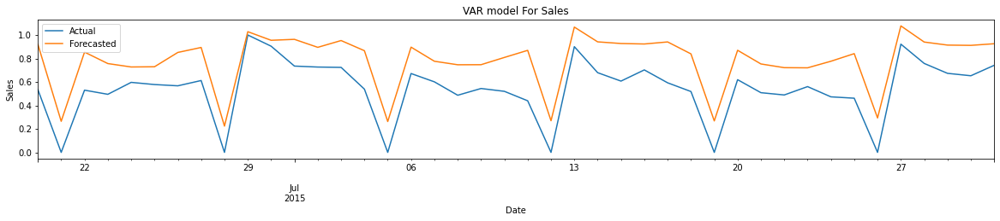

In [ ]:
forecasted_timeseries_visualization(test['Sales'],test['VarForecastedSales'],'Sales','VAR')


In [ ]:
from sklearn.metrics import mean_squared_error
summary_df=pd.DataFrame(columns=['Store','Model','RMSE_SALES','MAPE_SALES','RMSE_CUSTOMERS','MAPE_CUSTOMERS'])

def summary(s,fs,c,fc,store,model):
    rmse_sales = np.sqrt(mean_squared_error(s, fs)).round(2)
    mape_sales = np.round(np.mean(np.abs(s-fs)/s)*100,2)
    rmse_customers = np.sqrt(mean_squared_error(c, fc)).round(2)
    mape_customers = np.round(np.mean(np.abs(c-fc)/c)*100,2)
    temp=pd.DataFrame({'Store':[store],'Model':[model], 'RMSE_SALES': [rmse_sales],'MAPE_SALES': [mape_sales] , 
                            'RMSE_CUSTOMERS': [rmse_customers],'MAPE_CUSTOMERS': [mape_customers]})
    return temp

In [ ]:
d=summary(test['Sales'], test['VarForecastedSales'],
       test['Customers'], test['VarForecastedCustomers'],'Store_9','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head()

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_9,VAR,0.26,inf,0.23,inf


In [ ]:
#modelling

exog = train[['Open', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                 -65.370
                              + intercept   AIC                            240.740
Date:                    Wed, 18 May 2022   BIC                            504.872
Time:                            22:45:48   HQIC                           341.640
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             2.09, 4.29   Jarque-Bera (JB):      40.27, 14450.61
Prob(Q):                        0.15, 0.04   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.57, 0.03   Skew:                     -0.49, -4.06
P

In [ ]:
#forecasting on test data

exog_test = test[['Open', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog_test= test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=test.index.min(),end=test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.835827,1.012859
2015-06-21,0.152810,0.040025
2015-06-22,0.869095,1.004924
2015-06-23,0.706917,0.980021
2015-06-24,0.575448,0.945418


In [ ]:
#Adding forecasted values

test['VarmaxForecastedSales']=varmax_forecast.Sales
test['VarmaxForecastedCustomers']=varmax_forecast.Customers

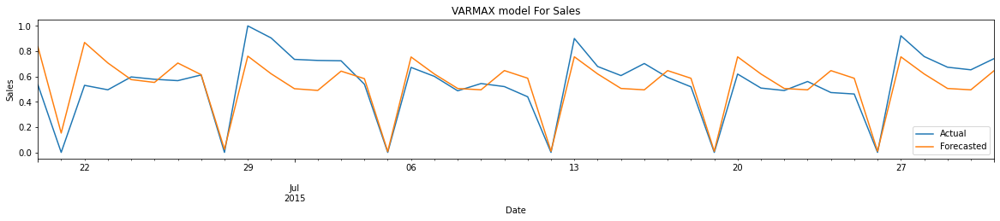

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_9,VAR,0.26,inf,0.23,inf
0,Store_9,VARMAX,0.14,inf,0.28,inf


In [ ]:
#Plotting time series

forecasted_timeseries_visualization(test['Sales'],test['VarmaxForecastedSales'],'Sales','VARMAX')
#Printing results

d=summary(test['Sales'], test['VarmaxForecastedSales'],
       test['Customers'], test['VarmaxForecastedCustomers'],'Store_9','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head()

 


In [ ]:
data.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,
2013-01-01,46,2,0.01,0.1,0,0,2,1,1,0,1
2013-01-01,25,2,0.01,0.1,0,0,2,1,1,0,0
2013-01-01,8,2,0.01,0.1,0,0,2,1,1,1,0
2013-01-01,13,2,0.01,0.1,0,0,2,1,1,0,0
2013-01-01,9,2,0.01,0.1,0,0,2,1,1,0,0


## Building Model for Store 13

In [ ]:
Store_13=data[(data.Store==13)]
Store_13.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,
2013-01-01,13,2,0.01,0.1,0,0,2,1,1,0,0
2013-01-02,13,3,3737.01,317.1,1,0,1,1,1,0,0
2013-01-03,13,4,3674.01,292.1,1,0,1,1,1,0,0
2013-01-04,13,5,3848.01,340.1,1,0,1,1,1,0,0
2013-01-05,13,6,4285.01,344.1,1,0,1,0,1,0,0


In [ ]:
# Some columns will have single value , dropping then. This step not done earlier as columns would had nan also
# Promo 2 Interval is zero , thus promo 2 is not applicable
for col in Store_13.columns:
    if len(Store_13[col].unique()) == 1:
        Store_13.drop(col,inplace=True,axis=1)

In [ ]:
Store_13.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable
Date,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,0
2013-01-02,3,3737.01,317.1,1,0,1,1,1,0
2013-01-03,4,3674.01,292.1,1,0,1,1,1,0
2013-01-04,5,3848.01,340.1,1,0,1,1,1,0
2013-01-05,6,4285.01,344.1,1,0,1,0,1,0


In [ ]:
Store_13.sort_index(inplace=True)

In [ ]:
Store_13.shape

(758, 9)

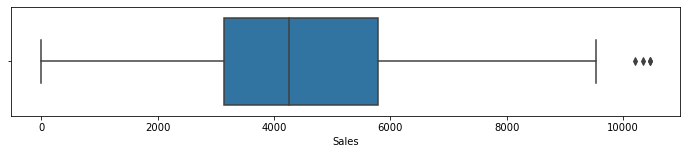

In [ ]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_13['Sales'],whis=1.5)

- Few outliers at max side
- However , it feels that these are at begining of the year
- Imputing these values to 99th percentile

In [ ]:
Store_13['Sales']=Store_13[['Sales']].clip(upper=Store_13.quantile(0.99),axis=1)

In [ ]:
Store_13['Customers']=Store_13[['Customers']].clip(upper=Store_13.quantile(0.99),axis=1)

In [ ]:
Store_13.shape

(758, 9)

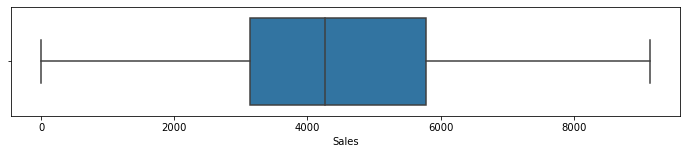

In [ ]:
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_13['Sales'],whis=2)

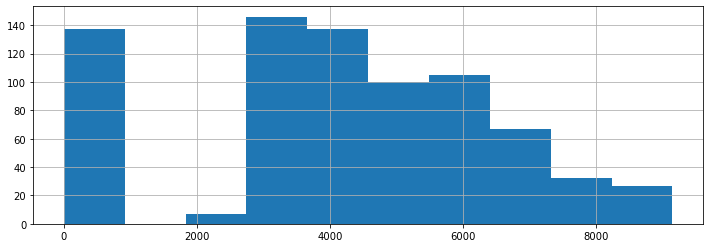

In [ ]:
fig = Store_13['Sales'].hist(figsize = (12,4))

- Near Zero sales mean that store is closed

In [ ]:
# Data description
Store_13.describe()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable
count,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000
mean,4.001319,4117.382137,313.514670,0.819261,0.377309,1.051451,0.163588,20.496042,0.313984
std,1.999009,2412.171075,167.160517,0.385056,0.485033,0.283853,0.370146,13.319838,0.464416
min,1.000000,0.010000,0.100000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000
25%,2.000000,3135.260000,276.100000,1.000000,0.000000,1.000000,0.000000,10.000000,0.000000
50%,4.000000,4261.510000,345.600000,1.000000,0.000000,1.000000,0.000000,19.000000,0.000000
75%,6.000000,5784.260000,421.100000,1.000000,1.000000,1.000000,0.000000,28.000000,1.000000
max,7.000000,9145.270000,624.390000,1.000000,1.000000,4.000000,1.000000,52.000000,1.000000


## Time series Decomposition

### Additive seasonal decomposition

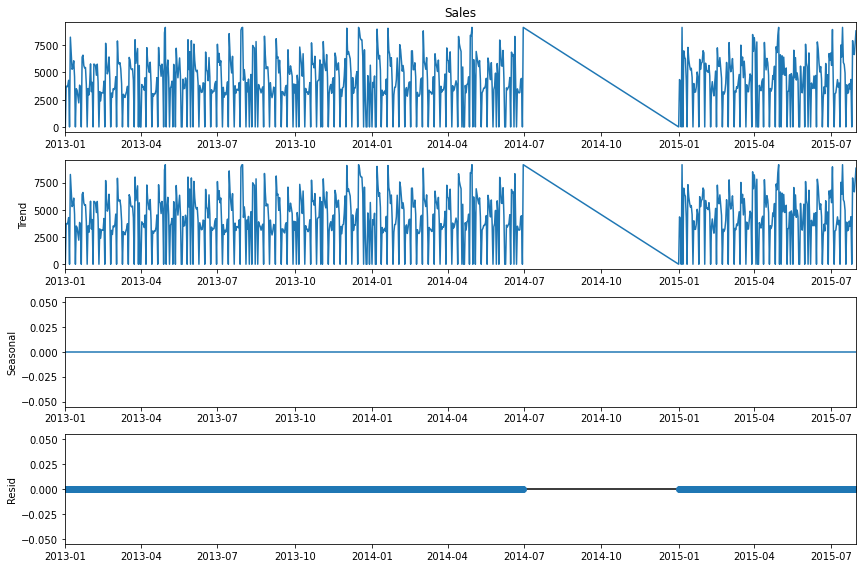

In [ ]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(Store_13.Sales, model='additive',extrapolate_trend='freq', period=1) # additive seasonal index
fig = decomposition.plot()
plt.show()

***IT seems that some data is missing in between , we earlier assumed that store must have started late , that was incorrect assumption***
***In this case , we will not impute data with Average but will try to train on data which is available***

In [ ]:
pd.date_range(start = '2013-01-01', end = '2015-07-31' ).difference(Store_13.index)

DatetimeIndex(['2014-07-01', '2014-07-02', '2014-07-03', '2014-07-04',
               '2014-07-05', '2014-07-06', '2014-07-07', '2014-07-08',
               '2014-07-09', '2014-07-10',
               ...
               '2014-12-22', '2014-12-23', '2014-12-24', '2014-12-25',
               '2014-12-26', '2014-12-27', '2014-12-28', '2014-12-29',
               '2014-12-30', '2014-12-31'],
              dtype='datetime64[ns]', length=184, freq=None)

In [ ]:
New_df=Store_13['2013-07-01':'2013-12-31']

In [ ]:
New_df.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable
Date,,,,,,,,,
2013-07-01,1,7594.01,536.1,1,1,1,0,27,0
2013-07-02,2,5930.01,403.1,1,1,1,0,27,0
2013-07-03,3,6756.01,449.1,1,1,1,0,27,0
2013-07-04,4,5655.01,437.1,1,1,1,0,27,0
2013-07-05,5,6080.01,432.1,1,1,1,0,27,0


In [ ]:
from pandas.tseries.offsets import DateOffset
from dateutil.relativedelta import relativedelta
from datetime import timedelta

In [ ]:
New_df.reset_index(inplace=True)
Store_13.reset_index(inplace=True)

In [ ]:
New_df['Date']=New_df['Date']+pd.DateOffset(days=365)

In [ ]:
New_df.head()

,Date,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable
0,2014-07-01,1,7594.01,536.1,1,1,1,0,27,0
1,2014-07-02,2,5930.01,403.1,1,1,1,0,27,0
2,2014-07-03,3,6756.01,449.1,1,1,1,0,27,0
3,2014-07-04,4,5655.01,437.1,1,1,1,0,27,0
4,2014-07-05,5,6080.01,432.1,1,1,1,0,27,0


In [ ]:
Store_13=Store_13.append(New_df,ignore_index = True)

In [ ]:
Store_13=Store_13.set_index('Date')

In [ ]:
Store_13=Store_13.sort_values(by='Date', ascending=True)

In [ ]:
pd.date_range(start = '2013-01-01', end = '2015-07-31' ).difference(Store_13.index)

DatetimeIndex([], dtype='datetime64[ns]', freq=None)

In [ ]:
Store_13.shape

(942, 9)

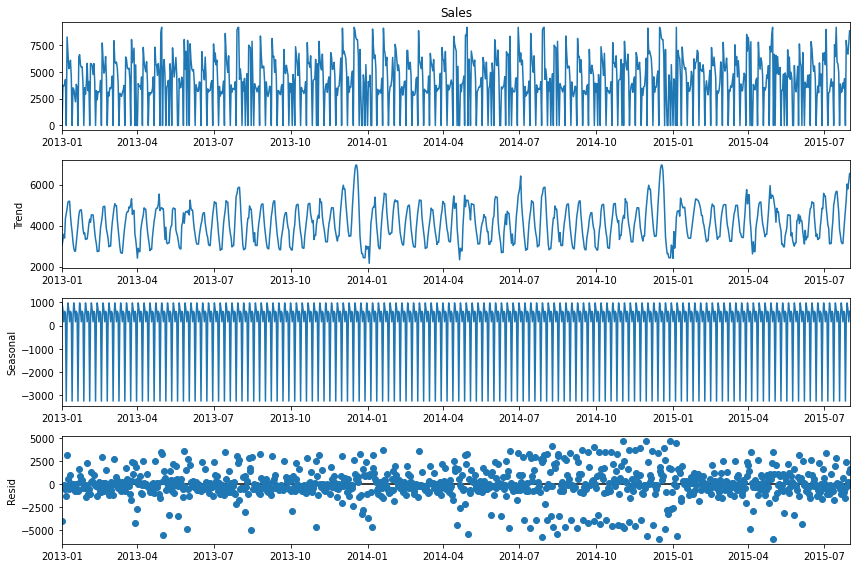

In [ ]:
decomposition = sm.tsa.seasonal_decompose(Store_13.Sales, model='additive',extrapolate_trend='freq', period=7) # multiplicative seasonal index
fig = decomposition.plot()
plt.show()

### Multiplicative seasonal decomposition

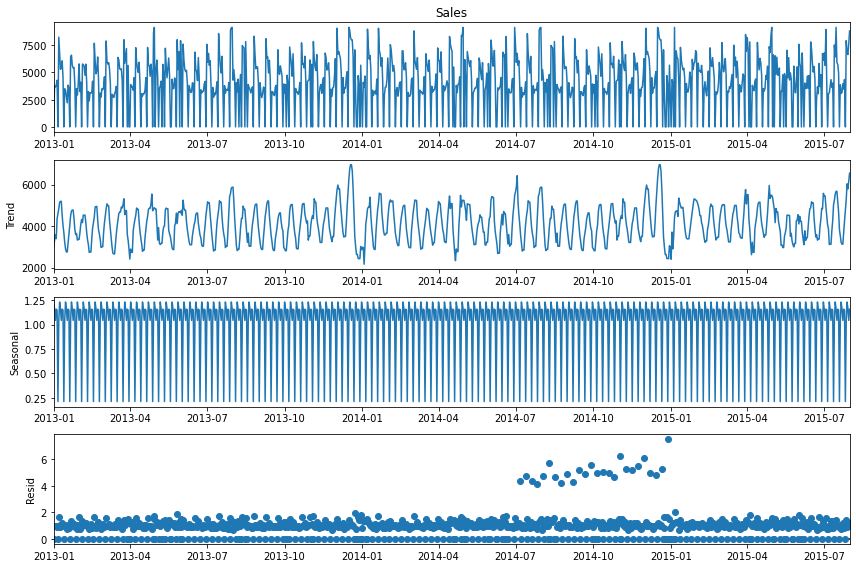

In [ ]:
decomposition = sm.tsa.seasonal_decompose(Store_13.Sales, model='multiplicative',extrapolate_trend='freq', period=7) # multiplicative seasonal index
fig = decomposition.plot()
plt.show()

***Again There is clear seasonality in data + trend + variance***

### Testing For Stationarity

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
test_result=adfuller(Store_13['Sales'])

In [ ]:
#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [ ]:
adfuller_test(Store_13['Sales'])

ADF Test Statistic : -7.198015716556264
p-value : 2.406112394540386e-10
#Lags Used : 20
Number of Observations Used : 921
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


**Data is stationary**

## Handle seasonality

In [ ]:
Store_13['S_Sales_1']=Store_13['Sales']-Store_13['Sales'].shift(7)
Store_13.head(14)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable,S_Sales_1
Date,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,0,NaN
2013-01-02,3,3737.01,317.1,1,0,1,1,1,0,NaN
2013-01-03,4,3674.01,292.1,1,0,1,1,1,0,NaN
2013-01-04,5,3848.01,340.1,1,0,1,1,1,0,NaN
2013-01-05,6,4285.01,344.1,1,0,1,0,1,0,NaN
2013-01-06,7,0.01,0.1,0,0,2,0,1,0,NaN
2013-01-07,1,8246.01,569.1,1,1,1,0,2,0,NaN
2013-01-08,2,6700.01,469.1,1,1,1,0,2,0,6700.0
2013-01-09,3,5296.01,389.1,1,1,1,0,2,0,1559.0


In [ ]:
## Again test dickey fuller test
adfuller_test(Store_13['S_Sales_1'].dropna())

ADF Test Statistic : -12.686881133083494
p-value : 1.1544912734350655e-23
#Lags Used : 20
Number of Observations Used : 914
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<AxesSubplot:xlabel='Date'>

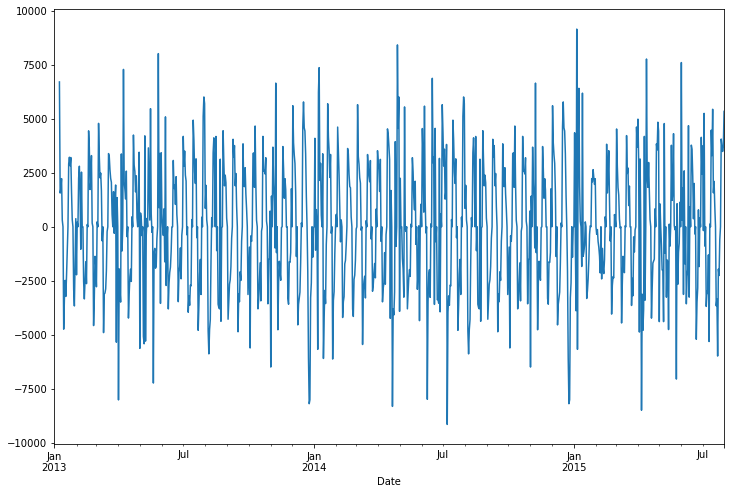

In [ ]:
Store_13['S_Sales_1'].plot()

In [ ]:
Store_13['S_Customers_1']=Store_13['Customers']-Store_13['Customers'].shift(7)

In [ ]:
## Again test dickey fuller test
adfuller_test(Store_13['S_Customers_1'].dropna())

ADF Test Statistic : -12.43745064242196
p-value : 3.8189709198886174e-23
#Lags Used : 21
Number of Observations Used : 913
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


## ACF & PACF

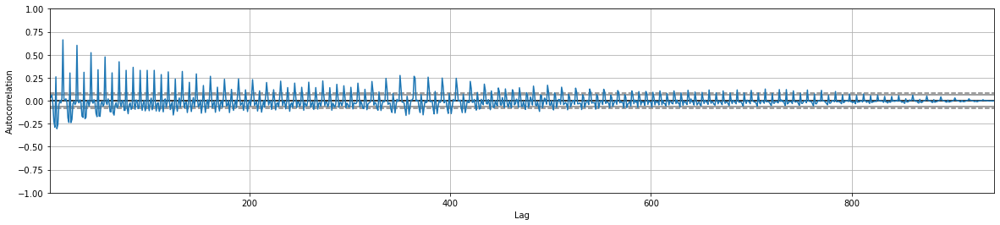

In [ ]:
from pandas.plotting import autocorrelation_plot
fig = plt.subplots(figsize=(20, 4))
ax=autocorrelation_plot(Store_13['Sales'])
plt.show()

In [ ]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

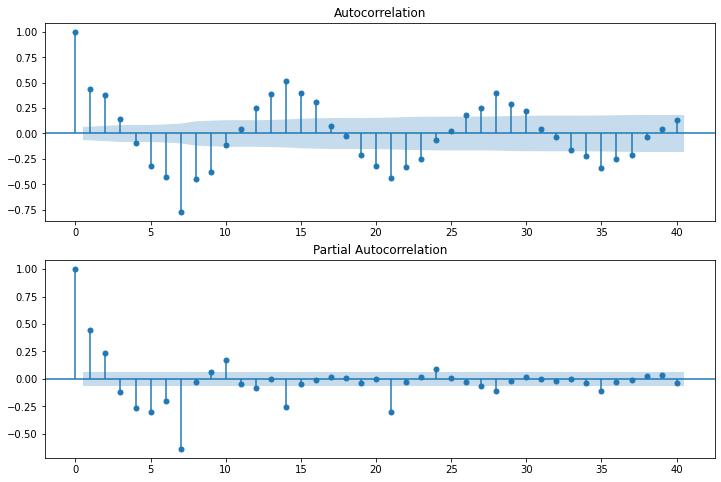

In [ ]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(Store_13['S_Sales_1'].iloc[7:],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(Store_13['S_Sales_1'].iloc[13:],lags=40,ax=ax2)

## ARIMA ,SARIMA & SARIMAX

# Build and evaluate time series forecast

In [ ]:
# Split Data set into target & Exonous variables
Store_13_Target=Store_13[['Sales']].copy()

In [ ]:
Store_13_Target.head(2)

,Sales
Date,
2013-01-01,0.01
2013-01-02,3737.01


In [ ]:
Store_13.shape

(942, 11)

In [ ]:
Store_13_Exon=Store_13[['Promo']]

## Split time series data into training and test set

In [ ]:
train_len = 900
train = Store_13_Target[0:train_len] # first 900 day as training set
test = Store_13_Target[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

In [ ]:

model=ARIMA(train['Sales'],order=(0,0,7))
model_fit=model.fit()

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


In [ ]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(0, 7)   Log Likelihood               -8177.343
Method:                       css-mle   S.D. of innovations           2134.817
Date:                Wed, 18 May 2022   AIC                          16372.686
Time:                        22:45:54   BIC                          16415.907
Sample:                    01-01-2013   HQIC                         16389.197
                         - 06-19-2015                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        4110.2078     31.928    128.735      0.000    4047.631    4172.785
ma.L1.Sales     0.0097      0.032      0.298      0.765      -0.054       0.073
ma.L2.Sales     0.0284      0.030      0.931      0.352      -0.031       0.088
ma.L3.Sales    -0.0196      0.029     -0.665      0.506      -0.077       0.038
ma.L4.Sales    -0.0892      0.028     -3.205      0.001      -0.144      -0.035
ma.L5.Sales    -0.2660      0.029     -9.319      0.000      -0.322      -0.210
ma.L6.Sales    -0.3647      0.031    -11.795      0.000      -0.425      -0.304
ma.L7.Sales     0.1469      0.027      5.412      0.000       0.094       0.200
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1           -1.1875           -0.0000j            1.1875           -0.5000
MA.2           -0.6834           -0.9307j            1.1546           -0.3508
MA.3           -0.6834           +0.9307j            1.1546            0.3508
MA.4            0.3968           -1.0341j            1.1076           -0.1917
MA.5            0.3968           +1.0341j            1.1076            0.1917
MA.6            1.1233           -0.0000j            1.1233           -0.0000
MA.7            3.1195           -0.0000j            3.1195           -0.0000
-----------------------------------------------------------------------------
"""

In [ ]:
y_hat_arima = Store_13_Target.copy()
y_hat_arima['arima_forecast'] = model_fit.predict(Store_13_Target.index.min(), Store_13_Target.index.max())

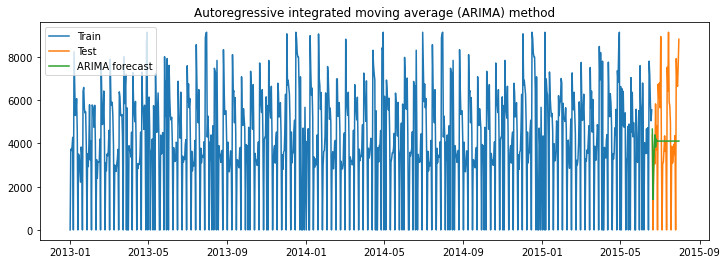

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_arima['arima_forecast'][test.index.min():], label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_arima['arima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_arima['arima_forecast'][test.index.min():])/test['Sales'])*100,2)

results = pd.DataFrame({'Store':['Store_13'],'Method':['Autoregressive integrated moving average (ARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_13,Autoregressive integrated moving average (ARIM...,2460.28,5229337.14


## Seasonal auto regressive integrated moving average (SARIMA)

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 7, 7)) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ar.S.L7     9.999390e-01
ma.S.L7    -1.104893e+00
ma.S.L14    5.092059e-01
ma.S.L21   -3.892883e-01
ma.S.L28    3.381016e-01
ma.S.L35   -3.104950e-01
ma.S.L42    2.129843e-01
ma.S.L49   -1.038693e-01
sigma2      2.913066e+06
dtype: float64


In [ ]:
y_hat_sarima = Store_13_Target.copy()
y_hat_sarima['sarima_forecast'] = model_fit.predict(Store_13_Target.index.min(), Store_13_Target.index.max())

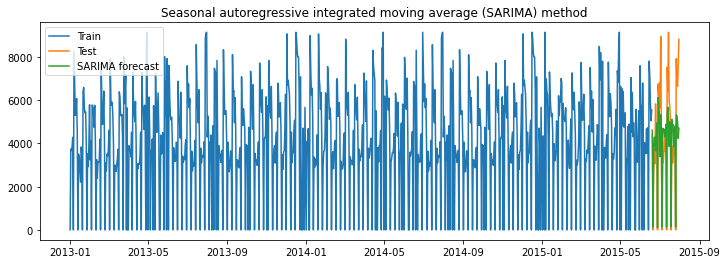

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('Seasonal autoregressive integrated moving average (SARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarima['sarima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarima['sarima_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_13'],'Method':['Seasonal autoregressive integrated moving average (SARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_13,Autoregressive integrated moving average (ARIM...,2460.28,5229337.14
0,Store_13,Seasonal autoregressive integrated moving aver...,1640.63,185820.48


## Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)

In [ ]:
### Split promotion data into train and test data sets
promo_train = Store_13_Exon[:train_len]
promo_test = Store_13_Exon[train_len:]

In [ ]:
model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 7, 7), exog=promo_train) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Promo       6.020635e+03
ar.S.L7     9.999793e-01
ma.S.L7    -1.191967e+00
ma.S.L14    6.293214e-01
ma.S.L21   -5.110813e-01
ma.S.L28    4.198427e-01
ma.S.L35   -4.004570e-01
ma.S.L42    2.303161e-01
ma.S.L49   -1.676520e-01
sigma2      2.810150e+06
dtype: float64


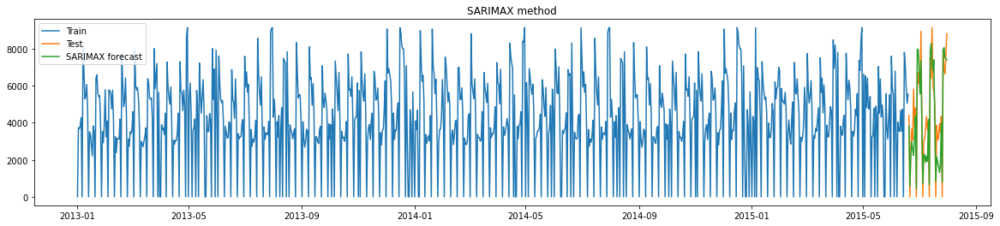

In [ ]:
y_hat_sarimax = Store_13_Target.copy()
y_hat_sarimax['sarimax_forecast'] = model_fit.predict(Store_13_Target.index.min(), Store_9_Target.index.max(), exog=promo_test)

plt.figure(figsize=(20,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarimax['sarimax_forecast'][test.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarimax['sarimax_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarimax['sarimax_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_13'],'Method':['SARIMAX method with Promo'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_13,Autoregressive integrated moving average (ARIM...,2460.28,5229337.14
0,Store_13,Seasonal autoregressive integrated moving aver...,1640.63,185820.48
0,Store_13,SARIMAX method with Promo,1293.48,958004.59


## VAR & VARMAX

In [ ]:
# Copy data set
df=Store_13.copy()

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable,S_Sales_1,S_Customers_1
Date,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,0,NaN,NaN
2013-01-02,3,3737.01,317.1,1,0,1,1,1,0,NaN,NaN
2013-01-03,4,3674.01,292.1,1,0,1,1,1,0,NaN,NaN


In [ ]:
# Drop Unneseccary Columns
df.drop(['WeekOfYear','S_Sales_1','S_Customers_1'],inplace=True,axis=1)

***Create dummy variables***

In [ ]:
dummies=pd.get_dummies(df['DayOfWeek'],drop_first=True,prefix='DayOfWeek')
df=pd.concat([df,dummies],axis=1)

In [ ]:
dummies=pd.get_dummies(df['StateHoliday'],drop_first=True,prefix='StateHoliday')
df=pd.concat([df,dummies],axis=1)

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,0,1,0,0,0,0,0,1,0,0
2013-01-02,3,3737.01,317.1,1,0,1,1,0,0,1,0,0,0,0,0,0,0
2013-01-03,4,3674.01,292.1,1,0,1,1,0,0,0,1,0,0,0,0,0,0


In [ ]:
df.drop(['DayOfWeek','StateHoliday'],axis=1,inplace=True)
df.head()

,Sales,Customers,Open,Promo,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,0,1,0,0,0,0,0,1,0,0
2013-01-02,3737.01,317.1,1,0,1,0,0,1,0,0,0,0,0,0,0
2013-01-03,3674.01,292.1,1,0,1,0,0,0,1,0,0,0,0,0,0
2013-01-04,3848.01,340.1,1,0,1,0,0,0,0,1,0,0,0,0,0
2013-01-05,4285.01,344.1,1,0,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
# Casulaity Check
from statsmodels.tsa.stattools import grangercausalitytests
causality_sales=grangercausalitytests(df[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=329.6058, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=330.6600, p=0.0000  , df=1
likelihood ratio test: chi2=283.3683, p=0.0000  , df=1
parameter F test:         F=329.6058, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=189.2019, p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=380.4274, p=0.0000  , df=2
likelihood ratio test: chi2=319.4410, p=0.0000  , df=2
parameter F test:         F=189.2019, p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=126.6929, p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=382.9335, p=0.0000  , df=3
likelihood ratio test: chi2=321.1711, p=0.0000  , df=3
parameter F test:         F=126.6929, p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=99.1854 , p=0.0000  

***The Test Indicate casuality between Sales & Customers***

***We have earlier done ADF test & ACF/PACF Plots, sso we won't repeat them here***

In [ ]:
df.shape

(942, 15)

### Train-Test Split

In [ ]:
train_len = 900
train = df[0:train_len] # first 900 day as training set
test = df[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
train.head(3)

,Sales,Customers,Open,Promo,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,0,1,0,0,0,0,0,1,0,0
2013-01-02,3737.01,317.1,1,0,1,0,0,1,0,0,0,0,0,0,0
2013-01-03,3674.01,292.1,1,0,1,0,0,0,1,0,0,0,0,0,0


### Standardising numerical values in test-train datasets using minmax

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Fit transform on train data

scaler = MinMaxScaler()
train[['Sales','Customers']]=scaler.fit_transform(train[['Sales','Customers']])
train.head()

,Sales,Customers,Open,Promo,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2013-01-01,0.000000,0.000000,0,0,1,0,1,0,0,0,0,0,1,0,0
2013-01-02,0.408627,0.507777,1,0,1,0,0,1,0,0,0,0,0,0,0
2013-01-03,0.401738,0.467731,1,0,1,0,0,0,1,0,0,0,0,0,0
2013-01-04,0.420764,0.544619,1,0,1,0,0,0,0,1,0,0,0,0,0
2013-01-05,0.468549,0.551026,1,0,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
test[['Sales','Customers']]=scaler.transform(test[['Sales','Customers']])
test.head()

,Sales,Customers,Open,Promo,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2015-06-20,0.480139,0.560637,1,0,0,0,0,0,0,0,1,0,0,0,0
2015-06-21,0.000000,0.000000,0,0,0,0,0,0,0,0,0,1,0,0,0
2015-06-22,0.284628,0.352400,1,0,0,0,0,0,0,0,0,0,0,0,0
2015-06-23,0.402504,0.458120,1,0,0,0,1,0,0,0,0,0,0,0,0
2015-06-24,0.334162,0.382835,1,0,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
train.columns

Index(['Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'Promo2_Applicable', 'DayOfWeek_2', 'DayOfWeek_3', 'DayOfWeek_4',
       'DayOfWeek_5', 'DayOfWeek_6', 'DayOfWeek_7', 'StateHoliday_2',
       'StateHoliday_3', 'StateHoliday_4'],
      dtype='object')

In [ ]:
exog = train[[ 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=30)
print(res.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -11.63      -11.49   8.911e-06      -11.57
1       -11.66      -11.50   8.619e-06      -11.60
2       -11.68      -11.50   8.434e-06      -11.61
3       -11.73     -11.52*   8.043e-06      -11.65
4       -11.74      -11.51   7.964e-06      -11.65
5       -11.74      -11.49   7.933e-06      -11.65
6       -11.75      -11.48   7.878e-06      -11.65
7       -11.78      -11.48   7.665e-06      -11.67
8       -11.79      -11.47   7.580e-06      -11.67
9       -11.79      -11.45   7.557e-06      -11.66
10      -11.82      -11.45   7.385e-06      -11.68
11      -11.82      -11.44   7.322e-06     -11.68*
12      -11.82      -11.41   7.363e-06      -11.66
13      -11.82      -11.40   7.324e-06      -11.66
14      -11.85      -11.40   7.169e-06      -11.67
15      -11.84      -11.37   7.176e-06      -11.66
16      -11.84      -11.35   7.

***AIC is Lowest at lag 30***

In [ ]:
#Fitting the model with lag 20

var_model_final = var_model.fit(20)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 18, May, 2022
Time:                     22:46:31
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.2889
Nobs:                     880.000    HQIC:                  -11.6445
Log likelihood:           2829.11    FPE:                7.03683e-06
AIC:                     -11.8646    Det(Omega_mle):     6.26007e-06
--------------------------------------------------------------------
Results for equation Sales
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const                 -0.109354         0.087883           -1.244           0.213
Promo                  0.272146         0.013988           19.456           0.000
SchoolHoliday          0.030534         0.008250        

### Cointegration test

In [ ]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.vecm import select_coint_rank

def cointegration_test(df, lag): 
    alpha=0.05
    out = coint_johansen(df,-1,lag)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

In [ ]:
train['Sales']=train['Sales'].apply(lambda x:round(x))
train['Customers']=train['Customers'].apply(lambda x:round(x))

In [ ]:
cointegration_test(train[['Sales','Customers']],7)
rank_result=select_coint_rank(train[['Sales','Customers']],-1,1)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  172.62    > 12.3212   =>   True
Customers ::  9.87      > 4.1296    =>   True


In [ ]:
print(rank_result.rank)

2


We have the rank of Johassen test as 2 which means that the time series are stationary but do not seem to be co-integratied

In [ ]:
# Getting lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train[['Sales','Customers']].values[-lag_order:]
forecast_input

20


array([[0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [0, 0],
       [0, 0],
       [0, 0],
       [0, 0],
       [0, 0],
       [1, 0],
       [0, 0],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1]], dtype=int64)

In [ ]:
exog_test = test[['Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=test.index, columns=['Sales','Customers'])
var_forecast

,Sales,Customers
Date,,
2015-06-20,0.515773,0.592210
2015-06-21,0.172366,0.072222
2015-06-22,0.461853,0.512204
2015-06-23,0.324004,0.370505
2015-06-24,0.360177,0.363731
2015-06-25,0.674001,0.657654
2015-06-26,0.427599,0.529645
2015-06-27,0.590874,0.643719
2015-06-28,0.001689,-0.052020


In [ ]:
#Adding forecasted values
test['VarForecastedSales']=var_forecast.Sales
test['VarForecastedCustomers']=var_forecast.Customers

In [ ]:
def forecasted_timeseries_visualization(series,forecasted_series,c,model):
    fig = plt.figure(figsize=(20, 3))
    series.plot(label='Actual')
    forecasted_series.plot(label='Forecasted')
    plt.xlabel('Date')
    plt.ylabel(c)
    plt.legend(loc='best')
    plt.title('{} model For {}'.format(model,c))
    plt.show()

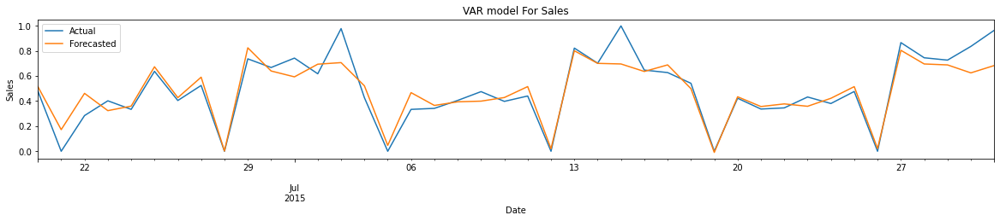

In [ ]:
forecasted_timeseries_visualization(test['Sales'],test['VarForecastedSales'],'Sales','VAR')


In [ ]:
from sklearn.metrics import mean_squared_error
summary_df=pd.DataFrame(columns=['Store','Model','RMSE_SALES','MAPE_SALES','RMSE_CUSTOMERS','MAPE_CUSTOMERS'])

def summary(s,fs,c,fc,store,model):
    rmse_sales = np.sqrt(mean_squared_error(s, fs)).round(2)
    mape_sales = np.round(np.mean(np.abs(s-fs)/s)*100,2)
    rmse_customers = np.sqrt(mean_squared_error(c, fc)).round(2)
    mape_customers = np.round(np.mean(np.abs(c-fc)/c)*100,2)
    temp=pd.DataFrame({'Store':[store],'Model':[model], 'RMSE_SALES': [rmse_sales],'MAPE_SALES': [mape_sales] , 
                            'RMSE_CUSTOMERS': [rmse_customers],'MAPE_CUSTOMERS': [mape_customers]})
    return temp

In [ ]:
d=summary(test['Sales'], test['VarForecastedSales'],
       test['Customers'], test['VarForecastedCustomers'],'Store_13','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head()

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_13,VAR,0.11,inf,0.08,inf


In [ ]:
#modelling

exog = train[['Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                -160.124
                              + intercept   AIC                            434.248
Date:                    Wed, 18 May 2022   BIC                            707.984
Time:                            22:48:05   HQIC                           538.817
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             3.52, 1.25   Jarque-Bera (JB):        458.44, 57.25
Prob(Q):                        0.06, 0.26   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.65, 0.83   Skew:                       0.92, 0.27
P

In [ ]:
#forecasting on test data

exog_test = test[['Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog_test= test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=test.index.min(),end=test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.403096,0.975592
2015-06-21,-0.031464,-0.026279
2015-06-22,0.117155,0.514976
2015-06-23,0.060819,0.265234
2015-06-24,0.062255,0.298338


In [ ]:
#Adding forecasted values

test['VarmaxForecastedSales']=varmax_forecast.Sales
test['VarmaxForecastedCustomers']=varmax_forecast.Customers

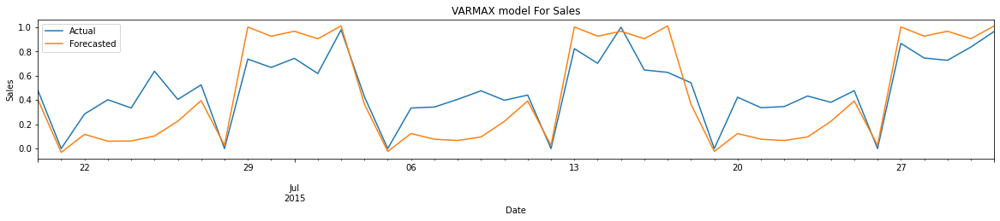

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_13,VAR,0.11,inf,0.08,inf
0,Store_13,VARMAX,0.22,inf,0.24,inf


In [ ]:
#Plotting time series

forecasted_timeseries_visualization(test['Sales'],test['VarmaxForecastedSales'],'Sales','VARMAX')
#Printing results

d=summary(test['Sales'], test['VarmaxForecastedSales'],
       test['Customers'], test['VarmaxForecastedCustomers'],'Store_13','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head()

 


## Building Model for Store 46

In [ ]:
Store_46=data[(data.Store==46)]
Store_46.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,
2013-01-01,46,2,0.01,0.1,0,0,2,1,1,0,1
2013-01-02,46,3,4016.01,582.1,1,0,1,1,1,0,1
2013-01-03,46,4,4177.01,553.1,1,0,1,1,1,0,1
2013-01-04,46,5,4125.01,569.1,1,0,1,1,1,0,1
2013-01-05,46,6,4848.01,651.1,1,0,1,0,1,0,1


In [ ]:
# Some columns will have single value , dropping then. This step not done earlier as columns would had nan also
# Promo 2 Interval is zero , thus promo 2 is not applicable
for col in Store_46.columns:
    if len(Store_46[col].unique()) == 1:
        Store_46.drop(col,inplace=True,axis=1)

In [ ]:
Store_46.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable
Date,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,1
2013-01-02,3,4016.01,582.1,1,0,1,1,1,1
2013-01-03,4,4177.01,553.1,1,0,1,1,1,1
2013-01-04,5,4125.01,569.1,1,0,1,1,1,1
2013-01-05,6,4848.01,651.1,1,0,1,0,1,1


In [ ]:
Store_46.sort_index(inplace=True)

In [ ]:
Store_46.shape

(758, 9)

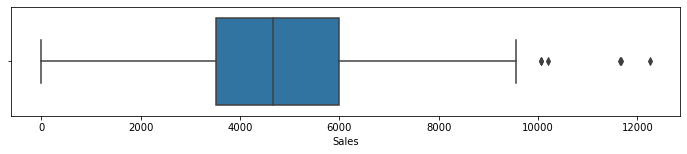

In [ ]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_46['Sales'],whis=1.5)

- Few outliers at max side
- However , it feels that these are at begining of the year
- Imputing these values to 99th percentile

In [ ]:
Store_46['Sales']=Store_46[['Sales']].clip(upper=Store_46.quantile(0.99),axis=1)

In [ ]:
Store_46['Customers']=Store_46[['Customers']].clip(upper=Store_46.quantile(0.99),axis=1)

In [ ]:
Store_46.shape

(758, 9)

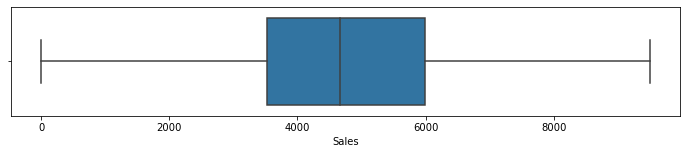

In [ ]:
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_46['Sales'],whis=2)

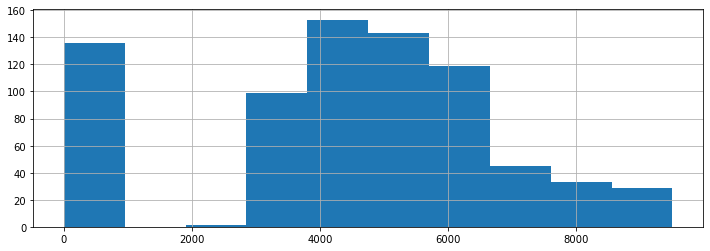

In [ ]:
fig = Store_46['Sales'].hist(figsize = (12,4))

- Near Zero sales mean that store is closed

In [ ]:
# Data description
Store_46.describe()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable
count,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000,758.000000
mean,4.001319,4380.113430,541.584011,0.820580,0.377309,1.051451,0.163588,20.496042,0.364116
std,1.999009,2474.345941,274.882593,0.383957,0.485033,0.283853,0.370146,13.319838,0.481499
min,1.000000,0.010000,0.100000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000
25%,2.000000,3525.260000,512.100000,1.000000,0.000000,1.000000,0.000000,10.000000,0.000000
50%,4.000000,4657.510000,620.600000,1.000000,0.000000,1.000000,0.000000,19.000000,0.000000
75%,6.000000,5996.010000,711.100000,1.000000,1.000000,1.000000,0.000000,28.000000,1.000000
max,7.000000,9498.560000,988.960000,1.000000,1.000000,4.000000,1.000000,52.000000,1.000000


## Time series Decomposition

### Additive seasonal decomposition

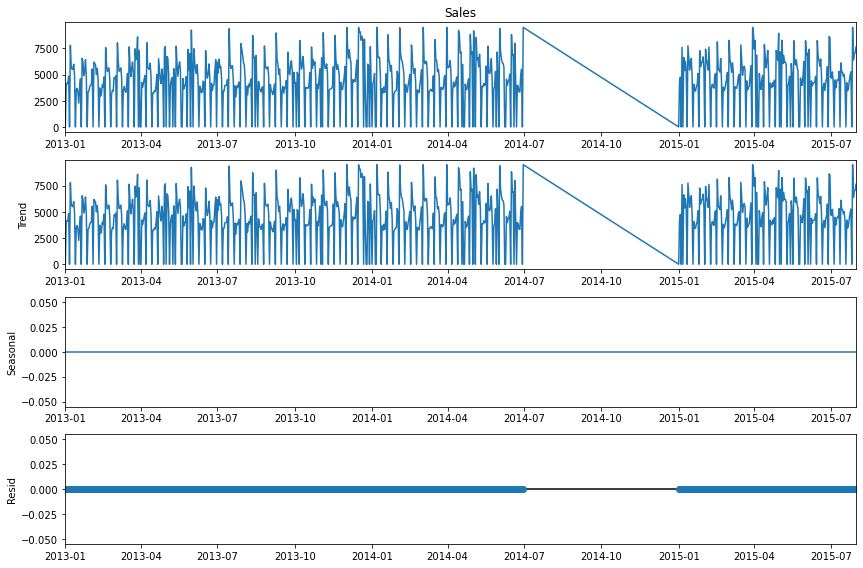

In [ ]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(Store_46.Sales, model='additive',extrapolate_trend='freq', period=1) # additive seasonal index
fig = decomposition.plot()
plt.show()

***IT seems that some data is missing in between , we earlier assumed that store must have started late , that was incorrect assumption***
***In this case , we will not impute data with Average but will try to train on data which is available***

In [ ]:
pd.date_range(start = '2013-01-01', end = '2015-07-31' ).difference(Store_46.index)

DatetimeIndex(['2014-07-01', '2014-07-02', '2014-07-03', '2014-07-04',
               '2014-07-05', '2014-07-06', '2014-07-07', '2014-07-08',
               '2014-07-09', '2014-07-10',
               ...
               '2014-12-22', '2014-12-23', '2014-12-24', '2014-12-25',
               '2014-12-26', '2014-12-27', '2014-12-28', '2014-12-29',
               '2014-12-30', '2014-12-31'],
              dtype='datetime64[ns]', length=184, freq=None)

In [ ]:
New_df=Store_46['2013-07-01':'2013-12-31']

In [ ]:
New_df.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable
Date,,,,,,,,,
2013-07-01,1,6167.01,717.1,1,1,1,0,27,1
2013-07-02,2,5146.01,625.1,1,1,1,0,27,1
2013-07-03,3,6463.01,683.1,1,1,1,0,27,1
2013-07-04,4,5652.01,684.1,1,1,1,0,27,1
2013-07-05,5,5767.01,713.1,1,1,1,0,27,1


In [ ]:
from pandas.tseries.offsets import DateOffset
from dateutil.relativedelta import relativedelta
from datetime import timedelta

In [ ]:
New_df.reset_index(inplace=True)
Store_46.reset_index(inplace=True)

In [ ]:
New_df['Date']=New_df['Date']+pd.DateOffset(days=365)

In [ ]:
New_df.head()

,Date,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable
0,2014-07-01,1,6167.01,717.1,1,1,1,0,27,1
1,2014-07-02,2,5146.01,625.1,1,1,1,0,27,1
2,2014-07-03,3,6463.01,683.1,1,1,1,0,27,1
3,2014-07-04,4,5652.01,684.1,1,1,1,0,27,1
4,2014-07-05,5,5767.01,713.1,1,1,1,0,27,1


In [ ]:
Store_46=Store_46.append(New_df,ignore_index = True)

In [ ]:
Store_46=Store_46.set_index('Date')

In [ ]:
Store_46=Store_46.sort_values(by='Date', ascending=True)

In [ ]:
pd.date_range(start = '2013-01-01', end = '2015-07-31' ).difference(Store_46.index)

DatetimeIndex([], dtype='datetime64[ns]', freq=None)

In [ ]:
Store_46.shape

(942, 9)

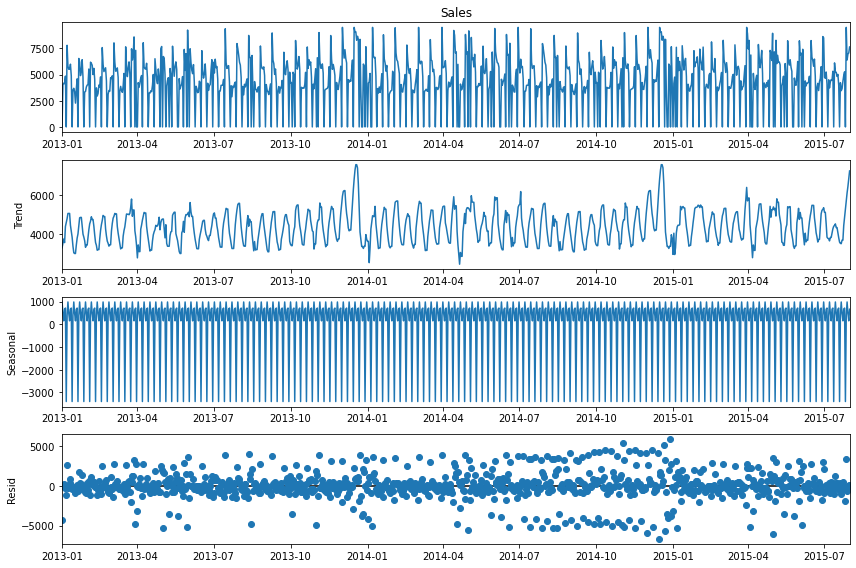

In [ ]:
decomposition = sm.tsa.seasonal_decompose(Store_46.Sales, model='additive',extrapolate_trend='freq', period=7) # multiplicative seasonal index
fig = decomposition.plot()
plt.show()

### Multiplicative seasonal decomposition

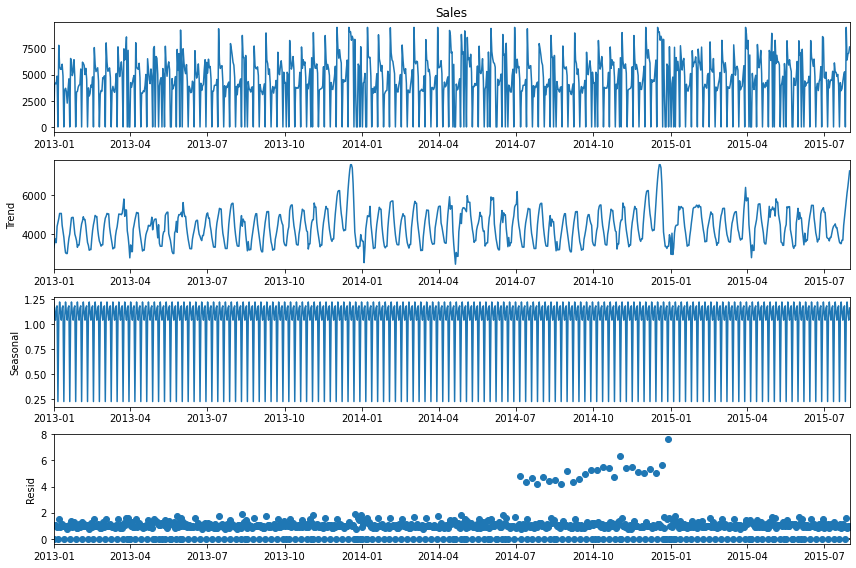

In [ ]:
decomposition = sm.tsa.seasonal_decompose(Store_46.Sales, model='multiplicative',extrapolate_trend='freq', period=7) # multiplicative seasonal index
fig = decomposition.plot()
plt.show()

***Again There is clear seasonality in data + trend + variance***

### Testing For Stationarity

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
test_result=adfuller(Store_46['Sales'])

In [ ]:
#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [ ]:
adfuller_test(Store_46['Sales'])

ADF Test Statistic : -6.173225552342362
p-value : 6.726314016192283e-08
#Lags Used : 20
Number of Observations Used : 921
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


**Data is stationary**

## Handle seasonality

In [ ]:
Store_46['S_Sales_1']=Store_46['Sales']-Store_46['Sales'].shift(7)
Store_46.head(14)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable,S_Sales_1
Date,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,1,NaN
2013-01-02,3,4016.01,582.1,1,0,1,1,1,1,NaN
2013-01-03,4,4177.01,553.1,1,0,1,1,1,1,NaN
2013-01-04,5,4125.01,569.1,1,0,1,1,1,1,NaN
2013-01-05,6,4848.01,651.1,1,0,1,0,1,1,NaN
2013-01-06,7,0.01,0.1,0,0,2,0,1,1,NaN
2013-01-07,1,7788.01,825.1,1,1,1,0,2,1,NaN
2013-01-08,2,5793.01,666.1,1,1,1,0,2,1,5793.0
2013-01-09,3,5501.01,631.1,1,1,1,0,2,1,1485.0


In [ ]:
## Again test dickey fuller test
adfuller_test(Store_46['S_Sales_1'].dropna())

ADF Test Statistic : -12.250104155829987
p-value : 9.583567258543542e-23
#Lags Used : 21
Number of Observations Used : 913
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<AxesSubplot:xlabel='Date'>

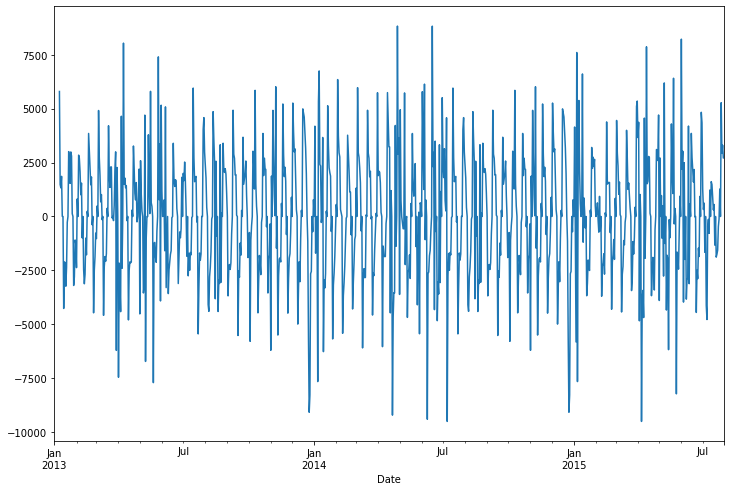

In [ ]:
Store_46['S_Sales_1'].plot()

In [ ]:
Store_46['S_Customers_1']=Store_46['Customers']-Store_46['Customers'].shift(7)

In [ ]:
## Again test dickey fuller test
adfuller_test(Store_46['S_Customers_1'].dropna())

ADF Test Statistic : -12.197232004858083
p-value : 1.2465085395738336e-22
#Lags Used : 21
Number of Observations Used : 913
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


## ACF & PACF

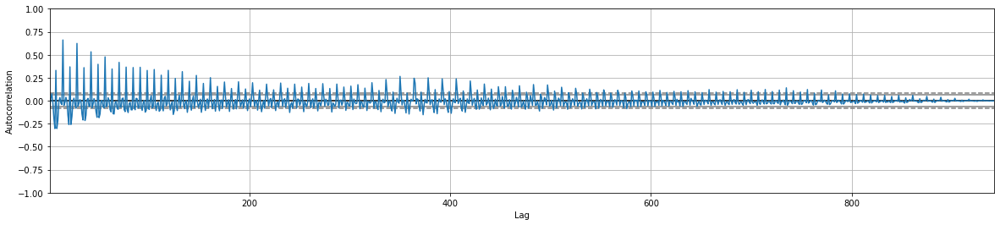

In [ ]:
from pandas.plotting import autocorrelation_plot
fig = plt.subplots(figsize=(20, 4))
ax=autocorrelation_plot(Store_46['Sales'])
plt.show()

In [ ]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

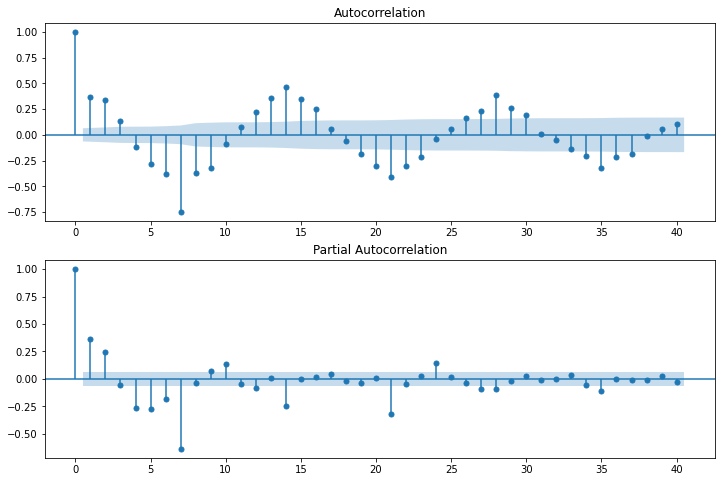

In [ ]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(Store_46['S_Sales_1'].iloc[7:],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(Store_46['S_Sales_1'].iloc[13:],lags=40,ax=ax2)

## ARIMA ,SARIMA & SARIMAX

# Build and evaluate time series forecast

In [ ]:
# Split Data set into target & Exonous variables
Store_46_Target=Store_46[['Sales']].copy()

In [ ]:
Store_46_Target.head(2)

,Sales
Date,
2013-01-01,0.01
2013-01-02,4016.01


In [ ]:
Store_46.shape

(942, 11)

## Split time series data into training and test set

In [ ]:
train_len = 900
train = Store_46_Target[0:train_len] # first 900 day as training set
test = Store_46_Target[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

In [ ]:

model=ARIMA(train['Sales'],order=(1,0,7))
model_fit=model.fit()

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


In [ ]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(1, 7)   Log Likelihood               -8206.656
Method:                       css-mle   S.D. of innovations           2205.744
Date:                Wed, 18 May 2022   AIC                          16433.313
Time:                        22:48:11   BIC                          16481.337
Sample:                    01-01-2013   HQIC                         16451.658
                         - 06-19-2015                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        4390.3435     41.805    105.020      0.000    4308.407    4472.280
ar.L1.Sales    -0.1772      0.162     -1.096      0.273      -0.494       0.140
ma.L1.Sales     0.1263      0.160      0.792      0.429      -0.186       0.439
ma.L2.Sales     0.0482      0.032      1.526      0.127      -0.014       0.110
ma.L3.Sales     0.0321      0.034      0.935      0.350      -0.035       0.099
ma.L4.Sales    -0.0631      0.029     -2.208      0.027      -0.119      -0.007
ma.L5.Sales    -0.2375      0.034     -6.930      0.000      -0.305      -0.170
ma.L6.Sales    -0.3654      0.038     -9.675      0.000      -0.439      -0.291
ma.L7.Sales     0.1258      0.060      2.094      0.036       0.008       0.244
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -5.6435           +0.0000j            5.6435            0.5000
MA.1           -1.1614           -0.0000j            1.1614           -0.5000
MA.2           -0.6936           -0.9255j            1.1565           -0.3524
MA.3           -0.6936           +0.9255j            1.1565            0.3524
MA.4            0.3976           -1.0423j            1.1156           -0.1920
MA.5            0.3976           +1.0423j            1.1156            0.1920
MA.6            1.1835           -0.0000j            1.1835           -0.0000
MA.7            3.4734           -0.0000j            3.4734           -0.0000
-----------------------------------------------------------------------------
"""

In [ ]:
y_hat_arima = Store_46_Target.copy()
y_hat_arima['arima_forecast'] = model_fit.predict(Store_46_Target.index.min(), Store_46_Target.index.max())

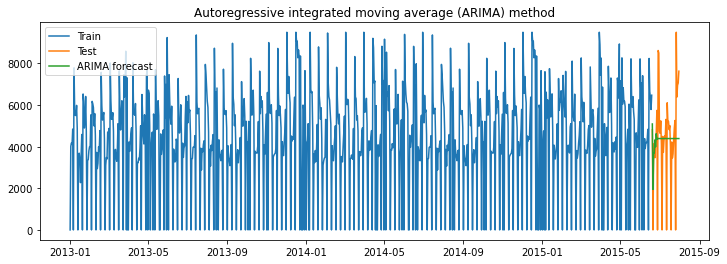

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_arima['arima_forecast'][test.index.min():], label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_arima['arima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_arima['arima_forecast'][test.index.min():])/test['Sales'])*100,2)

results = pd.DataFrame({'Store':['Store_46'],'Method':['Autoregressive integrated moving average (ARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_46,Autoregressive integrated moving average (ARIM...,2194.08,5691959.27


## Seasonal auto regressive integrated moving average (SARIMA)

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 7, 7)) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ar.S.L7     9.968294e-01
ma.S.L7    -1.060800e+00
ma.S.L14    4.700069e-01
ma.S.L21   -3.432412e-01
ma.S.L28    3.442862e-01
ma.S.L35   -3.178287e-01
ma.S.L42    2.250948e-01
ma.S.L49   -9.422617e-02
sigma2      2.961061e+06
dtype: float64


In [ ]:
y_hat_sarima = Store_46_Target.copy()
y_hat_sarima['sarima_forecast'] = model_fit.predict(Store_46_Target.index.min(), Store_46_Target.index.max())

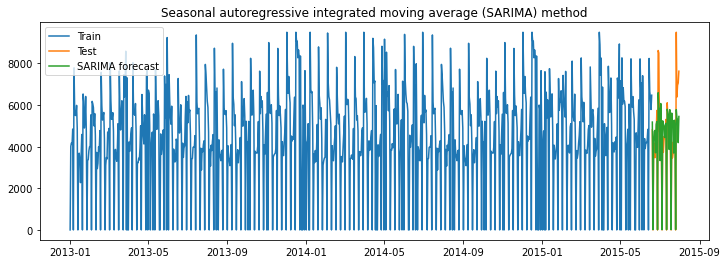

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('Seasonal autoregressive integrated moving average (SARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarima['sarima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarima['sarima_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_46'],'Method':['Seasonal autoregressive integrated moving average (SARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_46,Autoregressive integrated moving average (ARIM...,2194.08,5691959.27
0,Store_46,Seasonal autoregressive integrated moving aver...,1226.85,20111.67


## VAR & VARMAX

In [ ]:
# Copy data set
df=Store_46.copy()

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,Promo2_Applicable,S_Sales_1,S_Customers_1
Date,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,1,NaN,NaN
2013-01-02,3,4016.01,582.1,1,0,1,1,1,1,NaN,NaN
2013-01-03,4,4177.01,553.1,1,0,1,1,1,1,NaN,NaN


In [ ]:
# Drop Unneseccary Columns
df.drop(['WeekOfYear','S_Sales_1','S_Customers_1'],inplace=True,axis=1)

***Create dummy variables***

In [ ]:
dummies=pd.get_dummies(df['DayOfWeek'],drop_first=True,prefix='DayOfWeek')
df=pd.concat([df,dummies],axis=1)

In [ ]:
dummies=pd.get_dummies(df['StateHoliday'],drop_first=True,prefix='StateHoliday')
df=pd.concat([df,dummies],axis=1)

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,1,0,0,0,0,0,1,0,0
2013-01-02,3,4016.01,582.1,1,0,1,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,4,4177.01,553.1,1,0,1,1,1,0,0,1,0,0,0,0,0,0


In [ ]:
df.drop(['DayOfWeek','StateHoliday'],axis=1,inplace=True)
df.head()

,Sales,Customers,Open,Promo,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,1,0,0,0,0,0,1,0,0
2013-01-02,4016.01,582.1,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,4177.01,553.1,1,0,1,1,0,0,1,0,0,0,0,0,0
2013-01-04,4125.01,569.1,1,0,1,1,0,0,0,1,0,0,0,0,0
2013-01-05,4848.01,651.1,1,0,0,1,0,0,0,0,1,0,0,0,0


In [ ]:
# Casulaity Check
from statsmodels.tsa.stattools import grangercausalitytests
causality_sales=grangercausalitytests(df[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=509.5938, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=511.2237, p=0.0000  , df=1
likelihood ratio test: chi2=408.3075, p=0.0000  , df=1
parameter F test:         F=509.5938, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=280.1222, p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=563.2403, p=0.0000  , df=2
likelihood ratio test: chi2=441.3285, p=0.0000  , df=2
parameter F test:         F=280.1222, p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=186.4998, p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=563.7016, p=0.0000  , df=3
likelihood ratio test: chi2=441.5219, p=0.0000  , df=3
parameter F test:         F=186.4998, p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=142.5990, p=0.0000  

***The Test Indicate casuality between Sales & Customers***

***We have earlier done ADF test & ACF/PACF Plots, sso we won't repeat them here***

In [ ]:
df.shape

(942, 15)

### Train-Test Split

In [ ]:
train_len = 900
train = df[0:train_len] # first 900 day as training set
test = df[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
train.head(3)

,Sales,Customers,Open,Promo,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,1,0,0,0,0,0,1,0,0
2013-01-02,4016.01,582.1,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,4177.01,553.1,1,0,1,1,0,0,1,0,0,0,0,0,0


### Standardising numerical values in test-train datasets using minmax

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Fit transform on train data

scaler = MinMaxScaler()
train[['Sales','Customers']]=scaler.fit_transform(train[['Sales','Customers']])
train.head()

,Sales,Customers,Open,Promo,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2013-01-01,0.000000,0.000000,0,0,1,1,1,0,0,0,0,0,1,0,0
2013-01-02,0.422801,0.588557,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,0.439751,0.559230,1,0,1,1,0,0,1,0,0,0,0,0,0
2013-01-04,0.434277,0.575410,1,0,1,1,0,0,0,1,0,0,0,0,0
2013-01-05,0.510394,0.658334,1,0,0,1,0,0,0,0,1,0,0,0,0


In [ ]:
test[['Sales','Customers']]=scaler.transform(test[['Sales','Customers']])
test.head()

,Sales,Customers,Open,Promo,SchoolHoliday,Promo2_Applicable,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,
2015-06-20,0.506604,0.672492,1,0,0,0,0,0,0,0,1,0,0,0,0
2015-06-21,0.000000,0.000000,0,0,0,0,0,0,0,0,0,1,0,0,0
2015-06-22,0.399219,0.533948,1,0,0,0,0,0,0,0,0,0,0,0,0
2015-06-23,0.437962,0.542038,1,0,0,0,1,0,0,0,0,0,0,0,0
2015-06-24,0.365214,0.516757,1,0,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
train.columns

Index(['Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday',
       'Promo2_Applicable', 'DayOfWeek_2', 'DayOfWeek_3', 'DayOfWeek_4',
       'DayOfWeek_5', 'DayOfWeek_6', 'DayOfWeek_7', 'StateHoliday_2',
       'StateHoliday_3', 'StateHoliday_4'],
      dtype='object')

In [ ]:
exog = train[[ 'Open', 'Promo', 'SchoolHoliday',
       'Promo2_Applicable', 'DayOfWeek_2', 'DayOfWeek_3', 'DayOfWeek_4',
       'DayOfWeek_5', 'DayOfWeek_6', 'DayOfWeek_7', 'StateHoliday_2',
       'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=30)
print(res.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -12.04      -11.88   5.912e-06      -11.98
1       -12.12      -11.95   5.433e-06      -12.06
2       -12.13      -11.94   5.378e-06      -12.06
3       -12.18      -11.96   5.123e-06      -12.10
4       -12.19      -11.95   5.100e-06      -12.09
5       -12.18      -11.92   5.136e-06      -12.08
6       -12.18      -11.90   5.111e-06      -12.08
7       -12.20      -11.89   5.055e-06      -12.08
8       -12.24      -11.91   4.838e-06      -12.11
9       -12.30      -11.95   4.532e-06      -12.17
10      -12.34      -11.97   4.371e-06      -12.20
11      -12.37     -11.98*   4.242e-06      -12.22
12      -12.37      -11.96   4.231e-06      -12.21
13      -12.37      -11.94   4.225e-06      -12.21
14      -12.40      -11.94   4.134e-06     -12.22*
15      -12.39      -11.91   4.162e-06      -12.21
16      -12.39      -11.88   4.

***AIC is Lowest at lag 30***

In [ ]:
#Fitting the model with lag 30

var_model_final = var_model.fit(30)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 18, May, 2022
Time:                     22:48:28
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.6661
Nobs:                     870.000    HQIC:                  -12.1669
Log likelihood:           3106.68    FPE:                3.81528e-06
AIC:                     -12.4773    Det(Omega_mle):     3.24056e-06
--------------------------------------------------------------------
Results for equation Sales
                       coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------
const                    -0.531347              NAN              NAN             NAN
Open                      0.332070              NAN              NAN             NAN
Promo                     0.286137         0

### Cointegration test

In [ ]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.vecm import select_coint_rank

def cointegration_test(df, lag): 
    alpha=0.05
    out = coint_johansen(df,-1,lag)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

In [ ]:
train['Sales']=train['Sales'].apply(lambda x:round(x))
train['Customers']=train['Customers'].apply(lambda x:round(x))

In [ ]:
cointegration_test(train[['Sales','Customers']],7)
rank_result=select_coint_rank(train[['Sales','Customers']],-1,1)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  236.33    > 12.3212   =>   True
Customers ::  1.38      > 4.1296    =>   False


In [ ]:
print(rank_result.rank)

2


We have the rank of Johassen test as 2 which means that the time series are stationary but do not seem to be co-integratied

In [ ]:
# Getting lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train[['Sales','Customers']].values[-lag_order:]
forecast_input

30


array([[1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [0, 0],
       [0, 1],
       [0, 1],
       [0, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [0, 1],
       [0, 0],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1]], dtype=int64)

In [ ]:
exog_test = test[['Open', 'Promo', 'SchoolHoliday',
       'Promo2_Applicable', 'DayOfWeek_2', 'DayOfWeek_3', 'DayOfWeek_4',
       'DayOfWeek_5', 'DayOfWeek_6', 'DayOfWeek_7', 'StateHoliday_2',
       'StateHoliday_3', 'StateHoliday_4']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=test.index, columns=['Sales','Customers'])
var_forecast

,Sales,Customers
Date,,
2015-06-20,0.066868,0.558247
2015-06-21,-0.113260,0.017440
2015-06-22,0.250289,0.563817
2015-06-23,0.032163,0.250635
2015-06-24,-0.132117,0.178085
2015-06-25,-0.074196,0.226329
2015-06-26,0.552694,0.790115
2015-06-27,1.140651,1.207656
2015-06-28,0.817261,0.803104


In [ ]:
#Adding forecasted values
test['VarForecastedSales']=var_forecast.Sales
test['VarForecastedCustomers']=var_forecast.Customers

In [ ]:
def forecasted_timeseries_visualization(series,forecasted_series,c,model):
    fig = plt.figure(figsize=(20, 3))
    series.plot(label='Actual')
    forecasted_series.plot(label='Forecasted')
    plt.xlabel('Date')
    plt.ylabel(c)
    plt.legend(loc='best')
    plt.title('{} model For {}'.format(model,c))
    plt.show()

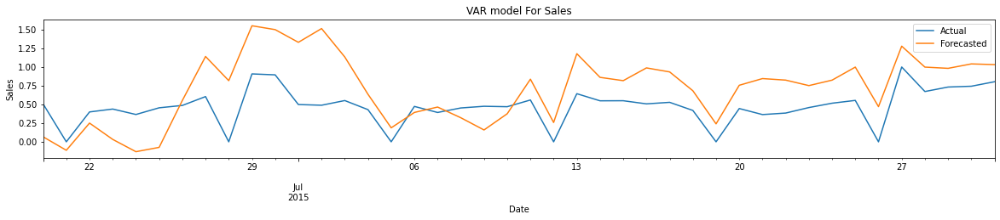

In [ ]:
forecasted_timeseries_visualization(test['Sales'],test['VarForecastedSales'],'Sales','VAR')


In [ ]:
from sklearn.metrics import mean_squared_error
summary_df=pd.DataFrame(columns=['Store','Model','RMSE_SALES','MAPE_SALES','RMSE_CUSTOMERS','MAPE_CUSTOMERS'])

def summary(s,fs,c,fc,store,model):
    rmse_sales = np.sqrt(mean_squared_error(s, fs)).round(2)
    mape_sales = np.round(np.mean(np.abs(s-fs)/s)*100,2)
    rmse_customers = np.sqrt(mean_squared_error(c, fc)).round(2)
    mape_customers = np.round(np.mean(np.abs(c-fc)/c)*100,2)
    temp=pd.DataFrame({'Store':[store],'Model':[model], 'RMSE_SALES': [rmse_sales],'MAPE_SALES': [mape_sales] , 
                            'RMSE_CUSTOMERS': [rmse_customers],'MAPE_CUSTOMERS': [mape_customers]})
    return temp

In [ ]:
d=summary(test['Sales'], test['VarForecastedSales'],
       test['Customers'], test['VarForecastedCustomers'],'Store_46','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head()

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_46,VAR,0.43,inf,0.41,inf


In [ ]:
#modelling

exog = train[['Open', 'SchoolHoliday',
       'Promo2_Applicable', 'DayOfWeek_2', 'DayOfWeek_3', 'DayOfWeek_4',
       'DayOfWeek_5', 'DayOfWeek_6', 'DayOfWeek_7', 'StateHoliday_2',
       'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                  41.251
                              + intercept   AIC                             31.499
Date:                    Wed, 18 May 2022   BIC                            305.235
Time:                            22:50:01   HQIC                           136.068
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             1.36, 9.63   Jarque-Bera (JB):       30.32, 8709.36
Prob(Q):                        0.24, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.88, 0.39   Skew:                     -0.25, -3.50
P

In [ ]:
#forecasting on test data

exog_test = test[['Open', 'SchoolHoliday',
       'Promo2_Applicable', 'DayOfWeek_2', 'DayOfWeek_3', 'DayOfWeek_4',
       'DayOfWeek_5', 'DayOfWeek_6', 'DayOfWeek_7', 'StateHoliday_2',
       'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog_test= test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=test.index.min(),end=test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.758366,1.020712
2015-06-21,-0.046543,0.002624
2015-06-22,0.357580,0.975489
2015-06-23,0.207645,0.887319
2015-06-24,0.204100,0.872373


In [ ]:
#Adding forecasted values

test['VarmaxForecastedSales']=varmax_forecast.Sales
test['VarmaxForecastedCustomers']=varmax_forecast.Customers

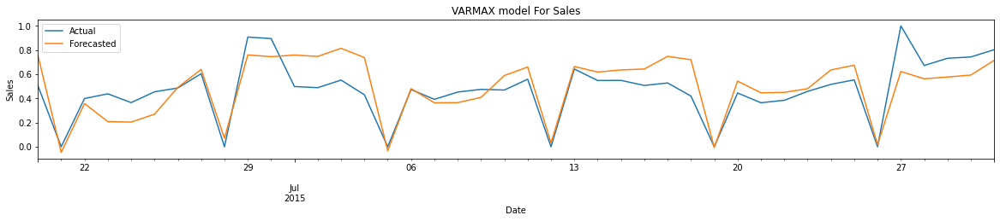

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_46,VAR,0.43,inf,0.41,inf
0,Store_46,VARMAX,0.15,inf,0.31,inf


In [ ]:
#Plotting time series

forecasted_timeseries_visualization(test['Sales'],test['VarmaxForecastedSales'],'Sales','VARMAX')
#Printing results

d=summary(test['Sales'], test['VarmaxForecastedSales'],
       test['Customers'], test['VarmaxForecastedCustomers'],'Store_46','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head()

 


In [ ]:
data.head(9)

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,
2013-01-01,46,2,0.01,0.1,0,0,2,1,1,0,1
2013-01-01,25,2,0.01,0.1,0,0,2,1,1,0,0
2013-01-01,8,2,0.01,0.1,0,0,2,1,1,1,0
2013-01-01,13,2,0.01,0.1,0,0,2,1,1,0,0
2013-01-01,9,2,0.01,0.1,0,0,2,1,1,0,0
2013-01-01,3,2,0.01,0.1,0,0,2,1,1,0,1
2013-01-01,1,2,0.01,0.1,0,0,2,1,1,0,0
2013-01-01,31,2,0.01,0.1,0,0,2,1,1,0,0
2013-01-01,29,2,0.01,0.1,0,0,2,1,1,0,0


## Building Model for Store 25

In [ ]:
Store_25=data[(data.Store==25)]
Store_25.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,
2013-01-01,25,2,0.01,0.1,0,0,2,1,1,0,0
2013-01-02,25,3,11944.01,1698.1,1,0,1,1,1,0,0
2013-01-03,25,4,10409.01,1587.1,1,0,1,1,1,0,0
2013-01-04,25,5,9729.01,1520.1,1,0,1,1,1,0,0
2013-01-05,25,6,8987.01,1381.1,1,0,1,0,1,0,0


In [ ]:
# Some columns will have single value , dropping then. This step not done earlier as columns would had nan also
# Promo 2 Interval is zero , thus promo 2 is not applicable
for col in Store_25.columns:
    if len(Store_25[col].unique()) == 1:
        Store_25.drop(col,inplace=True,axis=1)

In [ ]:
Store_25.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear
Date,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1
2013-01-02,3,11944.01,1698.1,1,0,1,1,1
2013-01-03,4,10409.01,1587.1,1,0,1,1,1
2013-01-04,5,9729.01,1520.1,1,0,1,1,1
2013-01-05,6,8987.01,1381.1,1,0,1,0,1


In [ ]:
Store_25.shape

(942, 8)

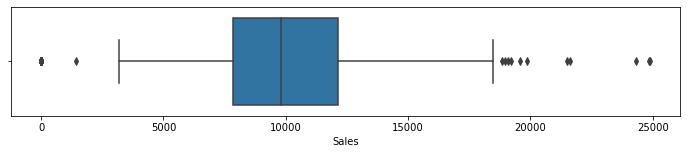

In [ ]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_25['Sales'],whis=1.5)

- Few outliers at max side
- However , it feels that these are at begining of the year
- Imputing these values to 99th percentile

In [ ]:
Store_25['Sales']=Store_25[['Sales']].clip(upper=Store_25.quantile(0.99),axis=1)

In [ ]:
Store_25['Customers']=Store_25[['Customers']].clip(upper=Store_25.quantile(0.99),axis=1)

In [ ]:
Store_25.shape

(942, 8)

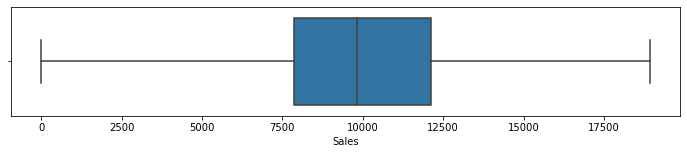

In [ ]:
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_25['Sales'],whis=2)

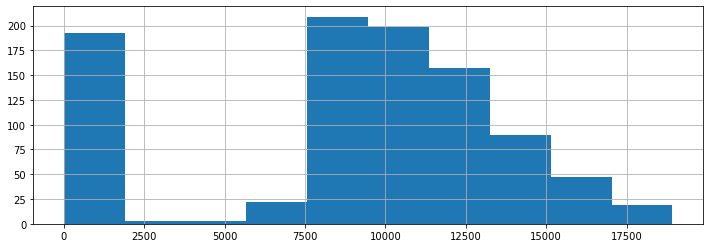

In [ ]:
fig = Store_25['Sales'].hist(figsize = (12,4))

- Near Zero sales mean that store is closed

In [ ]:
# Data description
Store_25.describe()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear
count,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000
mean,3.997877,8866.200021,1248.879193,0.798301,0.382166,1.045648,0.180467,24.098726
std,1.998404,5088.452377,683.718925,0.401481,0.486175,0.286125,0.384780,14.547508
min,1.000000,0.010000,0.100000,0.000000,0.000000,1.000000,0.000000,1.000000
25%,2.000000,7858.760000,1182.100000,1.000000,0.000000,1.000000,0.000000,12.000000
50%,4.000000,9806.010000,1456.600000,1.000000,0.000000,1.000000,0.000000,23.000000
75%,6.000000,12125.260000,1692.100000,1.000000,1.000000,1.000000,0.000000,36.000000
max,7.000000,18924.810000,2299.100000,1.000000,1.000000,4.000000,1.000000,52.000000


## Time series Decomposition

### Additive seasonal decomposition

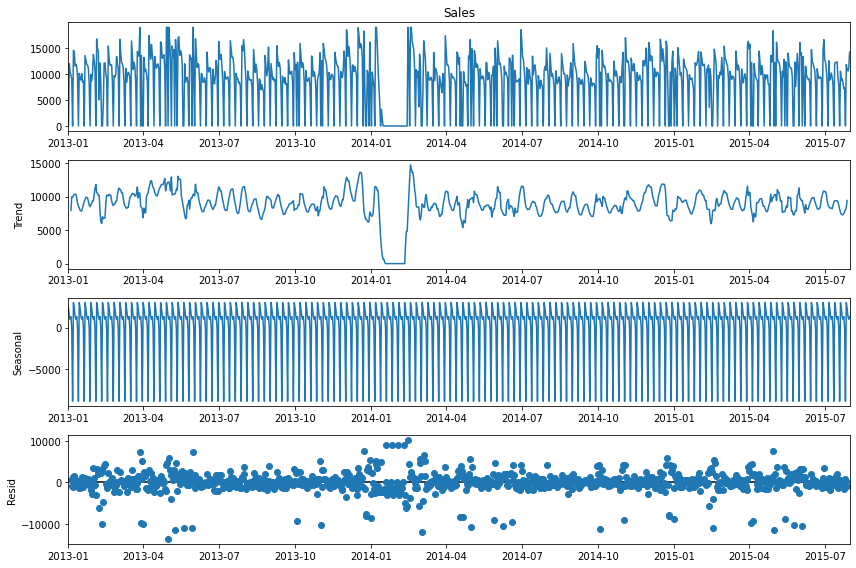

In [ ]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(Store_25.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

***There is clear seasonality in data , & It shows trend & Variation***

### Multiplicative seasonal decomposition

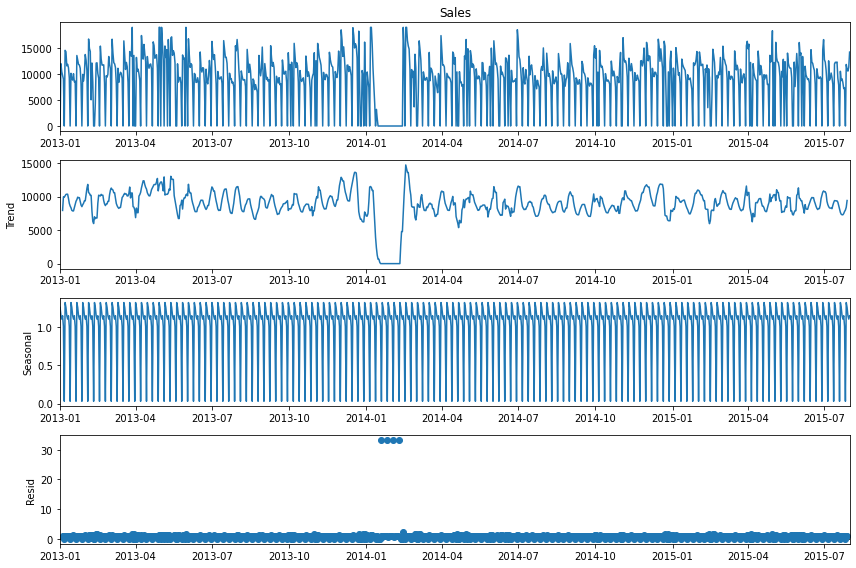

In [ ]:
decomposition = sm.tsa.seasonal_decompose(Store_25.Sales, model='multiplicative') # multiplicative seasonal index
fig = decomposition.plot()
plt.show()

***Again There is clear seasonality in data + trend + variance***

### Testing For Stationarity

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
test_result=adfuller(Store_25['Sales'])

In [ ]:
#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [ ]:
adfuller_test(Store_25['Sales'])

ADF Test Statistic : -4.530868956233665
p-value : 0.0001728700932167145
#Lags Used : 21
Number of Observations Used : 920
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


**Data is stationary**

## Handle seasonality

In [ ]:
Store_25['S_Sales_1']=Store_25['Sales']-Store_25['Sales'].shift(7)
Store_25.head(14)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,S_Sales_1
Date,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,NaN
2013-01-02,3,11944.01,1698.1,1,0,1,1,1,NaN
2013-01-03,4,10409.01,1587.1,1,0,1,1,1,NaN
2013-01-04,5,9729.01,1520.1,1,0,1,1,1,NaN
2013-01-05,6,8987.01,1381.1,1,0,1,0,1,NaN
2013-01-06,7,0.01,0.1,0,0,1,0,1,NaN
2013-01-07,1,14513.01,2017.1,1,1,1,0,2,NaN
2013-01-08,2,14243.01,1929.1,1,1,1,0,2,14243.0
2013-01-09,3,11539.01,1638.1,1,1,1,0,2,-405.0


In [ ]:
## Again test dickey fuller test
adfuller_test(Store_25['S_Sales_1'].dropna())

ADF Test Statistic : -8.857288423579801
p-value : 1.5158246407886093e-14
#Lags Used : 21
Number of Observations Used : 913
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<AxesSubplot:xlabel='Date'>

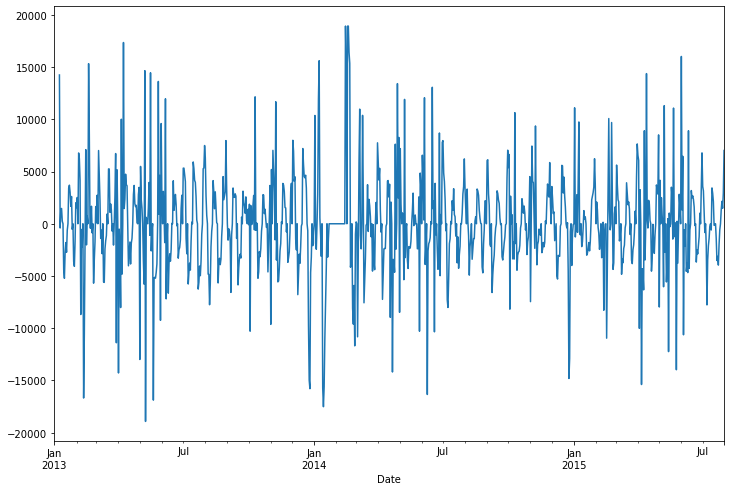

In [ ]:
Store_25['S_Sales_1'].plot()

In [ ]:
Store_25['S_Customers_1']=Store_25['Customers']-Store_25['Customers'].shift(7)

In [ ]:
## Again test dickey fuller test
adfuller_test(Store_25['S_Customers_1'].dropna())

ADF Test Statistic : -8.904911549696681
p-value : 1.1447690491786856e-14
#Lags Used : 20
Number of Observations Used : 914
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


## ACF & PACF

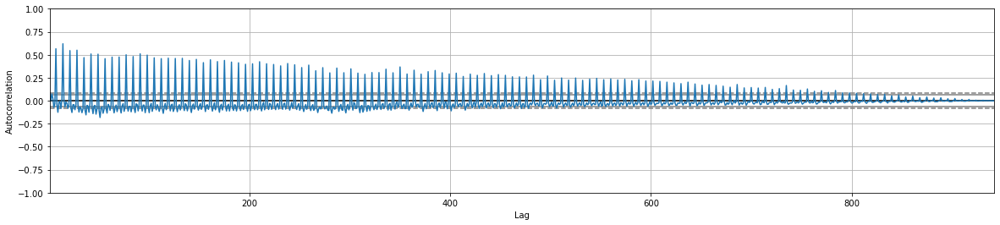

In [ ]:
from pandas.plotting import autocorrelation_plot
fig = plt.subplots(figsize=(20, 4))
ax=autocorrelation_plot(Store_25['Sales'])
plt.show()

In [ ]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

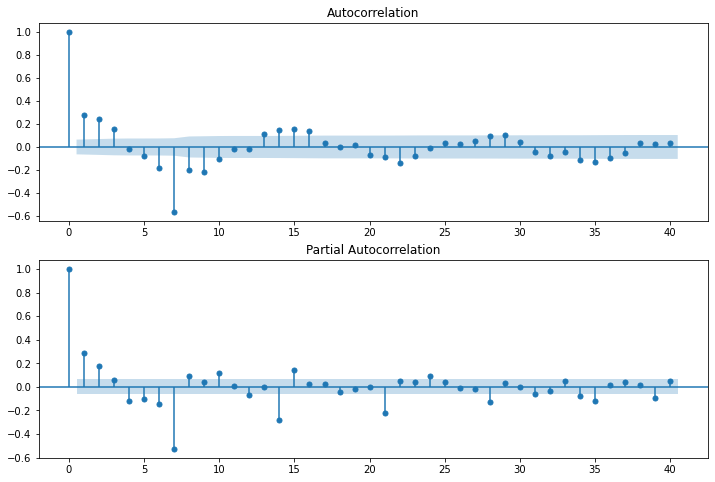

In [ ]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(Store_25['S_Sales_1'].iloc[7:],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(Store_25['S_Sales_1'].iloc[13:],lags=40,ax=ax2)

# Build and evaluate time series forecast

## ARIMA ,SARIMA & SARIMAX

In [ ]:
# Split Data set into target & Exonous variables
Store_25_Target=Store_25[['Sales']].copy()
Store_25_Exon=Store_25[['Promo']]

In [ ]:
Store_25_Target.head(2)

,Sales
Date,
2013-01-01,0.01
2013-01-02,11944.01


In [ ]:
Store_25_Exon.head(2)

,Promo
Date,
2013-01-01,0
2013-01-02,0


## Split time series data into training and test set

In [ ]:
train_len = 900
train = Store_25_Target[0:train_len] # first 900 day as training set
test = Store_25_Target[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

In [ ]:

model=ARIMA(train['Sales'],order=(0,0,7))
model_fit=model.fit()

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


In [ ]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(0, 7)   Log Likelihood               -8851.656
Method:                       css-mle   S.D. of innovations           4516.784
Date:                Wed, 18 May 2022   AIC                          17721.312
Time:                        22:50:06   BIC                          17764.534
Sample:                    01-01-2013   HQIC                         17737.823
                         - 06-19-2015                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        8864.4078    253.599     34.954      0.000    8367.363    9361.453
ma.L1.Sales     0.1448      0.031      4.619      0.000       0.083       0.206
ma.L2.Sales     0.1087      0.034      3.154      0.002       0.041       0.176
ma.L3.Sales     0.0952      0.035      2.707      0.007       0.026       0.164
ma.L4.Sales     0.0199      0.038      0.527      0.598      -0.054       0.094
ma.L5.Sales    -0.0050      0.038     -0.129      0.897      -0.080       0.070
ma.L6.Sales    -0.0479      0.046     -1.048      0.295      -0.137       0.042
ma.L7.Sales     0.3719      0.029     12.827      0.000       0.315       0.429
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1           -1.1136           -0.0000j            1.1136           -0.5000
MA.2           -0.7064           -0.8869j            1.1339           -0.3570
MA.3           -0.7064           +0.8869j            1.1339            0.3570
MA.4            0.2530           -1.0983j            1.1271           -0.2140
MA.5            0.2530           +1.0983j            1.1271            0.2140
MA.6            1.0747           -0.5687j            1.2159           -0.0775
MA.7            1.0747           +0.5687j            1.2159            0.0775
-----------------------------------------------------------------------------
"""

In [ ]:
y_hat_arima = Store_25_Target.copy()
y_hat_arima['arima_forecast'] = model_fit.predict(Store_25_Target.index.min(), Store_25_Target.index.max())

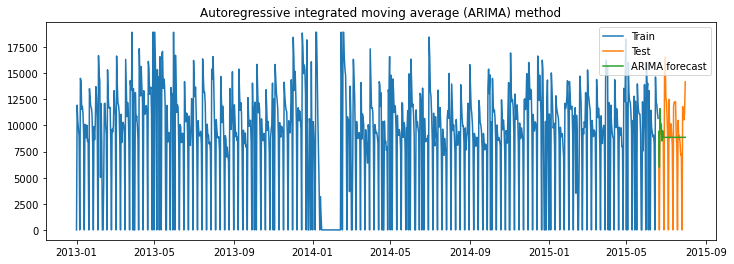

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_arima['arima_forecast'][test.index.min():], label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_arima['arima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_arima['arima_forecast'][test.index.min():])/test['Sales'])*100,2)

results = pd.DataFrame({'Store':['Store_25'],'Method':['Autoregressive integrated moving average (ARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_25,Autoregressive integrated moving average (ARIM...,4003.91,11982294.46


## Seasonal auto regressive integrated moving average (SARIMA)

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 1, 7)) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


ar.S.L7    9.998735e-01
ma.S.L7   -9.559488e-01
sigma2     1.275555e+07
dtype: float64


In [ ]:
y_hat_sarima = Store_25_Target.copy()
y_hat_sarima['sarima_forecast'] = model_fit.predict(Store_25_Target.index.min(), Store_25_Target.index.max())

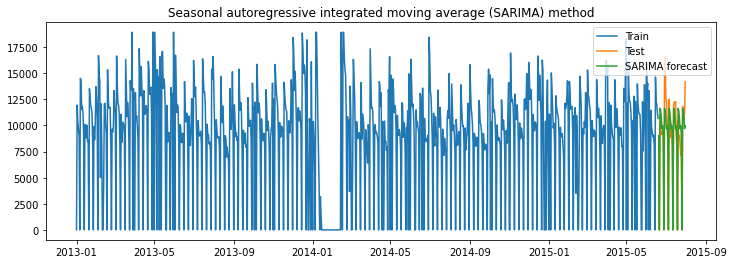

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('Seasonal autoregressive integrated moving average (SARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarima['sarima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarima['sarima_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_25'],'Method':['Seasonal autoregressive integrated moving average (SARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_25,Autoregressive integrated moving average (ARIM...,4003.91,11982294.46
0,Store_25,Seasonal autoregressive integrated moving aver...,1704.89,12.05


## Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)

In [ ]:
### Split promotion data into train and test data sets
promo_train = Store_25_Exon[:train_len]
promo_test = Store_25_Exon[train_len:]

In [ ]:
model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 1, 7), exog=promo_train) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Promo      3.292510e+03
ar.S.L7    9.999991e-01
ma.S.L7   -9.965752e-01
sigma2     1.073507e+07
dtype: float64


C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
y_hat_sarimax = Store_25_Target.copy()
y_hat_sarimax['sarimax_forecast'] = model_fit.predict(Store_25_Target.index.min(), Store_25_Target.index.max(), exog=promo_test)

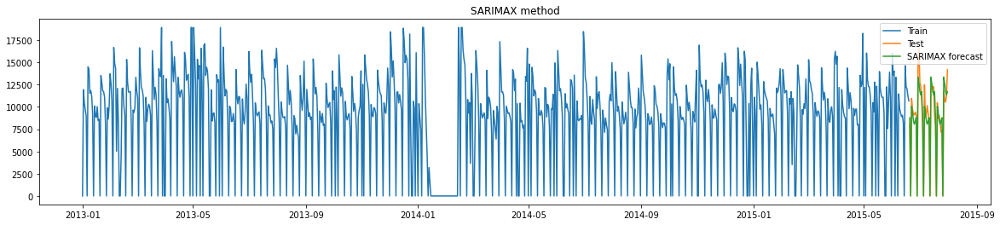

In [ ]:
plt.figure(figsize=(20,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarimax['sarimax_forecast'][test.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarimax['sarimax_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarimax['sarimax_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_25'],'Method':['SARIMAX method with Promo'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_25,Autoregressive integrated moving average (ARIM...,4003.91,11982294.46
0,Store_25,Seasonal autoregressive integrated moving aver...,1704.89,12.05
0,Store_25,SARIMAX method with Promo,1252.62,9.01


## VAR & VARMAX

In [ ]:
# Copy data set
df=Store_25.copy()

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,S_Sales_1,S_Customers_1
Date,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,NaN,NaN
2013-01-02,3,11944.01,1698.1,1,0,1,1,1,NaN,NaN
2013-01-03,4,10409.01,1587.1,1,0,1,1,1,NaN,NaN


In [ ]:
# Drop Unneseccary Columns
df.drop(['WeekOfYear','S_Sales_1','S_Customers_1'],inplace=True,axis=1)

***Create dummy variables***

In [ ]:
dummies=pd.get_dummies(df['DayOfWeek'],drop_first=True,prefix='DayOfWeek')
df=pd.concat([df,dummies],axis=1)

In [ ]:
dummies=pd.get_dummies(df['StateHoliday'],drop_first=True,prefix='StateHoliday')
df=pd.concat([df,dummies],axis=1)

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,0,0,0,0,0,1,0,0
2013-01-02,3,11944.01,1698.1,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,4,10409.01,1587.1,1,0,1,1,0,0,1,0,0,0,0,0,0


In [ ]:
df.drop(['DayOfWeek','StateHoliday'],axis=1,inplace=True)
df.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,11944.01,1698.1,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,10409.01,1587.1,1,0,1,0,0,1,0,0,0,0,0,0
2013-01-04,9729.01,1520.1,1,0,1,0,0,0,1,0,0,0,0,0
2013-01-05,8987.01,1381.1,1,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
# Casulaity Check
from statsmodels.tsa.stattools import grangercausalitytests
causality_sales=grangercausalitytests(df[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=57.9060 , p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=58.0912 , p=0.0000  , df=1
likelihood ratio test: chi2=56.3686 , p=0.0000  , df=1
parameter F test:         F=57.9060 , p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=30.1959 , p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=60.7147 , p=0.0000  , df=2
likelihood ratio test: chi2=58.8345 , p=0.0000  , df=2
parameter F test:         F=30.1959 , p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=19.2534 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=58.1939 , p=0.0000  , df=3
likelihood ratio test: chi2=56.4618 , p=0.0000  , df=3
parameter F test:         F=19.2534 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=17.6116 , p=0.0000  

***The Test Indicate casuality between Sales & Customers***

***We have earlier done ADF test & ACF/PACF Plots, sso we won't repeat them here***

In [ ]:
df.shape

(942, 14)

### Train-Test Split

In [ ]:
train_len = 900
train = df[0:train_len] # first 900 day as training set
test = df[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
train.head(3)

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,11944.01,1698.1,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,10409.01,1587.1,1,0,1,0,0,1,0,0,0,0,0,0


### Standardising numerical values in test-train datasets using minmax

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Fit transform on train data

scaler = MinMaxScaler()
train[['Sales','Customers']]=scaler.fit_transform(train[['Sales','Customers']])
train.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.000000,0.000000,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,0.631130,0.738582,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,0.550019,0.690300,1,0,1,0,0,1,0,0,0,0,0,0
2013-01-04,0.514087,0.661157,1,0,1,0,0,0,1,0,0,0,0,0
2013-01-05,0.474880,0.600696,1,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
test[['Sales','Customers']]=scaler.transform(test[['Sales','Customers']])
test.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2015-06-20,0.426266,0.508047,1,0,0,0,0,0,0,1,0,0,0,0
2015-06-21,0.000000,0.000000,0,0,0,0,0,0,0,0,1,0,0,0
2015-06-22,0.579768,0.653328,1,0,0,0,0,0,0,0,0,0,0,0
2015-06-23,0.517205,0.625924,1,0,0,1,0,0,0,0,0,0,0,0
2015-06-24,0.482858,0.588517,1,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
train.columns

Index(['Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4'],
      dtype='object')

In [ ]:
exog = train[[ 'Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=30)
print(res.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -11.56      -11.42   9.520e-06      -11.51
1       -11.77     -11.60*   7.747e-06     -11.71*
2       -11.77      -11.59   7.701e-06      -11.70
3       -11.78      -11.57   7.667e-06      -11.70
4       -11.78      -11.55   7.678e-06      -11.69
5       -11.80      -11.55   7.519e-06      -11.70
6       -11.80      -11.52   7.538e-06      -11.69
7       -11.79      -11.50   7.563e-06      -11.68
8       -11.79      -11.48   7.555e-06      -11.67
9       -11.79      -11.45   7.582e-06      -11.66
10      -11.78      -11.42   7.640e-06      -11.64
11      -11.78      -11.39   7.680e-06      -11.63
12      -11.77      -11.36   7.738e-06      -11.61
13      -11.78      -11.35   7.668e-06      -11.61
14      -11.79      -11.34   7.564e-06      -11.62
15      -11.79      -11.32   7.565e-06      -11.61
16      -11.79      -11.29   7.

***AIC is Lowest at lag 30***

In [ ]:
#Fitting the model with lag 30

var_model_final = var_model.fit(30)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 18, May, 2022
Time:                     22:50:09
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.0043
Nobs:                     870.000    HQIC:                  -11.4983
Log likelihood:           2812.01    FPE:                7.47665e-06
AIC:                     -11.8045    Det(Omega_mle):     6.36388e-06
--------------------------------------------------------------------
Results for equation Sales
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const                 -0.034975         0.035492           -0.985           0.324
Open                   0.548987         0.026795           20.488           0.000
Promo                  0.098701         0.011815        

### Cointegration test

In [ ]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.vecm import select_coint_rank

def cointegration_test(df, lag): 
    alpha=0.05
    out = coint_johansen(df,-1,lag)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

In [ ]:
train['Sales']=train['Sales'].apply(lambda x:round(x))
train['Customers']=train['Customers'].apply(lambda x:round(x))

In [ ]:
cointegration_test(train[['Sales','Customers']],7)
rank_result=select_coint_rank(train[['Sales','Customers']],-1,1)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  133.72    > 12.3212   =>   True
Customers ::  1.5       > 4.1296    =>   False


In [ ]:
print(rank_result.rank)

2


We have the rank of Johassen test as 2 which means that the time series are stationary but do not seem to be co-integratied

In [ ]:
# Getting lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train[['Sales','Customers']].values[-lag_order:]
forecast_input

30


array([[1, 1],
       [1, 1],
       [0, 1],
       [0, 0],
       [0, 0],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [0, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1]], dtype=int64)

In [ ]:
exog_test = test[['Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=test.index, columns=['Sales','Customers'])
var_forecast

,Sales,Customers
Date,,
2015-06-20,0.352115,0.664894
2015-06-21,-0.544943,-0.357121
2015-06-22,-0.053125,0.230703
2015-06-23,0.190759,0.305668
2015-06-24,0.203809,0.419684
2015-06-25,0.654889,0.825409
2015-06-26,0.753291,0.937704
2015-06-27,0.838814,0.924580
2015-06-28,0.196959,0.166344


In [ ]:
#Adding forecasted values
test['VarForecastedSales']=var_forecast.Sales
test['VarForecastedCustomers']=var_forecast.Customers

In [ ]:
def forecasted_timeseries_visualization(series,forecasted_series,c,model):
    fig = plt.figure(figsize=(20, 3))
    series.plot(label='Actual')
    forecasted_series.plot(label='Forecasted')
    plt.xlabel('Date')
    plt.ylabel(c)
    plt.legend(loc='best')
    plt.title('{} model For {}'.format(model,c))
    plt.show()

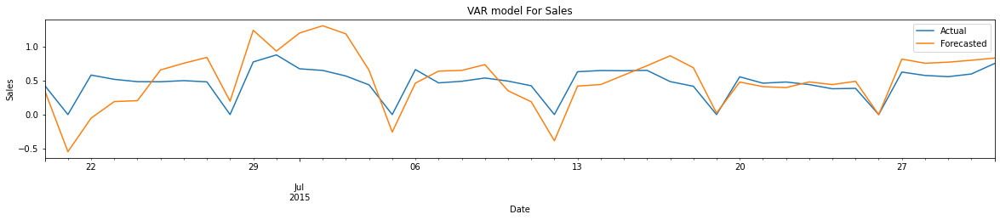

In [ ]:
forecasted_timeseries_visualization(test['Sales'],test['VarForecastedSales'],'Sales','VAR')


In [ ]:
from sklearn.metrics import mean_squared_error
summary_df=pd.DataFrame(columns=['Store','Model','RMSE_SALES','MAPE_SALES','RMSE_CUSTOMERS','MAPE_CUSTOMERS'])

def summary(s,fs,c,fc,store,model):
    rmse_sales = np.sqrt(mean_squared_error(s, fs)).round(2)
    mape_sales = np.round(np.mean(np.abs(s-fs)/s)*100,2)
    rmse_customers = np.sqrt(mean_squared_error(c, fc)).round(2)
    mape_customers = np.round(np.mean(np.abs(c-fc)/c)*100,2)
    temp=pd.DataFrame({'Store':[store],'Model':[model], 'RMSE_SALES': [rmse_sales],'MAPE_SALES': [mape_sales] , 
                            'RMSE_CUSTOMERS': [rmse_customers],'MAPE_CUSTOMERS': [mape_customers]})
    return temp

In [ ]:
d=summary(test['Sales'], test['VarForecastedSales'],
       test['Customers'], test['VarForecastedCustomers'],'Store_25','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head()

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_25,VAR,0.29,inf,0.27,inf


In [ ]:
#modelling

exog = train[['Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                 114.375
                              + intercept   AIC                           -114.749
Date:                    Wed, 18 May 2022   BIC                            158.987
Time:                            22:51:09   HQIC                           -10.180
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             1.01, 0.66   Jarque-Bera (JB):       4.61, 12819.55
Prob(Q):                        0.31, 0.42   Prob(JB):                   0.10, 0.00
Heteroskedasticity (H):         1.06, 0.89   Skew:                     -0.16, -3.84
P

In [ ]:
#forecasting on test data

exog_test = test[['Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog_test= test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=test.index.min(),end=test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.376354,0.934497
2015-06-21,0.022942,0.014955
2015-06-22,0.783533,0.971582
2015-06-23,0.488595,0.954953
2015-06-24,0.460779,0.930174


In [ ]:
#Adding forecasted values

test['VarmaxForecastedSales']=varmax_forecast.Sales
test['VarmaxForecastedCustomers']=varmax_forecast.Customers

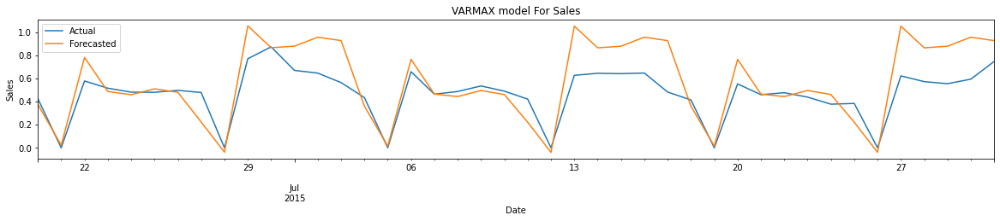

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_25,VAR,0.29,inf,0.27,inf
0,Store_25,VARMAX,0.20,inf,0.34,inf


In [ ]:
#Plotting time series

forecasted_timeseries_visualization(test['Sales'],test['VarmaxForecastedSales'],'Sales','VARMAX')
#Printing results

d=summary(test['Sales'], test['VarmaxForecastedSales'],
       test['Customers'], test['VarmaxForecastedCustomers'],'Store_25','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head()

 


## Building Model for Store 29

In [ ]:
Store_29=data[(data.Store==29)]
Store_29.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,
2013-01-01,29,2,0.01,0.1,0,0,2,1,1,0,0
2013-01-02,29,3,5269.01,550.1,1,0,1,1,1,0,0
2013-01-03,29,4,4554.01,456.1,1,0,1,1,1,0,0
2013-01-04,29,5,5411.01,505.1,1,0,1,1,1,0,0
2013-01-05,29,6,5564.01,537.1,1,0,1,0,1,0,0


In [ ]:
# Some columns will have single value , dropping then. This step not done earlier as columns would had nan also
# Promo 2 Interval is zero , thus promo 2 is not applicable
for col in Store_29.columns:
    if len(Store_29[col].unique()) == 1:
        Store_29.drop(col,inplace=True,axis=1)

In [ ]:
Store_29.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear
Date,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1
2013-01-02,3,5269.01,550.1,1,0,1,1,1
2013-01-03,4,4554.01,456.1,1,0,1,1,1
2013-01-04,5,5411.01,505.1,1,0,1,1,1
2013-01-05,6,5564.01,537.1,1,0,1,0,1


In [ ]:
Store_29.shape

(942, 8)

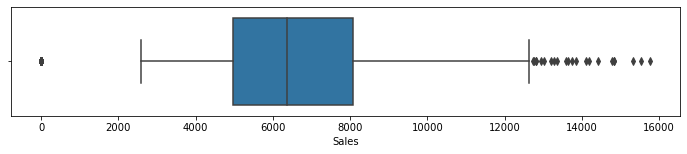

In [ ]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_29['Sales'],whis=1.5)

- Few outliers at max side
- However , it feels that these are at begining of the year
- Imputing these values to 99th percentile

In [ ]:
Store_29['Sales']=Store_29[['Sales']].clip(upper=Store_29.quantile(0.99),axis=1)

In [ ]:
Store_29['Customers']=Store_29[['Customers']].clip(upper=Store_29.quantile(0.99),axis=1)

In [ ]:
Store_29.shape

(942, 8)

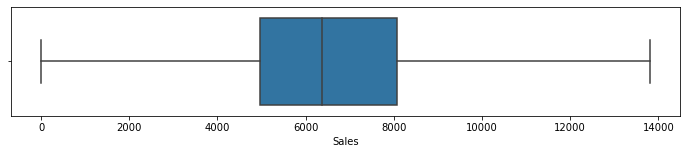

In [ ]:
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_29['Sales'],whis=2)

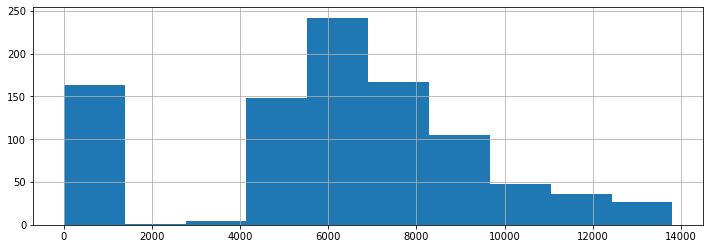

In [ ]:
fig = Store_29['Sales'].hist(figsize = (12,4))

- Near Zero sales mean that store is closed

In [ ]:
# Data description
Store_29.describe()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear
count,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000
mean,3.997877,6080.311062,540.255945,0.826964,0.382166,1.045648,0.180467,24.098726
std,1.998404,3408.568472,276.497601,0.378479,0.486175,0.286125,0.384780,14.547508
min,1.000000,0.010000,0.100000,0.000000,0.000000,1.000000,0.000000,1.000000
25%,2.000000,4972.510000,498.600000,1.000000,0.000000,1.000000,0.000000,12.000000
50%,4.000000,6361.510000,598.100000,1.000000,0.000000,1.000000,0.000000,23.000000
75%,6.000000,8072.010000,703.100000,1.000000,1.000000,1.000000,0.000000,36.000000
max,7.000000,13808.270000,1054.690000,1.000000,1.000000,4.000000,1.000000,52.000000


## Time series Decomposition

### Additive seasonal decomposition

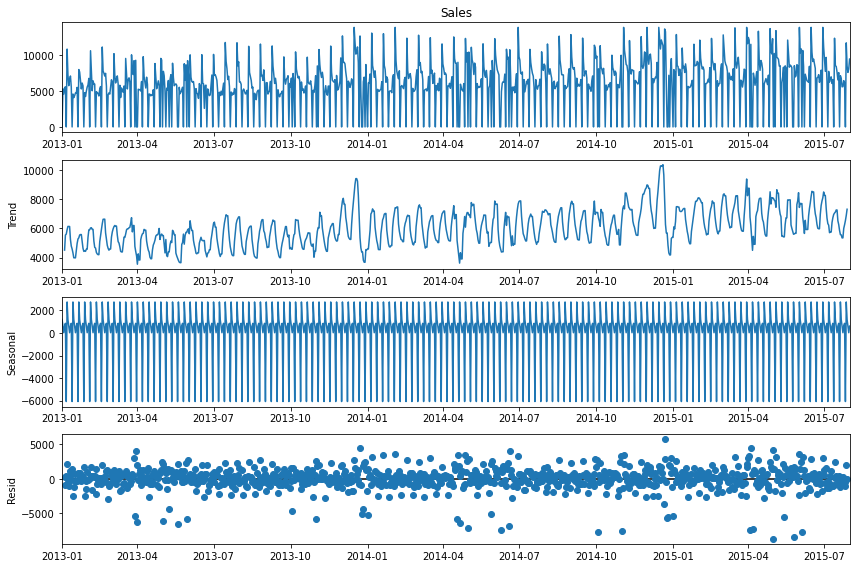

In [ ]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(Store_29.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

***There is clear seasonality in data , & It shows trend & Variation***

### Multiplicative seasonal decomposition

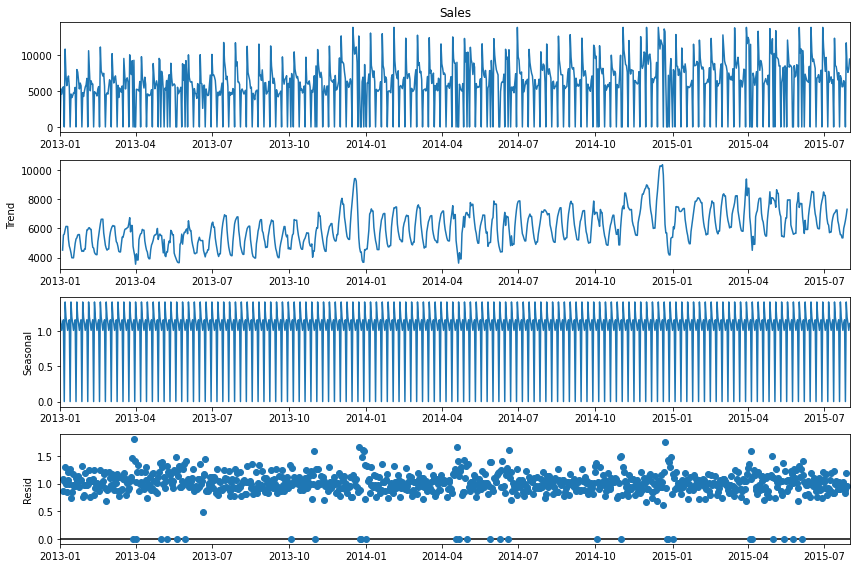

In [ ]:
decomposition = sm.tsa.seasonal_decompose(Store_29.Sales, model='multiplicative') # multiplicative seasonal index
fig = decomposition.plot()
plt.show()

***Again There is clear seasonality in data + trend + variance***

### Testing For Stationarity

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
test_result=adfuller(Store_29['Sales'])

In [ ]:
#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [ ]:
adfuller_test(Store_29['Sales'])

ADF Test Statistic : -3.392591314661029
p-value : 0.011214040939053522
#Lags Used : 20
Number of Observations Used : 921
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


**Data is stationary**

## Handle seasonality

In [ ]:
Store_29['S_Sales_1']=Store_29['Sales']-Store_29['Sales'].shift(7)
Store_29.head(14)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,S_Sales_1
Date,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,NaN
2013-01-02,3,5269.01,550.1,1,0,1,1,1,NaN
2013-01-03,4,4554.01,456.1,1,0,1,1,1,NaN
2013-01-04,5,5411.01,505.1,1,0,1,1,1,NaN
2013-01-05,6,5564.01,537.1,1,0,1,0,1,NaN
2013-01-06,7,0.01,0.1,0,0,1,0,1,NaN
2013-01-07,1,10796.01,863.1,1,1,1,0,2,NaN
2013-01-08,2,7235.01,630.1,1,1,1,0,2,7235.0
2013-01-09,3,5721.01,544.1,1,1,1,0,2,452.0


In [ ]:
## Again test dickey fuller test
adfuller_test(Store_29['S_Sales_1'].dropna())

ADF Test Statistic : -13.298060774099358
p-value : 7.139338770035514e-25
#Lags Used : 20
Number of Observations Used : 914
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<AxesSubplot:xlabel='Date'>

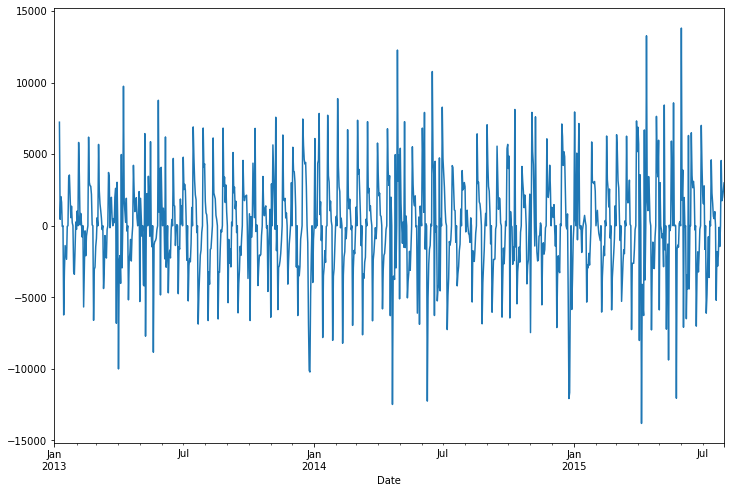

In [ ]:
Store_29['S_Sales_1'].plot()

In [ ]:
Store_29['S_Customers_1']=Store_29['Customers']-Store_29['Customers'].shift(7)

In [ ]:
## Again test dickey fuller test
adfuller_test(Store_29['S_Customers_1'].dropna())

ADF Test Statistic : -12.525599095317029
p-value : 2.4927643800088122e-23
#Lags Used : 21
Number of Observations Used : 913
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


## ACF & PACF

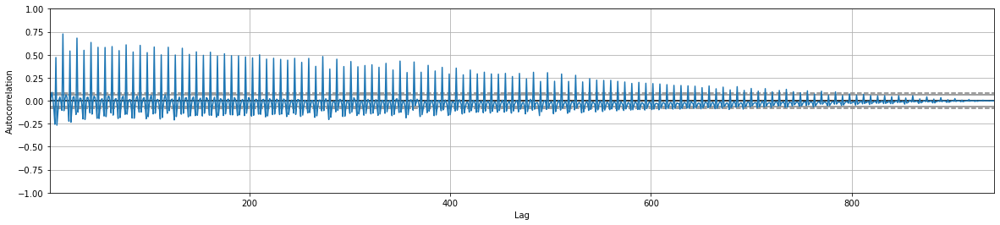

In [ ]:
from pandas.plotting import autocorrelation_plot
fig = plt.subplots(figsize=(20, 4))
ax=autocorrelation_plot(Store_29['Sales'])
plt.show()

In [ ]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

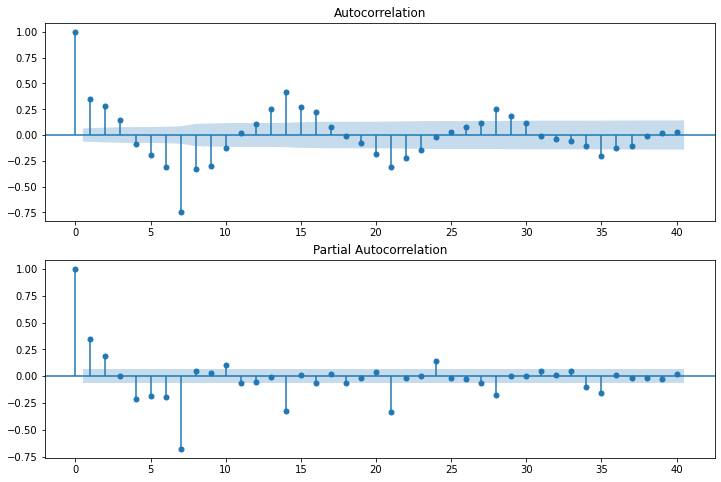

In [ ]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(Store_29['S_Sales_1'].iloc[7:],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(Store_29['S_Sales_1'].iloc[13:],lags=40,ax=ax2)

# Build and evaluate time series forecast

## ARIMA ,SARIMA & SARIMAX

In [ ]:
# Split Data set into target & Exonous variables
Store_29_Target=Store_29[['Sales']].copy()
Store_29_Exon=Store_29[['Promo']]

In [ ]:
Store_29_Target.head(2)

,Sales
Date,
2013-01-01,0.01
2013-01-02,5269.01


In [ ]:
Store_29_Exon.head(2)

,Promo
Date,
2013-01-01,0
2013-01-02,0


## Split time series data into training and test set

In [ ]:
train_len = 900
train = Store_29_Target[0:train_len] # first 900 day as training set
test = Store_29_Target[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

In [ ]:

model=ARIMA(train['Sales'],order=(0,0,7))
model_fit=model.fit()

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


In [ ]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(0, 7)   Log Likelihood               -8501.395
Method:                       css-mle   S.D. of innovations           3060.707
Date:                Wed, 18 May 2022   AIC                          17020.789
Time:                        22:51:13   BIC                          17064.011
Sample:                    01-01-2013   HQIC                         17037.300
                         - 06-19-2015                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        6051.2737    107.454     56.315      0.000    5840.668    6261.880
ma.L1.Sales     0.0055      0.033      0.170      0.865      -0.058       0.069
ma.L2.Sales     0.0969      0.032      3.009      0.003       0.034       0.160
ma.L3.Sales     0.0889      0.033      2.730      0.006       0.025       0.153
ma.L4.Sales     0.0108      0.029      0.369      0.712      -0.046       0.068
ma.L5.Sales    -0.0966      0.032     -3.004      0.003      -0.160      -0.034
ma.L6.Sales    -0.2889      0.034     -8.429      0.000      -0.356      -0.222
ma.L7.Sales     0.2366      0.025      9.428      0.000       0.187       0.286
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1           -1.1344           -0.0000j            1.1344           -0.5000
MA.2           -0.6602           -0.9279j            1.1388           -0.3484
MA.3           -0.6602           +0.9279j            1.1388            0.3484
MA.4            0.3955           -1.0513j            1.1232           -0.1927
MA.5            0.3955           +1.0513j            1.1232            0.1927
MA.6            1.4425           -0.4430j            1.5090           -0.0474
MA.7            1.4425           +0.4430j            1.5090            0.0474
-----------------------------------------------------------------------------
"""

In [ ]:
y_hat_arima = Store_29_Target.copy()
y_hat_arima['arima_forecast'] = model_fit.predict(Store_29_Target.index.min(), Store_29_Target.index.max())

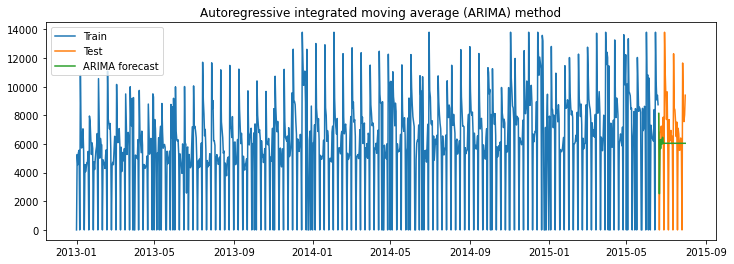

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_arima['arima_forecast'][test.index.min():], label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_arima['arima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_arima['arima_forecast'][test.index.min():])/test['Sales'])*100,2)

results = pd.DataFrame({'Store':['Store_29'],'Method':['Autoregressive integrated moving average (ARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_29,Autoregressive integrated moving average (ARIM...,3178.26,7805540.1


## Seasonal auto regressive integrated moving average (SARIMA)

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 1, 7)) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


ar.S.L7    9.998352e-01
ma.S.L7   -9.449496e-01
sigma2     4.734555e+06
dtype: float64


In [ ]:
y_hat_sarima = Store_29_Target.copy()
y_hat_sarima['sarima_forecast'] = model_fit.predict(Store_29_Target.index.min(), Store_29_Target.index.max())

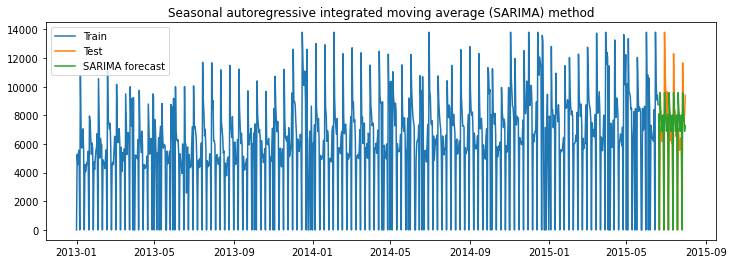

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('Seasonal autoregressive integrated moving average (SARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarima['sarima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarima['sarima_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_29'],'Method':['Seasonal autoregressive integrated moving average (SARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_29,Autoregressive integrated moving average (ARIM...,3178.26,7805540.10
0,Store_29,Seasonal autoregressive integrated moving aver...,1552.87,15.17


## Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)

In [ ]:
### Split promotion data into train and test data sets
promo_train = Store_29_Exon[:train_len]
promo_test = Store_29_Exon[train_len:]

In [ ]:
model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 1, 7), exog=promo_train) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Promo      3.068010e+03
ar.S.L7    9.997243e-01
ma.S.L7   -9.258334e-01
sigma2     2.956404e+06
dtype: float64


In [ ]:
y_hat_sarimax = Store_29_Target.copy()
y_hat_sarimax['sarimax_forecast'] = model_fit.predict(Store_29_Target.index.min(), Store_29_Target.index.max(), exog=promo_test)

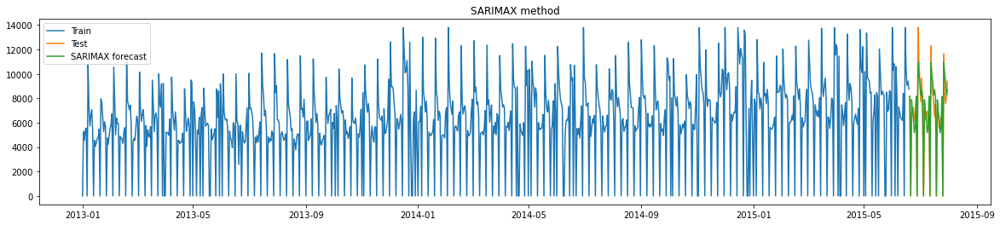

In [ ]:
plt.figure(figsize=(20,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarimax['sarimax_forecast'][test.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarimax['sarimax_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarimax['sarimax_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_29'],'Method':['SARIMAX method with Promo'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_29,Autoregressive integrated moving average (ARIM...,3178.26,7805540.10
0,Store_29,Seasonal autoregressive integrated moving aver...,1552.87,15.17
0,Store_29,SARIMAX method with Promo,1077.63,10.83


## VAR & VARMAX

In [ ]:
# Copy data set
df=Store_29.copy()

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,S_Sales_1,S_Customers_1
Date,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,NaN,NaN
2013-01-02,3,5269.01,550.1,1,0,1,1,1,NaN,NaN
2013-01-03,4,4554.01,456.1,1,0,1,1,1,NaN,NaN


In [ ]:
# Drop Unneseccary Columns
df.drop(['WeekOfYear','S_Sales_1','S_Customers_1'],inplace=True,axis=1)

***Create dummy variables***

In [ ]:
dummies=pd.get_dummies(df['DayOfWeek'],drop_first=True,prefix='DayOfWeek')
df=pd.concat([df,dummies],axis=1)

In [ ]:
dummies=pd.get_dummies(df['StateHoliday'],drop_first=True,prefix='StateHoliday')
df=pd.concat([df,dummies],axis=1)

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,0,0,0,0,0,1,0,0
2013-01-02,3,5269.01,550.1,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,4,4554.01,456.1,1,0,1,1,0,0,1,0,0,0,0,0,0


In [ ]:
df.drop(['DayOfWeek','StateHoliday'],axis=1,inplace=True)
df.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,5269.01,550.1,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,4554.01,456.1,1,0,1,0,0,1,0,0,0,0,0,0
2013-01-04,5411.01,505.1,1,0,1,0,0,0,1,0,0,0,0,0
2013-01-05,5564.01,537.1,1,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
# Casulaity Check
from statsmodels.tsa.stattools import grangercausalitytests
causality_sales=grangercausalitytests(df[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=334.7191, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=335.7896, p=0.0000  , df=1
likelihood ratio test: chi2=287.1565, p=0.0000  , df=1
parameter F test:         F=334.7191, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=188.8138, p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=379.6469, p=0.0000  , df=2
likelihood ratio test: chi2=318.8852, p=0.0000  , df=2
parameter F test:         F=188.8138, p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=125.2472, p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=378.5638, p=0.0000  , df=3
likelihood ratio test: chi2=318.0621, p=0.0000  , df=3
parameter F test:         F=125.2472, p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=93.9802 , p=0.0000  

***The Test Indicate casuality between Sales & Customers***

***We have earlier done ADF test & ACF/PACF Plots, sso we won't repeat them here***

In [ ]:
df.shape

(942, 14)

### Train-Test Split

In [ ]:
train_len = 900
train = df[0:train_len] # first 900 day as training set
test = df[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
train.head(3)

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,5269.01,550.1,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,4554.01,456.1,1,0,1,0,0,1,0,0,0,0,0,0


### Standardising numerical values in test-train datasets using minmax

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Fit transform on train data

scaler = MinMaxScaler()
train[['Sales','Customers']]=scaler.fit_transform(train[['Sales','Customers']])
train.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.000000,0.000000,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,0.381583,0.521530,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,0.329803,0.432396,1,0,1,0,0,1,0,0,0,0,0,0
2013-01-04,0.391867,0.478859,1,0,1,0,0,0,1,0,0,0,0,0
2013-01-05,0.402947,0.509203,1,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
test[['Sales','Customers']]=scaler.transform(test[['Sales','Customers']])
test.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2015-06-20,0.587837,0.702643,1,0,0,0,0,0,0,1,0,0,0,0
2015-06-21,0.000000,0.000000,0,0,0,0,0,0,0,0,1,0,0,0
2015-06-22,0.492314,0.581269,1,0,0,0,0,0,0,0,0,0,0,0
2015-06-23,0.497890,0.545236,1,0,0,1,0,0,0,0,0,0,0,0
2015-06-24,0.525120,0.601182,1,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
train.columns

Index(['Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4'],
      dtype='object')

In [ ]:
exog = train[[ 'Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=30)
print(res.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -12.15      -12.01   5.265e-06      -12.10
1       -12.24      -12.07   4.839e-06      -12.18
2       -12.26      -12.07   4.758e-06      -12.18
3       -12.27      -12.07   4.668e-06      -12.20
4       -12.28      -12.05   4.639e-06      -12.19
5       -12.29      -12.04   4.584e-06      -12.20
6       -12.31      -12.03   4.515e-06      -12.20
7       -12.33      -12.04   4.402e-06      -12.22
8       -12.42      -12.10   4.044e-06      -12.30
9       -12.46      -12.12   3.894e-06      -12.33
10      -12.51      -12.15   3.697e-06      -12.37
11      -12.53      -12.14   3.632e-06      -12.38
12      -12.52      -12.12   3.636e-06      -12.37
13      -12.54      -12.11   3.592e-06      -12.37
14      -12.60     -12.15*   3.359e-06     -12.43*
15      -12.61      -12.13   3.353e-06      -12.43
16      -12.60      -12.11   3.

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


***AIC is Lowest at lag 30***

In [ ]:
#Fitting the model with lag 30

var_model_final = var_model.fit(30)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 18, May, 2022
Time:                     22:51:17
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.8597
Nobs:                     870.000    HQIC:                  -12.3537
Log likelihood:           3184.12    FPE:                3.17837e-06
AIC:                     -12.6599    Det(Omega_mle):     2.70533e-06
--------------------------------------------------------------------
Results for equation Sales
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const                 -0.292620    268915.439286           -0.000           1.000
Open                   0.326228    268915.439286            0.000           1.000
Promo                  0.195026         0.012147        

### Cointegration test

In [ ]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.vecm import select_coint_rank

def cointegration_test(df, lag): 
    alpha=0.05
    out = coint_johansen(df,-1,lag)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

In [ ]:
train['Sales']=train['Sales'].apply(lambda x:round(x))
train['Customers']=train['Customers'].apply(lambda x:round(x))

In [ ]:
cointegration_test(train[['Sales','Customers']],7)
rank_result=select_coint_rank(train[['Sales','Customers']],-1,1)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  148.51    > 12.3212   =>   True
Customers ::  6.83      > 4.1296    =>   True


In [ ]:
print(rank_result.rank)

2


We have the rank of Johassen test as 2 which means that the time series are stationary but do not seem to be co-integratied

In [ ]:
# Getting lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train[['Sales','Customers']].values[-lag_order:]
forecast_input

30


array([[1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1]], dtype=int64)

In [ ]:
exog_test = test[['Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=test.index, columns=['Sales','Customers'])
var_forecast

,Sales,Customers
Date,,
2015-06-20,0.707954,0.880645
2015-06-21,0.232601,0.200054
2015-06-22,0.910677,0.993022
2015-06-23,0.418888,0.619113
2015-06-24,0.706557,0.855970
2015-06-25,0.636738,0.819981
2015-06-26,0.770112,0.889729
2015-06-27,1.244049,1.252159
2015-06-28,0.265332,0.230456


In [ ]:
#Adding forecasted values
test['VarForecastedSales']=var_forecast.Sales
test['VarForecastedCustomers']=var_forecast.Customers

In [ ]:
def forecasted_timeseries_visualization(series,forecasted_series,c,model):
    fig = plt.figure(figsize=(20, 3))
    series.plot(label='Actual')
    forecasted_series.plot(label='Forecasted')
    plt.xlabel('Date')
    plt.ylabel(c)
    plt.legend(loc='best')
    plt.title('{} model For {}'.format(model,c))
    plt.show()

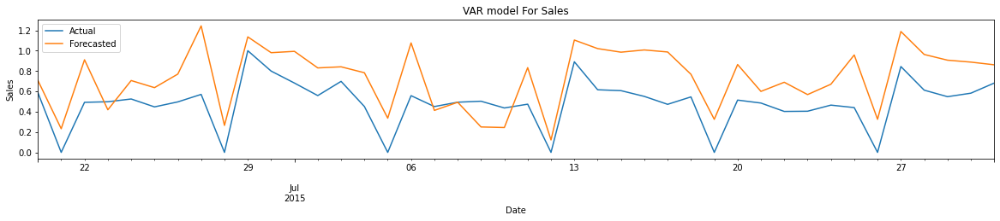

In [ ]:
forecasted_timeseries_visualization(test['Sales'],test['VarForecastedSales'],'Sales','VAR')


In [ ]:
from sklearn.metrics import mean_squared_error
summary_df=pd.DataFrame(columns=['Store','Model','RMSE_SALES','MAPE_SALES','RMSE_CUSTOMERS','MAPE_CUSTOMERS'])

def summary(s,fs,c,fc,store,model):
    rmse_sales = np.sqrt(mean_squared_error(s, fs)).round(2)
    mape_sales = np.round(np.mean(np.abs(s-fs)/s)*100,2)
    rmse_customers = np.sqrt(mean_squared_error(c, fc)).round(2)
    mape_customers = np.round(np.mean(np.abs(c-fc)/c)*100,2)
    temp=pd.DataFrame({'Store':[store],'Model':[model], 'RMSE_SALES': [rmse_sales],'MAPE_SALES': [mape_sales] , 
                            'RMSE_CUSTOMERS': [rmse_customers],'MAPE_CUSTOMERS': [mape_customers]})
    return temp

In [ ]:
d=summary(test['Sales'], test['VarForecastedSales'],
       test['Customers'], test['VarForecastedCustomers'],'Store_29','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head()

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_29,VAR,0.31,inf,0.33,inf


In [ ]:
#modelling

exog = train[['Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                -966.278
                              + intercept   AIC                           2046.557
Date:                    Wed, 18 May 2022   BIC                           2320.293
Time:                            22:51:25   HQIC                          2151.126
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.02, 1.05   Jarque-Bera (JB):         30.32, 55.91
Prob(Q):                        0.88, 0.31   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.13, 0.44   Skew:                      0.30, -0.54
P

In [ ]:
#forecasting on test data

exog_test = test[['Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog_test= test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=test.index.min(),end=test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.749110,1.109916
2015-06-21,0.468390,0.642035
2015-06-22,0.498625,0.978151
2015-06-23,0.466398,0.971956
2015-06-24,0.402626,0.985983


In [ ]:
#Adding forecasted values

test['VarmaxForecastedSales']=varmax_forecast.Sales
test['VarmaxForecastedCustomers']=varmax_forecast.Customers

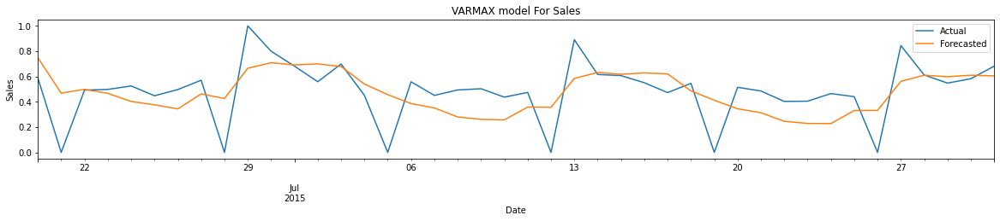

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_29,VAR,0.31,inf,0.33,inf
0,Store_29,VARMAX,0.21,inf,0.31,inf


In [ ]:
#Plotting time series

forecasted_timeseries_visualization(test['Sales'],test['VarmaxForecastedSales'],'Sales','VARMAX')
#Printing results

d=summary(test['Sales'], test['VarmaxForecastedSales'],
       test['Customers'], test['VarmaxForecastedCustomers'],'Store_29','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head()

 


## Building Model for Store 31

In [ ]:
Store_31=data[(data.Store==31)]
Store_31.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,AbsenceOfCompetition,Promo2_Applicable
Date,,,,,,,,,,,
2013-01-01,31,2,0.01,0.1,0,0,2,1,1,0,0
2013-01-02,31,3,5122.01,567.1,1,0,1,1,1,0,0
2013-01-03,31,4,5623.01,578.1,1,0,1,1,1,0,0
2013-01-04,31,5,6140.01,633.1,1,0,1,1,1,0,0
2013-01-05,31,6,5607.01,624.1,1,0,1,0,1,0,0


In [ ]:
# Some columns will have single value , dropping then. This step not done earlier as columns would had nan also
# Promo 2 Interval is zero , thus promo 2 is not applicable
for col in Store_31.columns:
    if len(Store_31[col].unique()) == 1:
        Store_31.drop(col,inplace=True,axis=1)

In [ ]:
Store_31.head()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear
Date,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1
2013-01-02,3,5122.01,567.1,1,0,1,1,1
2013-01-03,4,5623.01,578.1,1,0,1,1,1
2013-01-04,5,6140.01,633.1,1,0,1,1,1
2013-01-05,6,5607.01,624.1,1,0,1,0,1


In [ ]:
Store_31.shape

(942, 8)

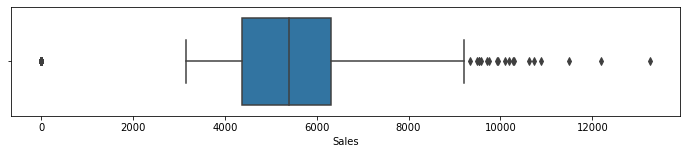

In [ ]:
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_31['Sales'],whis=1.5)

- Few outliers at max side
- However , it feels that these are at begining of the year
- Imputing these values to 99th percentile

In [ ]:
Store_31['Sales']=Store_31[['Sales']].clip(upper=Store_31.quantile(0.99),axis=1)

In [ ]:
Store_31['Customers']=Store_31[['Customers']].clip(upper=Store_31.quantile(0.99),axis=1)

In [ ]:
Store_31.shape

(942, 8)

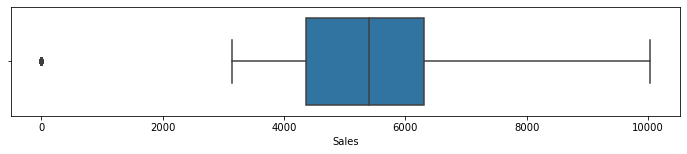

In [ ]:
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=Store_31['Sales'],whis=2)

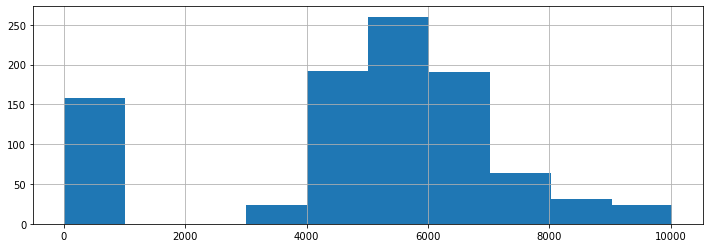

In [ ]:
fig = Store_31['Sales'].hist(figsize = (12,4))

- Near Zero sales mean that store is closed

In [ ]:
# Data description
Store_31.describe()

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear
count,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000
mean,3.997877,4868.838556,486.867622,0.832272,0.382166,1.040340,0.168790,24.098726
std,1.998404,2481.323084,231.979910,0.373823,0.486175,0.277508,0.374765,14.547508
min,1.000000,0.010000,0.100000,0.000000,0.000000,1.000000,0.000000,1.000000
25%,2.000000,4370.260000,485.100000,1.000000,0.000000,1.000000,0.000000,12.000000
50%,4.000000,5403.010000,558.100000,1.000000,0.000000,1.000000,0.000000,23.000000
75%,6.000000,6316.010000,614.100000,1.000000,1.000000,1.000000,0.000000,36.000000
max,7.000000,10030.560000,877.310000,1.000000,1.000000,4.000000,1.000000,52.000000


## Time series Decomposition

### Additive seasonal decomposition

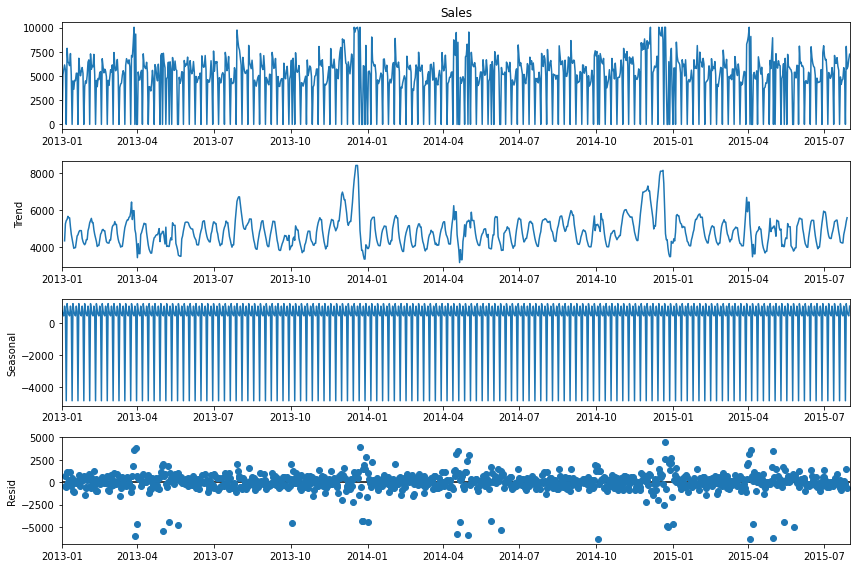

In [ ]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 12, 8
decomposition = sm.tsa.seasonal_decompose(Store_31.Sales, model='additive') # additive seasonal index
fig = decomposition.plot()
plt.show()

***There is clear seasonality in data , & It shows trend & Variation***

### Multiplicative seasonal decomposition

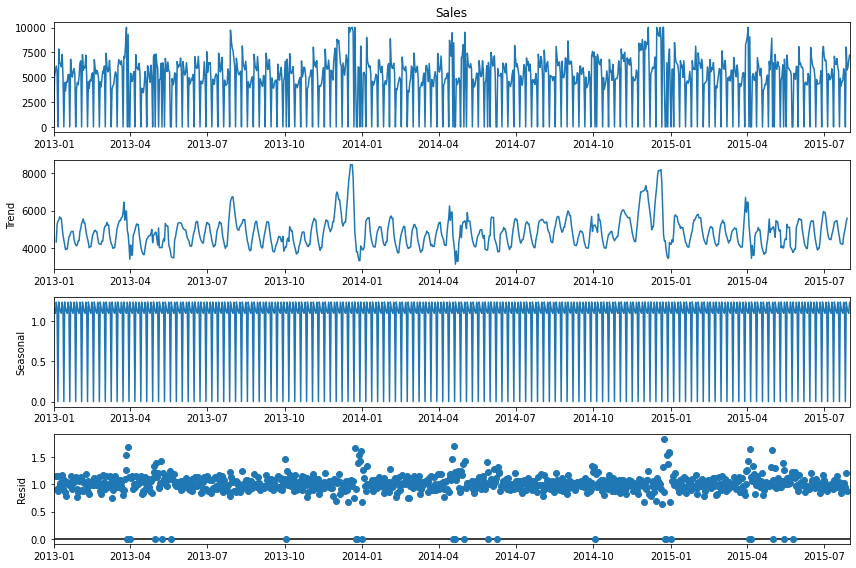

In [ ]:
decomposition = sm.tsa.seasonal_decompose(Store_31.Sales, model='multiplicative') # multiplicative seasonal index
fig = decomposition.plot()
plt.show()

***Again There is clear seasonality in data + trend + variance***

### Testing For Stationarity

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
test_result=adfuller(Store_31['Sales'])

In [ ]:
#Ho: It is non stationary
#H1: It is stationary

def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")


In [ ]:
adfuller_test(Store_31['Sales'])

ADF Test Statistic : -4.966031538008304
p-value : 2.58976254891154e-05
#Lags Used : 21
Number of Observations Used : 920
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


**Data is stationary**

## Handle seasonality

In [ ]:
Store_31['S_Sales_1']=Store_31['Sales']-Store_31['Sales'].shift(7)
Store_31.head(14)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,S_Sales_1
Date,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,NaN
2013-01-02,3,5122.01,567.1,1,0,1,1,1,NaN
2013-01-03,4,5623.01,578.1,1,0,1,1,1,NaN
2013-01-04,5,6140.01,633.1,1,0,1,1,1,NaN
2013-01-05,6,5607.01,624.1,1,0,1,0,1,NaN
2013-01-06,7,0.01,0.1,0,0,1,0,1,NaN
2013-01-07,1,7857.01,743.1,1,1,1,0,2,NaN
2013-01-08,2,6480.01,612.1,1,1,1,0,2,6480.0
2013-01-09,3,6335.01,571.1,1,1,1,0,2,1213.0


In [ ]:
## Again test dickey fuller test
adfuller_test(Store_31['S_Sales_1'].dropna())

ADF Test Statistic : -10.68184112181981
p-value : 3.922171376599645e-19
#Lags Used : 21
Number of Observations Used : 913
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


<AxesSubplot:xlabel='Date'>

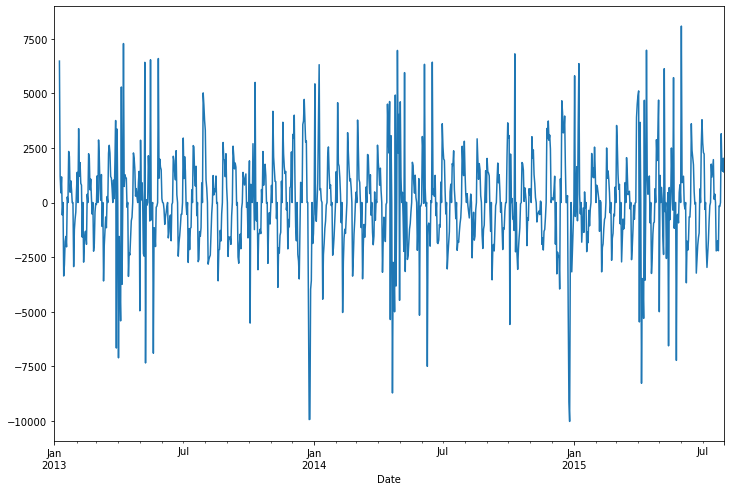

In [ ]:
Store_31['S_Sales_1'].plot()

In [ ]:
Store_31['S_Customers_1']=Store_31['Customers']-Store_31['Customers'].shift(7)

In [ ]:
## Again test dickey fuller test
adfuller_test(Store_31['S_Customers_1'].dropna())

ADF Test Statistic : -12.234177300733524
p-value : 1.0371809855707013e-22
#Lags Used : 20
Number of Observations Used : 914
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary


## ACF & PACF

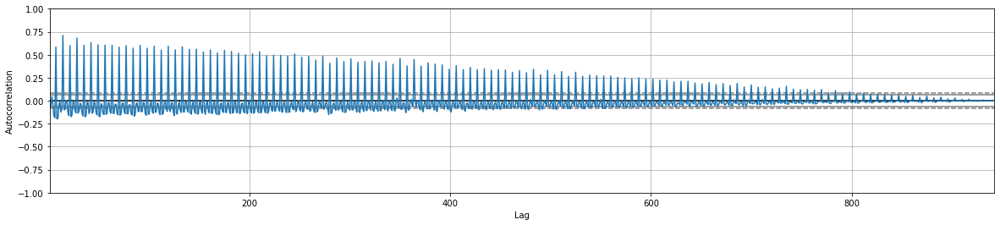

In [ ]:
from pandas.plotting import autocorrelation_plot
fig = plt.subplots(figsize=(20, 4))
ax=autocorrelation_plot(Store_31['Sales'])
plt.show()

In [ ]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

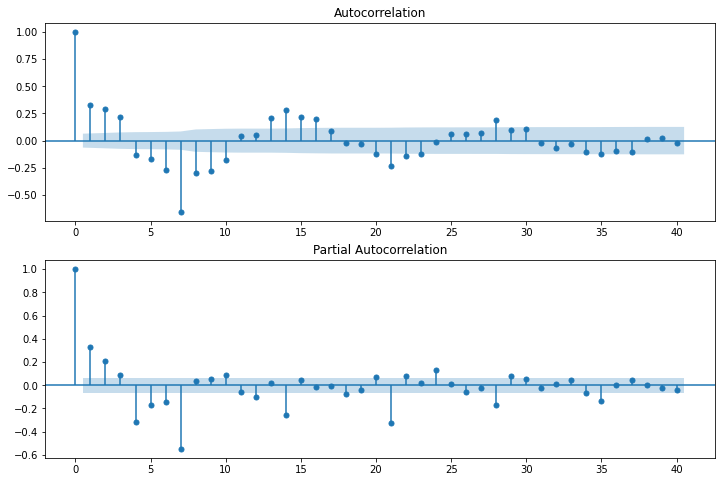

In [ ]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(Store_31['S_Sales_1'].iloc[7:],lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(Store_31['S_Sales_1'].iloc[13:],lags=40,ax=ax2)

# Build and evaluate time series forecast

## ARIMA ,SARIMA & SARIMAX

In [ ]:
# Split Data set into target & Exonous variables
Store_31_Target=Store_31[['Sales']].copy()
Store_31_Exon=Store_31[['Promo']]

In [ ]:
Store_31_Target.head(2)

,Sales
Date,
2013-01-01,0.01
2013-01-02,5122.01


In [ ]:
Store_31_Exon.head(2)

,Promo
Date,
2013-01-01,0
2013-01-02,0


## Split time series data into training and test set

In [ ]:
train_len = 900
train = Store_31_Target[0:train_len] # first 900 day as training set
test = Store_31_Target[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

In [ ]:

model=ARIMA(train['Sales'],order=(0,0,7))
model_fit=model.fit()

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


In [ ]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(0, 7)   Log Likelihood               -8182.927
Method:                       css-mle   S.D. of innovations           2148.160
Date:                Wed, 18 May 2022   AIC                          16383.854
Time:                        22:51:29   BIC                          16427.076
Sample:                    01-01-2013   HQIC                         16400.365
                         - 06-19-2015                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        4866.0172     67.562     72.023      0.000    4733.598    4998.436
ma.L1.Sales     0.0298      0.033      0.905      0.365      -0.035       0.094
ma.L2.Sales     0.0310      0.032      0.977      0.329      -0.031       0.093
ma.L3.Sales     0.0666      0.034      1.970      0.049       0.000       0.133
ma.L4.Sales    -0.0842      0.031     -2.692      0.007      -0.146      -0.023
ma.L5.Sales    -0.1473      0.031     -4.782      0.000      -0.208      -0.087
ma.L6.Sales    -0.2610      0.040     -6.486      0.000      -0.340      -0.182
ma.L7.Sales     0.3084      0.026     12.090      0.000       0.258       0.358
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
MA.1           -1.0943           -0.0000j            1.0943           -0.5000
MA.2           -0.6829           -0.9075j            1.1357           -0.3527
MA.3           -0.6829           +0.9075j            1.1357            0.3527
MA.4            0.3344           -1.0485j            1.1006           -0.2009
MA.5            0.3344           +1.0485j            1.1006            0.2009
MA.6            1.3188           -0.3967j            1.3772           -0.0465
MA.7            1.3188           +0.3967j            1.3772            0.0465
-----------------------------------------------------------------------------
"""

In [ ]:
y_hat_arima = Store_31_Target.copy()
y_hat_arima['arima_forecast'] = model_fit.predict(Store_31_Target.index.min(), Store_31_Target.index.max())

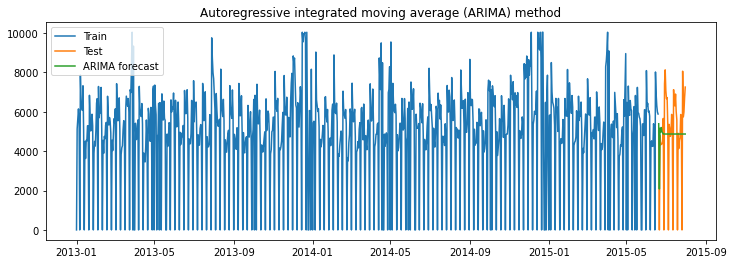

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_arima['arima_forecast'][test.index.min():], label='ARIMA forecast')
plt.legend(loc='best')
plt.title('Autoregressive integrated moving average (ARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_arima['arima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_arima['arima_forecast'][test.index.min():])/test['Sales'])*100,2)

results = pd.DataFrame({'Store':['Store_31'],'Method':['Autoregressive integrated moving average (ARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_31,Autoregressive integrated moving average (ARIM...,2148.78,6287921.21


## Seasonal auto regressive integrated moving average (SARIMA)

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 1, 7)) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


ar.S.L7    9.999995e-01
ma.S.L7   -9.963256e-01
sigma2     2.241022e+06
dtype: float64


In [ ]:
y_hat_sarima = Store_31_Target.copy()
y_hat_sarima['sarima_forecast'] = model_fit.predict(Store_31_Target.index.min(), Store_31_Target.index.max())

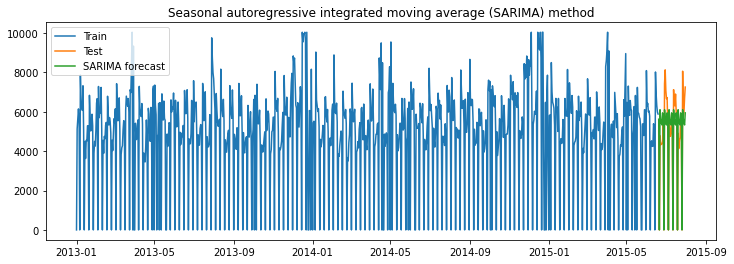

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test.index.min():], label='SARIMA forecast')
plt.legend(loc='best')
plt.title('Seasonal autoregressive integrated moving average (SARIMA) method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarima['sarima_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarima['sarima_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_31'],'Method':['Seasonal autoregressive integrated moving average (SARIMA) method'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_31,Autoregressive integrated moving average (ARIM...,2148.78,6287921.21
0,Store_31,Seasonal autoregressive integrated moving aver...,976.95,13.09


## Seasonal auto regressive integrate moving average with exogenous variable (SARIMAX)

In [ ]:
### Split promotion data into train and test data sets
promo_train = Store_31_Exon[:train_len]
promo_test = Store_31_Exon[train_len:]

In [ ]:
model = SARIMAX(train, order=(0, 0, 0), seasonal_order=(1, 0, 1, 7), exog=promo_train) 
model_fit = model.fit()
print(model_fit.params)

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Promo      1.870005e+03
ar.S.L7    9.999732e-01
ma.S.L7   -9.746777e-01
sigma2     1.627005e+06
dtype: float64


In [ ]:
y_hat_sarimax = Store_31_Target.copy()
y_hat_sarimax['sarimax_forecast'] = model_fit.predict(Store_31_Target.index.min(), Store_31_Target.index.max(), exog=promo_test)

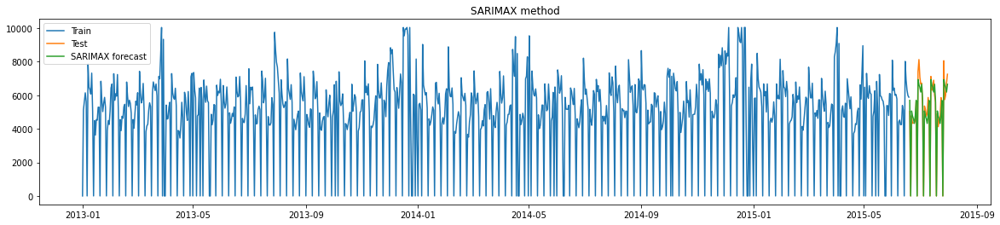

In [ ]:
plt.figure(figsize=(20,4))
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(y_hat_sarimax['sarimax_forecast'][test.index.min():], label='SARIMAX forecast')
plt.legend(loc='best')
plt.title('SARIMAX method')
plt.show()

In [ ]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_sarimax['sarimax_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_sarimax['sarimax_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Store':['Store_31'],'Method':['SARIMAX method with Promo'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results = results[['Store','Method', 'RMSE', 'MAPE']]
results

,Store,Method,RMSE,MAPE
0,Store_31,Autoregressive integrated moving average (ARIM...,2148.78,6287921.21
0,Store_31,Seasonal autoregressive integrated moving aver...,976.95,13.09
0,Store_31,SARIMAX method with Promo,531.95,6.81


## VAR & VARMAX

In [ ]:
# Copy data set
df=Store_31.copy()

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,WeekOfYear,S_Sales_1,S_Customers_1
Date,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,NaN,NaN
2013-01-02,3,5122.01,567.1,1,0,1,1,1,NaN,NaN
2013-01-03,4,5623.01,578.1,1,0,1,1,1,NaN,NaN


In [ ]:
# Drop Unneseccary Columns
df.drop(['WeekOfYear','S_Sales_1','S_Customers_1'],inplace=True,axis=1)

***Create dummy variables***

In [ ]:
dummies=pd.get_dummies(df['DayOfWeek'],drop_first=True,prefix='DayOfWeek')
df=pd.concat([df,dummies],axis=1)

In [ ]:
dummies=pd.get_dummies(df['StateHoliday'],drop_first=True,prefix='StateHoliday')
df=pd.concat([df,dummies],axis=1)

In [ ]:
df.head(3)

,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,,,
2013-01-01,2,0.01,0.1,0,0,2,1,1,0,0,0,0,0,1,0,0
2013-01-02,3,5122.01,567.1,1,0,1,1,0,1,0,0,0,0,0,0,0
2013-01-03,4,5623.01,578.1,1,0,1,1,0,0,1,0,0,0,0,0,0


In [ ]:
df.drop(['DayOfWeek','StateHoliday'],axis=1,inplace=True)
df.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,5122.01,567.1,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,5623.01,578.1,1,0,1,0,0,1,0,0,0,0,0,0
2013-01-04,6140.01,633.1,1,0,1,0,0,0,1,0,0,0,0,0
2013-01-05,5607.01,624.1,1,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
# Casulaity Check
from statsmodels.tsa.stattools import grangercausalitytests
causality_sales=grangercausalitytests(df[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=289.1030, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=290.0276, p=0.0000  , df=1
likelihood ratio test: chi2=252.8104, p=0.0000  , df=1
parameter F test:         F=289.1030, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=163.6505, p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=329.0513, p=0.0000  , df=2
likelihood ratio test: chi2=282.1363, p=0.0000  , df=2
parameter F test:         F=163.6505, p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=111.5120, p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=337.0487, p=0.0000  , df=3
likelihood ratio test: chi2=287.9989, p=0.0000  , df=3
parameter F test:         F=111.5120, p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=90.7212 , p=0.0000  

***The Test Indicate casuality between Sales & Customers***

***We have earlier done ADF test & ACF/PACF Plots, sso we won't repeat them here***

In [ ]:
df.shape

(942, 14)

### Train-Test Split

In [ ]:
train_len = 900
train = df[0:train_len] # first 900 day as training set
test = df[train_len:] # last 42 days (6 weeks) as out-of-time test set

In [ ]:
train.head(3)

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.01,0.1,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,5122.01,567.1,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,5623.01,578.1,1,0,1,0,0,1,0,0,0,0,0,0


### Standardising numerical values in test-train datasets using minmax

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Fit transform on train data

scaler = MinMaxScaler()
train[['Sales','Customers']]=scaler.fit_transform(train[['Sales','Customers']])
train.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2013-01-01,0.000000,0.000000,0,0,1,1,0,0,0,0,0,1,0,0
2013-01-02,0.510640,0.646367,1,0,1,0,1,0,0,0,0,0,0,0
2013-01-03,0.560587,0.658907,1,0,1,0,0,1,0,0,0,0,0,0
2013-01-04,0.612130,0.721606,1,0,1,0,0,0,1,0,0,0,0,0
2013-01-05,0.558992,0.711346,1,0,0,0,0,0,0,1,0,0,0,0


In [ ]:
test[['Sales','Customers']]=scaler.transform(test[['Sales','Customers']])
test.head()

,Sales,Customers,Open,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7,StateHoliday_2,StateHoliday_3,StateHoliday_4
Date,,,,,,,,,,,,,,
2015-06-20,0.501667,0.601908,1,0,0,0,0,0,0,1,0,0,0,0
2015-06-21,0.000000,0.000000,0,0,0,0,0,0,0,0,1,0,0,0
2015-06-22,0.476444,0.542629,1,0,0,0,0,0,0,0,0,0,0,0
2015-06-23,0.431382,0.499310,1,0,0,1,0,0,0,0,0,0,0,0
2015-06-24,0.432479,0.552889,1,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
train.columns

Index(['Sales', 'Customers', 'Open', 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7', 'StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4'],
      dtype='object')

In [ ]:
exog = train[[ 'Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=30)
print(res.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -11.98      -11.83   6.293e-06      -11.92
1       -12.14      -11.98   5.336e-06      -12.08
2       -12.17     -11.98*   5.178e-06      -12.10
3       -12.18      -11.97   5.144e-06      -12.10
4       -12.17      -11.94   5.187e-06      -12.08
5       -12.17      -11.92   5.194e-06      -12.07
6       -12.17      -11.90   5.173e-06      -12.07
7       -12.19      -11.89   5.077e-06      -12.08
8       -12.23      -11.91   4.889e-06      -12.11
9       -12.24      -11.90   4.816e-06      -12.11
10      -12.27      -11.91   4.696e-06      -12.13
11      -12.28      -11.90   4.642e-06     -12.13*
12      -12.27      -11.87   4.674e-06      -12.12
13      -12.28      -11.86   4.632e-06      -12.12
14      -12.29      -11.84   4.620e-06      -12.11
15     -12.29*      -11.82  4.603e-06*      -12.11
16      -12.29      -11.79   4.

***AIC is Lowest at lag 30***

In [ ]:
#Fitting the model with lag 15

var_model_final = var_model.fit(15)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 18, May, 2022
Time:                     22:51:32
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.8337
Nobs:                     885.000    HQIC:                  -12.1209
Log likelihood:           3016.67    FPE:                4.55824e-06
AIC:                     -12.2987    Det(Omega_mle):     4.14560e-06
--------------------------------------------------------------------
Results for equation Sales
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const                 -0.137434              NAN              NAN             NAN
Promo                  0.139500         0.011002           12.679           0.000
SchoolHoliday          0.011209         0.008190        

### Cointegration test

In [ ]:
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.vecm import select_coint_rank

def cointegration_test(df, lag): 
    alpha=0.05
    out = coint_johansen(df,-1,lag)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)

In [ ]:
train['Sales']=train['Sales'].apply(lambda x:round(x))
train['Customers']=train['Customers'].apply(lambda x:round(x))

In [ ]:
cointegration_test(train[['Sales','Customers']],7)
rank_result=select_coint_rank(train[['Sales','Customers']],-1,1)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  175.12    > 12.3212   =>   True
Customers ::  0.56      > 4.1296    =>   False


In [ ]:
print(rank_result.rank)

2


We have the rank of Johassen test as 2 which means that the time series are stationary but do not seem to be co-integratied

In [ ]:
# Getting lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train[['Sales','Customers']].values[-lag_order:]
forecast_input

15


array([[1, 1],
       [1, 1],
       [0, 0],
       [0, 1],
       [0, 1],
       [0, 1],
       [0, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 1]], dtype=int64)

In [ ]:
exog_test = test[['Promo', 'SchoolHoliday', 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7','Open','StateHoliday_2', 'StateHoliday_3', 'StateHoliday_4']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=test.index, columns=['Sales','Customers'])
var_forecast

,Sales,Customers
Date,,
2015-06-20,0.465157,0.657874
2015-06-21,-0.430585,-0.253041
2015-06-22,0.099992,0.429959
2015-06-23,0.348073,0.598067
2015-06-24,0.256817,0.518361
2015-06-25,0.553289,0.756506
2015-06-26,0.796864,0.920889
2015-06-27,0.596219,0.707449
2015-06-28,0.044946,0.046270


In [ ]:
#Adding forecasted values
test['VarForecastedSales']=var_forecast.Sales
test['VarForecastedCustomers']=var_forecast.Customers

In [ ]:
def forecasted_timeseries_visualization(series,forecasted_series,c,model):
    fig = plt.figure(figsize=(20, 3))
    series.plot(label='Actual')
    forecasted_series.plot(label='Forecasted')
    plt.xlabel('Date')
    plt.ylabel(c)
    plt.legend(loc='best')
    plt.title('{} model For {}'.format(model,c))
    plt.show()

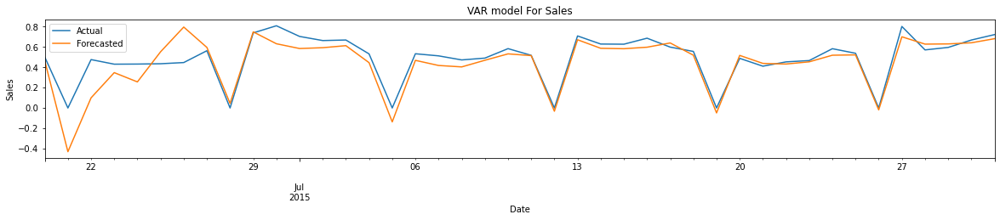

In [ ]:
forecasted_timeseries_visualization(test['Sales'],test['VarForecastedSales'],'Sales','VAR')


In [ ]:
from sklearn.metrics import mean_squared_error
summary_df=pd.DataFrame(columns=['Store','Model','RMSE_SALES','MAPE_SALES','RMSE_CUSTOMERS','MAPE_CUSTOMERS'])

def summary(s,fs,c,fc,store,model):
    rmse_sales = np.sqrt(mean_squared_error(s, fs)).round(2)
    mape_sales = np.round(np.mean(np.abs(s-fs)/s)*100,2)
    rmse_customers = np.sqrt(mean_squared_error(c, fc)).round(2)
    mape_customers = np.round(np.mean(np.abs(c-fc)/c)*100,2)
    temp=pd.DataFrame({'Store':[store],'Model':[model], 'RMSE_SALES': [rmse_sales],'MAPE_SALES': [mape_sales] , 
                            'RMSE_CUSTOMERS': [rmse_customers],'MAPE_CUSTOMERS': [mape_customers]})
    return temp

In [ ]:
d=summary(test['Sales'], test['VarForecastedSales'],
       test['Customers'], test['VarForecastedCustomers'],'Store_31','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head()

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_31,VAR,0.12,inf,0.09,inf


In [ ]:
#modelling

exog = train[[ 'DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7']].astype(float)
endog = train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

C:\Users\gaura\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                 -15.435
                              + intercept   AIC                            120.871
Date:                    Wed, 18 May 2022   BIC                            336.979
Time:                            22:52:14   HQIC                           203.426
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (L1) (Q):             0.00, 0.00   Jarque-Bera (JB):       93.33, 9973.89
Prob(Q):                        0.98, 0.98   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.14, 1.11   Skew:                     -0.74, -3.58
P

In [ ]:
#forecasting on test data

exog_test = test[['DayOfWeek_2',
       'DayOfWeek_3', 'DayOfWeek_4', 'DayOfWeek_5', 'DayOfWeek_6',
       'DayOfWeek_7']].astype(float)
endog_test= test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=test.index.min(),end=test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.797718,0.990928
2015-06-21,-0.060400,-0.008624
2015-06-22,0.485601,0.929787
2015-06-23,0.455100,0.934532
2015-06-24,0.411412,0.948392


In [ ]:
#Adding forecasted values

test['VarmaxForecastedSales']=varmax_forecast.Sales
test['VarmaxForecastedCustomers']=varmax_forecast.Customers

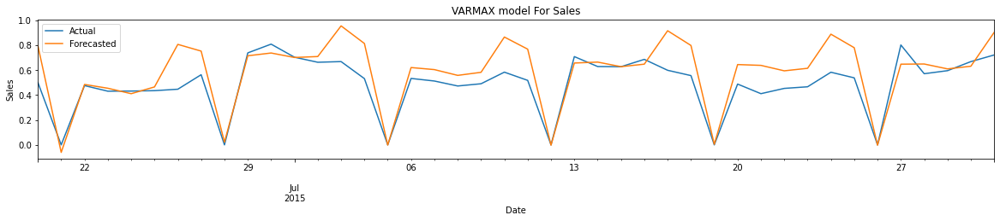

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,Store_31,VAR,0.12,inf,0.09,inf
0,Store_31,VARMAX,0.16,inf,0.31,inf


In [ ]:
#Plotting time series

forecasted_timeseries_visualization(test['Sales'],test['VarmaxForecastedSales'],'Sales','VARMAX')
#Printing results

d=summary(test['Sales'], test['VarmaxForecastedSales'],
       test['Customers'], test['VarmaxForecastedCustomers'],'Store_31','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head()

 
